In [1]:
# Packages
import warnings
warnings.filterwarnings("ignore")
import numpy as np
from scipy import stats
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm

In [2]:
# Install a pip package in the current Jupyter kernel
import sys
import importlib.util

# For illustrative purposes.
package_name = 'pmdarima'

spec = importlib.util.find_spec(package_name)
if spec is None:
 !{sys.executable} -m pip install pmdarima --user
!pip install pmdarima --user

In [3]:
# Plot settings
sns.set_context('notebook') 
sns.set_style('ticks')
red='#D62728'
blue='#1F77B4'
%matplotlib inline

In [4]:
data = pd.read_csv('solar_halfhour.csv')
data['datetime'] = pd.to_datetime(data['datetime'])  # Convert the data in the Month column to datetime
data.set_index('datetime', inplace=True) 
data

,Customer,value
datetime,,
2010-07-01 00:00:00+00:00,1,0.125
2010-07-01 00:30:00+00:00,1,0.303
2010-07-01 01:00:00+00:00,1,0.471
2010-07-01 01:30:00+00:00,1,0.083
2010-07-01 02:00:00+00:00,1,0.121
...,...,...
2013-06-30 21:30:00+00:00,4,0.183
2013-06-30 22:00:00+00:00,4,0.134
2013-06-30 22:30:00+00:00,4,0.137


## EXPLORATORY DATA ANALYSIS
#### DATA PROCESSING

As examining the dataset we recognised that the dataset was rather clean and did not contain any missing datas. Thus, there should not be any further data cleaning for this dataset.

In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 206544 entries, 2010-07-01 00:00:00+00:00 to 2013-06-30 23:30:00+00:00
Data columns (total 2 columns):
 #   Column    Non-Null Count   Dtype  
---  ------    --------------   -----  
 0   Customer  206544 non-null  int64  
 1   value     206544 non-null  float64
dtypes: float64(1), int64(1)
memory usage: 4.7 MB


In [6]:
missing_values = data.isna().sum()  # Alternatively, you can use data.isnull()

# Display the result
print(missing_values)

Customer    0
value       0
dtype: int64


In [7]:
customers = data['Customer'].unique()
customers

array([1, 2, 3, 4], dtype=int64)

In [8]:
df_dict = {}
#
## Loop over each customer
for name in customers:
    # Filter the dataset to include only rows where the name matches the current unique customer ID
    filtered_df = data[data['Customer'] == name]
    categorised_df = pd.DataFrame(filtered_df)['value'].copy()
    categorised_df.index = categorised_df.index.to_period(freq='30T')
    df_dict['c' + str(name)] = categorised_df
    df_dict['c' + str(name) +'_day'] = categorised_df.resample('D').mean()
    df_dict['c' + str(name) +'_month'] = categorised_df.resample('M').sum()

In [9]:
df_dict

{'c1': datetime
 2010-07-01 00:00    0.125
 2010-07-01 00:30    0.303
 2010-07-01 01:00    0.471
 2010-07-01 01:30    0.083
 2010-07-01 02:00    0.121
                     ...  
 2013-06-30 21:30    0.260
 2013-06-30 22:00    0.274
 2013-06-30 22:30    0.509
 2013-06-30 23:00    0.166
 2013-06-30 23:30    0.861
 Freq: 30T, Name: value, Length: 52608, dtype: float64,
 'c1_day': datetime
 2010-07-01    0.666333
 2010-07-02    0.565958
 2010-07-03    0.531792
 2010-07-04    0.747354
 2010-07-05    0.651625
                 ...   
 2013-06-26    0.465958
 2013-06-27    0.242417
 2013-06-28    0.372042
 2013-06-29    0.249729
 2013-06-30    0.424146
 Freq: D, Name: value, Length: 1096, dtype: float64,
 'c1_month': datetime
 2010-07    763.816
 2010-08    582.823
 2010-09    606.201
 2010-10    518.285
 2010-11    454.219
 2010-12    354.834
 2011-01    423.145
 2011-02    452.653
 2011-03    535.147
 2011-04    582.434
 2011-05    537.983
 2011-06    318.646
 2011-07    446.303
 2011-08    

As aggregation will induce be some bias in the days that have not been fully oberved, for those days that do not have the full cycle observed. Therefore some data might be missing, I will handle this by replacing those missing data points with the mean of the time series.

In [10]:
c1 = df_dict['c1']
c1_day = df_dict['c1_day']
c1_month = df_dict['c1_month']

c2 = df_dict['c2']
c2_day = df_dict['c2_day']
c2_month = df_dict['c2_month']

c3 = df_dict['c3']
c3_day = df_dict['c3_day']
c3_month = df_dict['c3_month']

c4 = df_dict['c4']
c4_day = df_dict['c4_day']
c4_month = df_dict['c4_month']

ts_na = [c1,c1_day,c1_month,c2,c2_day,c2_month,c3,c3_day,c3_month,c4,c4_day,c4_month]

ts = []

for time_series in ts_na:
    mean_value = time_series.mean()
    time_series.fillna(mean_value, inplace=True)
    ts.append(time_series)

By printing each keyword and its time series, i get some ideas about the frequency of each time series, which is the time interval that they are recorded. In the code cell below, I listed out the possible seasonal period of each of the time series for later investigation and analysis of their seasonality. 

- For 30-minute frequency, potential seasonal windows can be
    - 48: daily seasonality
    - 17520: yearly seasonality
- For daily frequency, potential seasonal windows can be:
    - 7: weekly seasonality
    - 365: yearly seasonality
- For monthly frequency, potential seasonal windows can be:
    - 6: half-yearly seasonality
    - 12: yearly seasonality

In [11]:
import pandas as pd

m_values = {}

for name, time_series in df_dict.items():
    if isinstance(time_series.index, pd.DatetimeIndex):
        freq = pd.infer_freq(time_series.index)
    elif isinstance(time_series.index, pd.PeriodIndex):
        freq = time_series.index.freq
    else:
        freq = None  # Handle other index types as neede

    if freq is not None:
        if freq == '30T':
            m_values[name] = [48,48*365]  
        elif freq == 'D':
            m_values[name] = [7,365]  
        elif freq == 'M':
            m_values[name] = [6,12]
            
print("m_values:")
for keyword, values in m_values.items():
    print(f"{keyword}: {values}")

m_values:
c1: [48, 17520]
c1_day: [7, 365]
c1_month: [6, 12]
c2: [48, 17520]
c2_day: [7, 365]
c2_month: [6, 12]
c3: [48, 17520]
c3_day: [7, 365]
c3_month: [6, 12]
c4: [48, 17520]
c4_day: [7, 365]
c4_month: [6, 12]


In [12]:
name = ['c1','c1_day','c1_month','c2','c2_day','c2_month','c3','c3_day','c3_month','c4','c4_day','c4_month']

train_sets = {}
test_sets = {}
validation_sets = {}

for time_series, name in zip(ts, name):
    if isinstance(time_series.index, pd.DatetimeIndex):
        freq = pd.infer_freq(time_series.index)
    elif isinstance(time_series.index, pd.PeriodIndex):
        freq = time_series.index.freq
        

    if freq is not None:
        if freq == '30T':
            train_set = time_series[:-48*2]
            validation_set = time_series[-48*2:-48]
            test_set = time_series[-48:]  # last 48 observation

        elif freq == 'D':
            train_set = time_series[:-7*2]
            validation_set = time_series[-7*2:-7]
            test_set = time_series[-7:]  # last 7 observation
        elif freq == 'M':
            train_set = time_series[:-1*2]
            validation_set = time_series[-1*2:-1]
            test_set = time_series[-1:]  # last observation
   
    # Store the train, validation, and test sets with their associated keyword in the dictionaries
    train_sets[name] = train_set
    validation_sets[name] = validation_set
    test_sets[name] = test_set
    
    #covert to period
    if isinstance(train_set, pd.DatetimeIndex):
        frequency_train = pd.infer_freq(train_set.index)
        train_set.index = train_set.index.to_period(frequency_train)
    elif isinstance(validation_set, pd.DatetimeIndex):
        frequency_valid = pd.infer_freq(validation_set.index)
        validation_set.index = validation_set.index.to_period(frequency_valid)
    elif isinstance(test_set, pd.DatetimeIndex):
        frequency_test = pd.infer_freq(test_set.index)
        test_set.index = test_set.index.to_period(frequency_test)
        


In [13]:
# Combine train and validation sets into a single set for later testing 
combined_train_sets = {}
for name in train_sets.keys():
    train_set = train_sets[name]
    validation_set = validation_sets[name]
    combined_train_set = pd.concat([train_set, validation_set])
    combined_train_sets[name] = combined_train_set   
    
for name, train_set in train_sets.items():
    print(f"Train Set for {name}:")
    print(train_set)
    
for name, validation_set in validation_sets.items():
    print(f"Validation Set for {name}:")
    print(validation_set)

for name, combined_train_set in combined_train_sets.items():
    print(f"Combined Train Set for {name}:")
    print(combined_train_set)
    print()

# Print the test sets
for name, test_set in test_sets.items():
    print(f"Test Set for {name}:")
    print(test_set)
    print()

Train Set for c1:
datetime
2010-07-01 00:00    0.125
2010-07-01 00:30    0.303
2010-07-01 01:00    0.471
2010-07-01 01:30    0.083
2010-07-01 02:00    0.121
                    ...  
2013-06-28 21:30    0.489
2013-06-28 22:00    0.265
2013-06-28 22:30    0.102
2013-06-28 23:00    0.448
2013-06-28 23:30    1.192
Freq: 30T, Name: value, Length: 52512, dtype: float64
Train Set for c1_day:
datetime
2010-07-01    0.666333
2010-07-02    0.565958
2010-07-03    0.531792
2010-07-04    0.747354
2010-07-05    0.651625
                ...   
2013-06-12    0.339167
2013-06-13    0.233208
2013-06-14    0.302729
2013-06-15    0.253021
2013-06-16    0.346646
Freq: D, Name: value, Length: 1082, dtype: float64
Train Set for c1_month:
datetime
2010-07    763.816
2010-08    582.823
2010-09    606.201
2010-10    518.285
2010-11    454.219
2010-12    354.834
2011-01    423.145
2011-02    452.653
2011-03    535.147
2011-04    582.434
2011-05    537.983
2011-06    318.646
2011-07    446.303
2011-08    369.827

datetime
2013-06-24    0.623042
2013-06-25    0.342896
2013-06-26    0.198854
2013-06-27    0.213229
2013-06-28    0.241958
2013-06-29    0.244188
2013-06-30    0.181042
Freq: D, Name: value, dtype: float64

Test Set for c4_month:
datetime
2013-06    417.716
Freq: M, Name: value, dtype: float64



**Exploratory Data Analysis**

- In the Exploratory data analysis part, i used the time decomposition function to plot the time series of each period (30min, D, M) of each customer and their time series component invluding trend and seasonality graph. 

- I also developed a function to test whether a time series isvstationary or not. If it returns stationary, the time series does not have any seasonality. If it returns non-stationary, there is a possible pattern of seasonality in the time series. However,  Eyeballing cannot guarantee a valid justification of the possible time components of the time series.


In [14]:
import statsmodels.api as sm
import matplotlib.pyplot as plt
from statsmodels.tsa.stattools import adfuller

def decompose_and_test_time_series(name, time_series, window_size):
    ts_dec = time_series.copy()
    ts_dec.index = ts_dec.index.to_timestamp()

    decomposition = sm.tsa.seasonal_decompose(ts_dec, period = window_size)
    
    # Plot different components of time series
    fig, axes = plt.subplots(4, 1, figsize=(12, 14))
    fig.suptitle(f"Time Series decomposition of: {name}", fontsize=16)

    axes[0].set_title("Original")
    axes[0].plot(ts_dec.index, ts_dec)

    axes[1].set_title("Trend")
    axes[1].plot(decomposition.trend.index, decomposition.trend)

    axes[2].set_title("Seasonal")
    axes[2].plot(decomposition.seasonal.index, decomposition.seasonal)

    axes[3].set_title("Residual")
    axes[3].scatter(decomposition.resid.index, decomposition.resid)
    axes[3].axhline(y=0, color='black', linestyle='-')  # Add a reference line at y=0

    plt.tight_layout()
    plt.show()

    # Perform ADFuller test
    print(f"Results of ADFuller Test for {name}:")
    dftest = adfuller(time_series, autolag='AIC')
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic', 'p-value', 'Lags', 'Number of Observations'])

    for key, value in dftest[4].items():
        dfoutput['Critical Value (%s)' % key] = value

    print(dfoutput)

    if dftest[0] < dftest[4]["5%"]:
        print('Reject H0 - Time Series is stationary')
    else:
        print('Do not reject H0 - Time series is non-stationary')

##### Exploring time series for Customer 1:

- These time series are recorded in an half-hourly, daily and monthly frequency. 
- Using unit root test or AD-Fuller test, we can see that all 3 timeseries for customer 1 are stationary as no trend and seasonality detected. 
- Having a brief look at all time series, I also observed no pattern of seasonality or trend. By trying different seasonal window sizes, the yearly interval (17520 half-hours, 365 days and 12 months) seems to best capture the time series of component of this customer. 

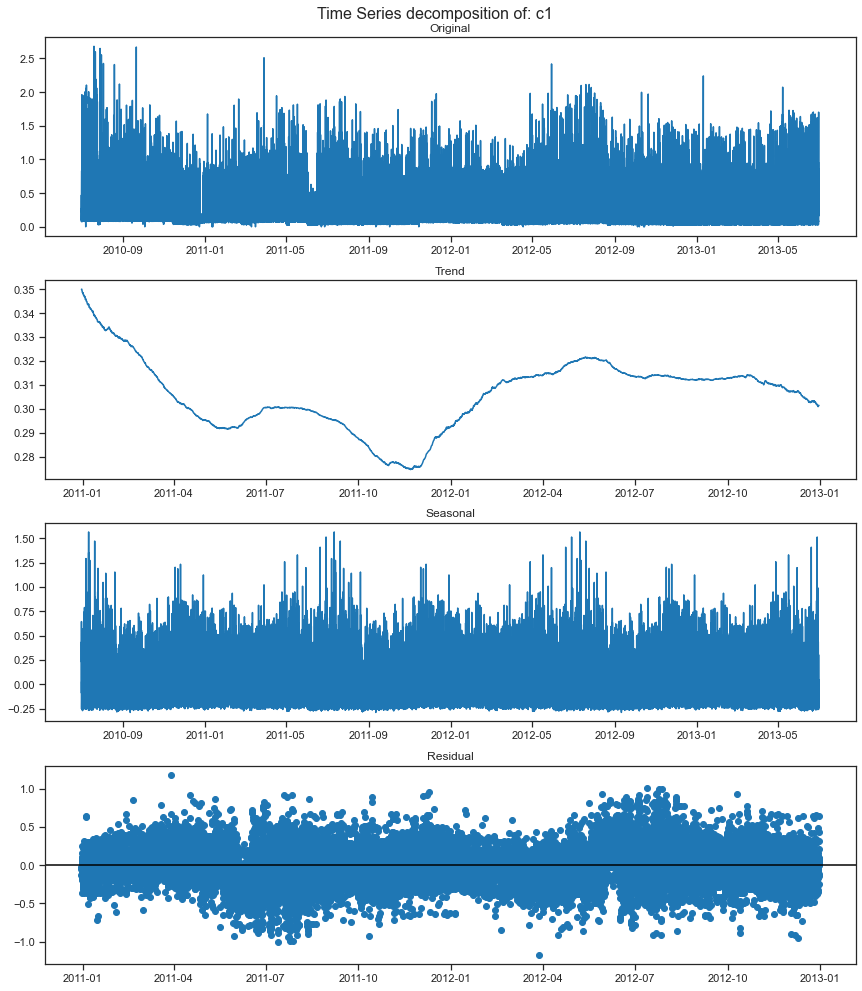

Results of ADFuller Test for c1:
Test Statistic           -1.646077e+01
p-value                   2.331322e-29
Lags                      5.700000e+01
Number of Observations    5.255000e+04
Critical Value (1%)      -3.430474e+00
Critical Value (5%)      -2.861595e+00
Critical Value (10%)     -2.566799e+00
dtype: float64
Reject H0 - Time Series is stationary


In [15]:
#hourly: 1
#daily: 24
#weekly: 168
window_size = 48*365
decompose_and_test_time_series('c1', c1, window_size)

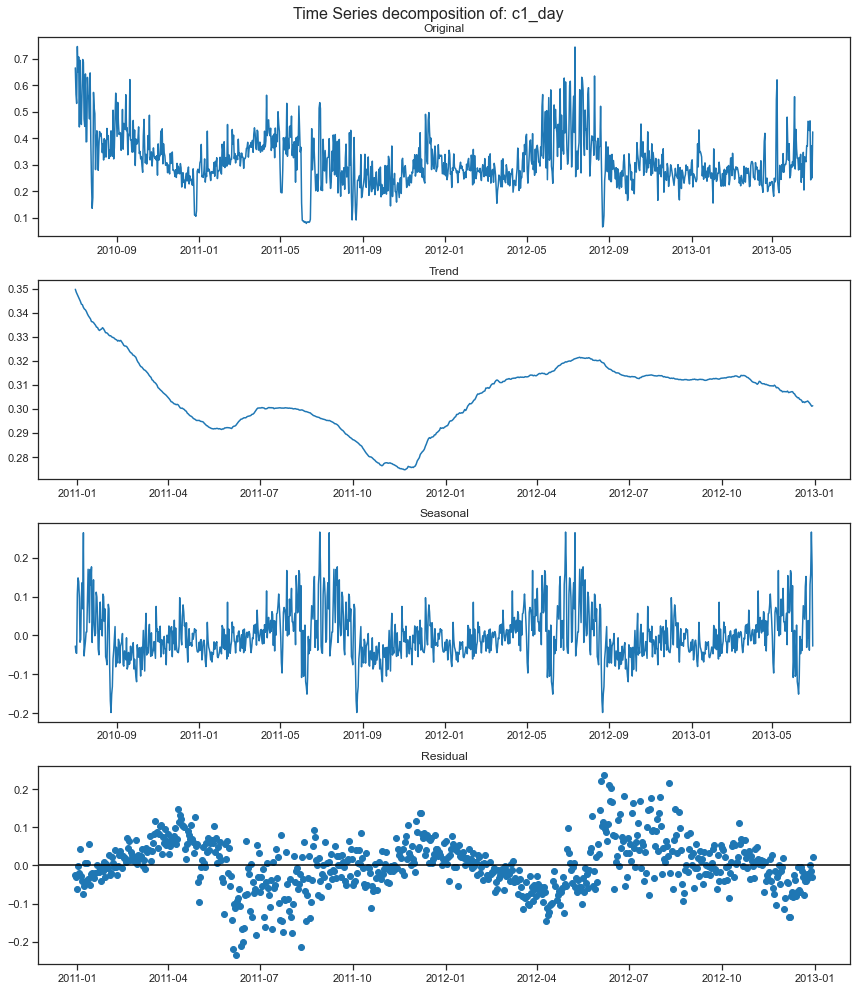

Results of ADFuller Test for c1_day:
Test Statistic              -5.153031
p-value                      0.000011
Lags                         8.000000
Number of Observations    1087.000000
Critical Value (1%)         -3.436380
Critical Value (5%)         -2.864203
Critical Value (10%)        -2.568188
dtype: float64
Reject H0 - Time Series is stationary


In [16]:
#weekly: 168
#Yearly: 365
window_size = 365
decompose_and_test_time_series('c1_day', c1_day, window_size)

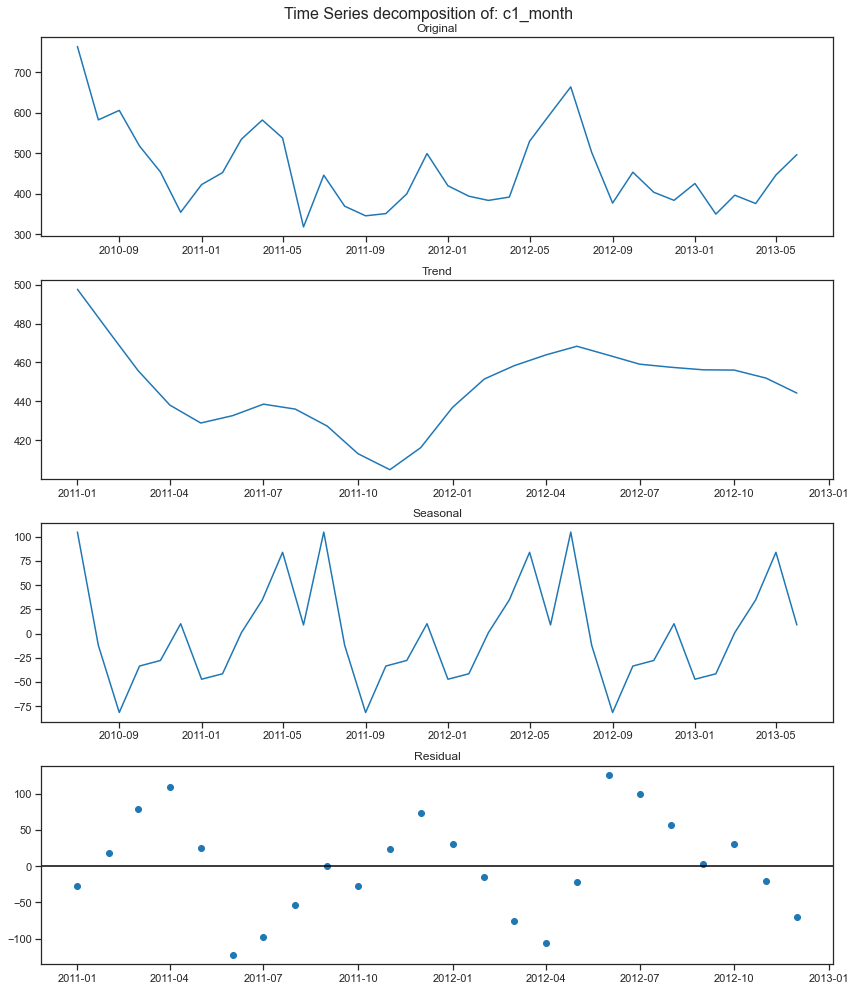

Results of ADFuller Test for c1_month:
Test Statistic            -4.104280
p-value                    0.000953
Lags                       0.000000
Number of Observations    35.000000
Critical Value (1%)       -3.632743
Critical Value (5%)       -2.948510
Critical Value (10%)      -2.613017
dtype: float64
Reject H0 - Time Series is stationary


In [17]:
#half-yearly: 6 
#Yearly: 365
window_size = 12
decompose_and_test_time_series('c1_month', c1_month, window_size)

##### Exploring time series for Customer 2:


- Similar to customer 1,  using unit root test or AD-Fuller test, we can see that all 3 timeseries are stationary as no trend and seasonality detected. 
- Having a brief look at all time series, I also observed no pattern of seasonality or trend. Again the yearly interval (17520 half-hours, 365 days and 12 months) seems to best capture the time series of component of this customer. 

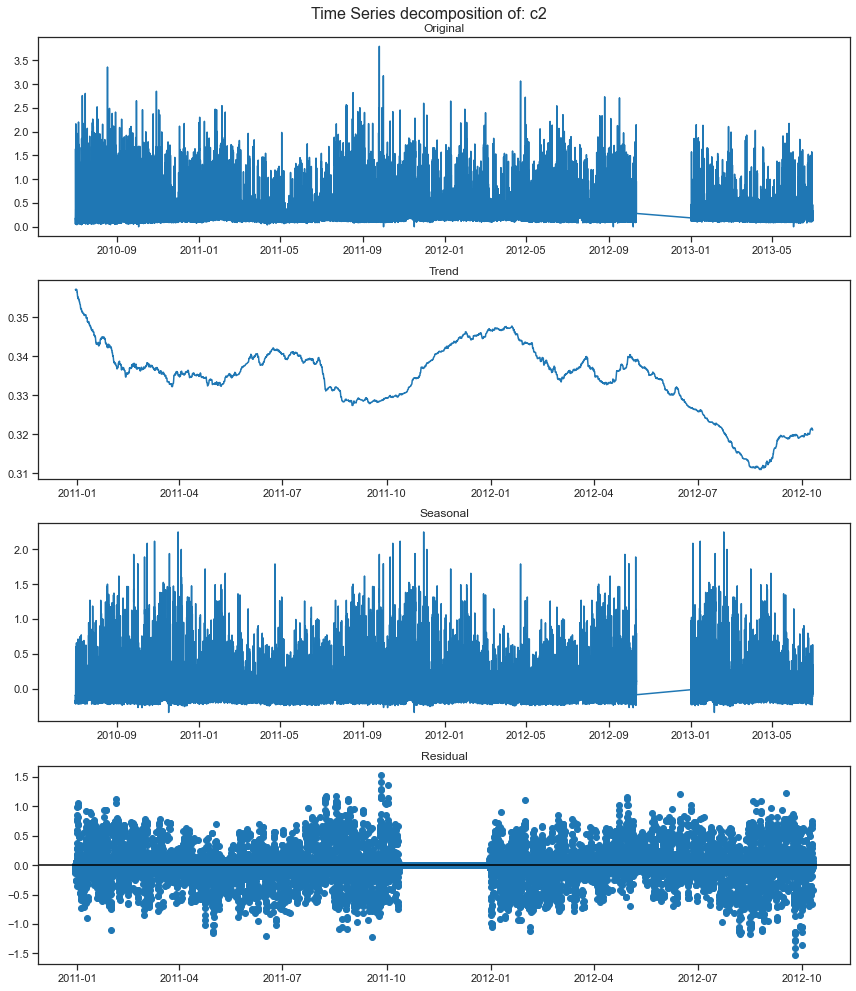

Results of ADFuller Test for c2:
Test Statistic              -19.849107
p-value                       0.000000
Lags                         55.000000
Number of Observations    48664.000000
Critical Value (1%)          -3.430484
Critical Value (5%)          -2.861599
Critical Value (10%)         -2.566802
dtype: float64
Reject H0 - Time Series is stationary


In [18]:
#hourly: 1
#daily: 24
#weekly: 168
window_size = 48*365
decompose_and_test_time_series('c2', c2, window_size)

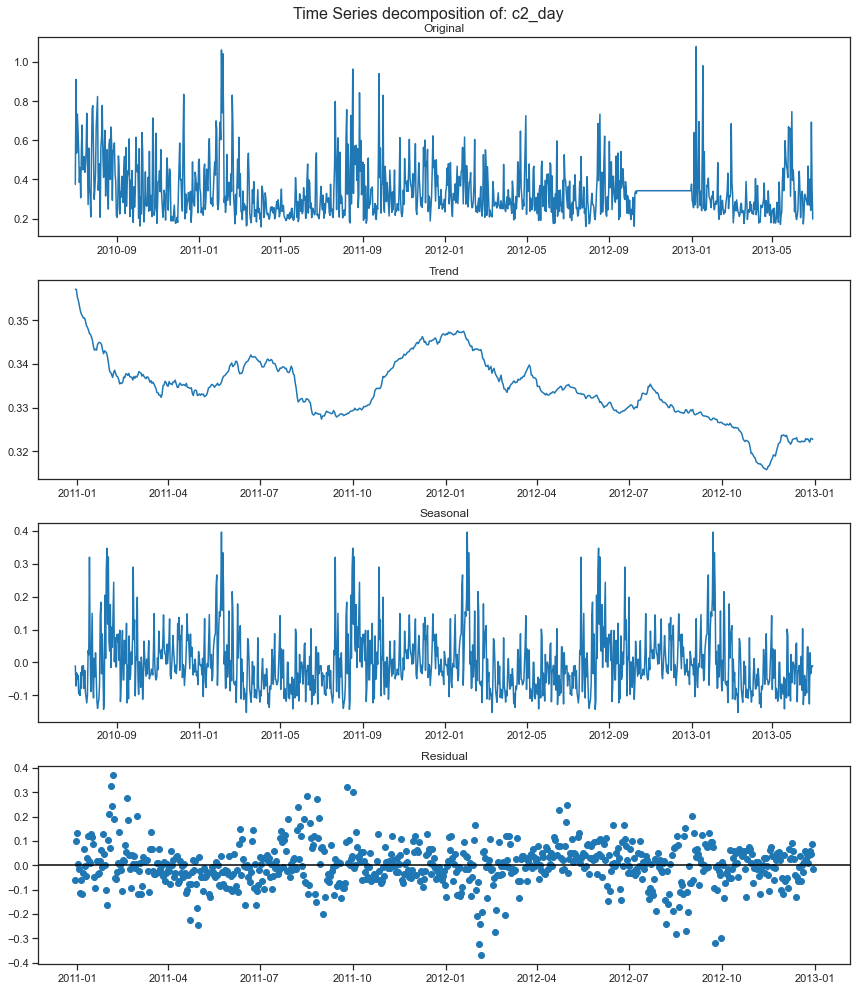

Results of ADFuller Test for c2_day:
Test Statistic           -6.412122e+00
p-value                   1.879577e-08
Lags                      9.000000e+00
Number of Observations    1.086000e+03
Critical Value (1%)      -3.436386e+00
Critical Value (5%)      -2.864205e+00
Critical Value (10%)     -2.568189e+00
dtype: float64
Reject H0 - Time Series is stationary


In [19]:
#hourly: 1
#daily: 24
#weekly: 168
window_size = 365
decompose_and_test_time_series('c2_day', c2_day, window_size)

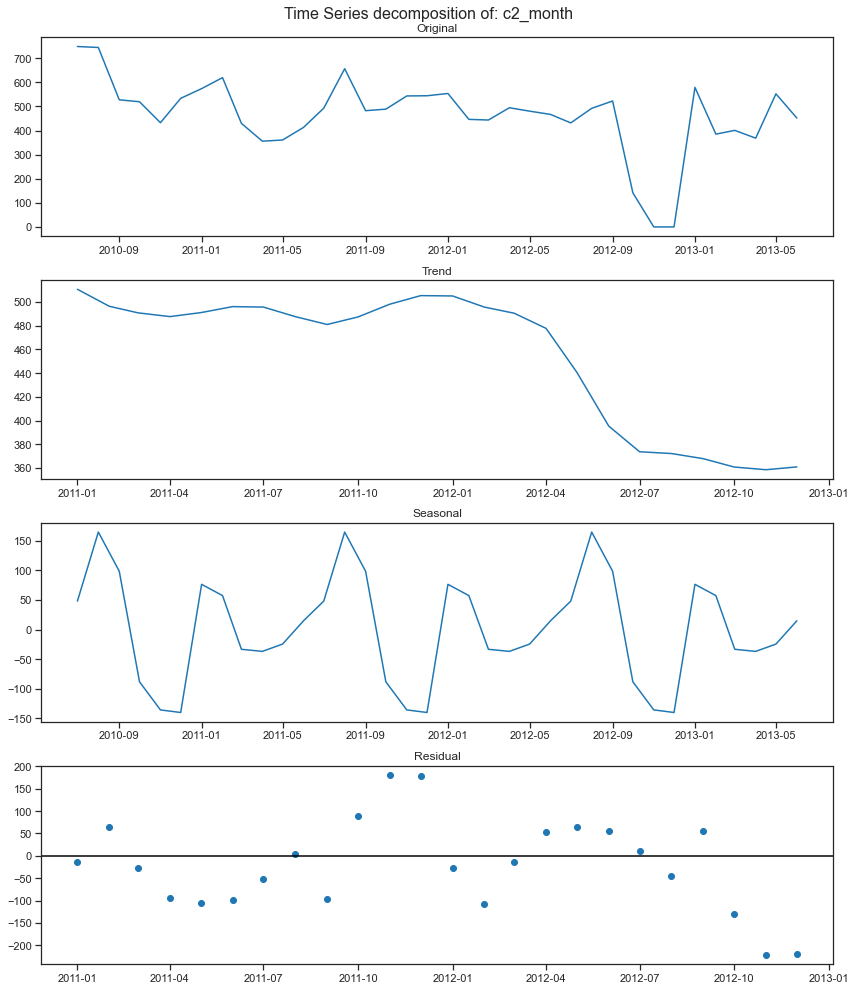

Results of ADFuller Test for c2_month:
Test Statistic            -3.518491
p-value                    0.007525
Lags                       0.000000
Number of Observations    35.000000
Critical Value (1%)       -3.632743
Critical Value (5%)       -2.948510
Critical Value (10%)      -2.613017
dtype: float64
Reject H0 - Time Series is stationary


In [20]:
#hourly: 1
#daily: 24
#weekly: 168
window_size = 12
decompose_and_test_time_series('c2_month', c2_month, window_size)

##### Exploring time series for Customer 3:

- Via the Dickey Fuller test, the time series is proven mathematically to be stationary, which means there is no trend or seasonality. 
- However, by looking at the graph for all 3 timeseries, an overall downward trend can be witnessed and no seasonality can be detected by eyeballing the graphs.

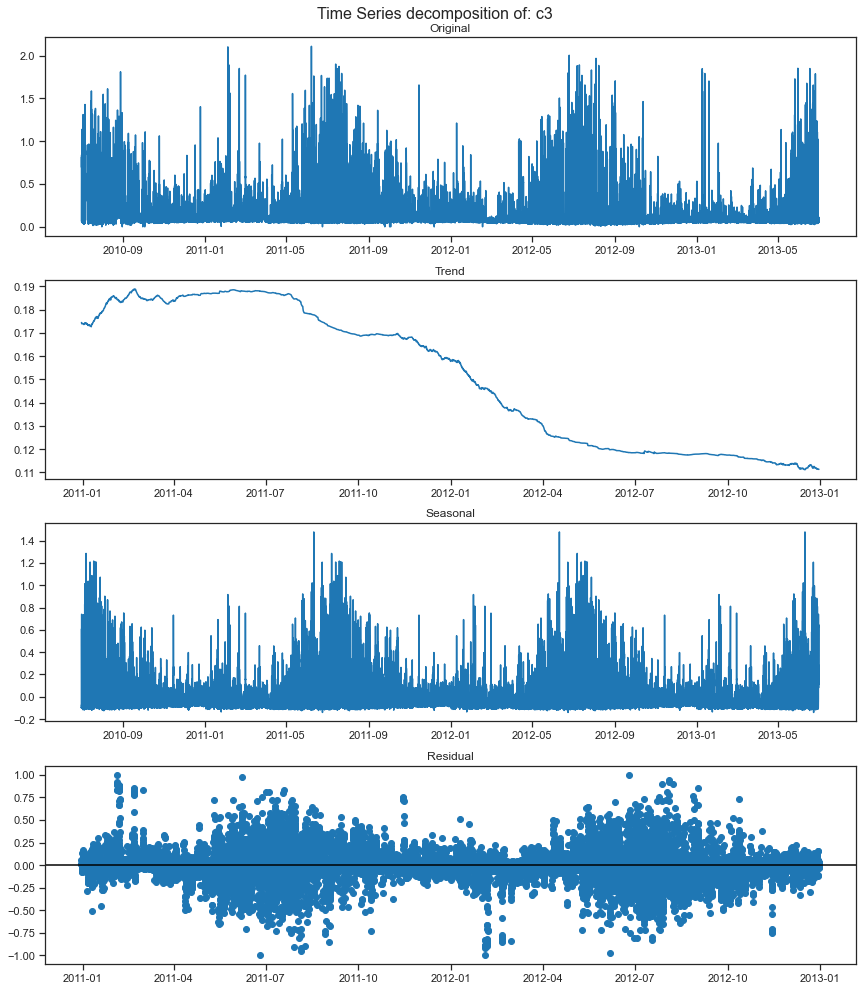

Results of ADFuller Test for c3:
Test Statistic           -1.707024e+01
p-value                   7.834640e-30
Lags                      5.200000e+01
Number of Observations    5.255500e+04
Critical Value (1%)      -3.430474e+00
Critical Value (5%)      -2.861595e+00
Critical Value (10%)     -2.566799e+00
dtype: float64
Reject H0 - Time Series is stationary


In [21]:
#hourly: 1
#daily: 24
#weekly: 168
window_size = 48*365
decompose_and_test_time_series('c3', c3, window_size)

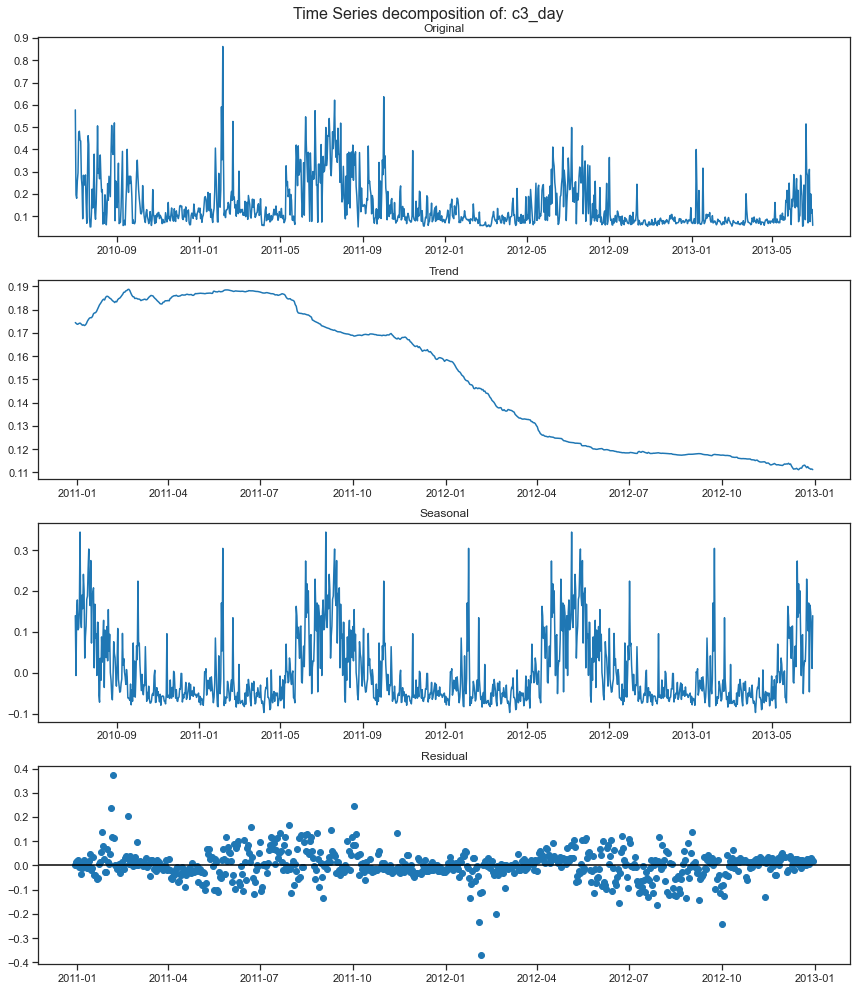

Results of ADFuller Test for c3_day:
Test Statistic              -3.049747
p-value                      0.030503
Lags                        20.000000
Number of Observations    1075.000000
Critical Value (1%)         -3.436448
Critical Value (5%)         -2.864232
Critical Value (10%)        -2.568204
dtype: float64
Reject H0 - Time Series is stationary


In [22]:
#hourly: 1
#daily: 24
#weekly: 168
window_size = 365
decompose_and_test_time_series('c3_day', c3_day, window_size)

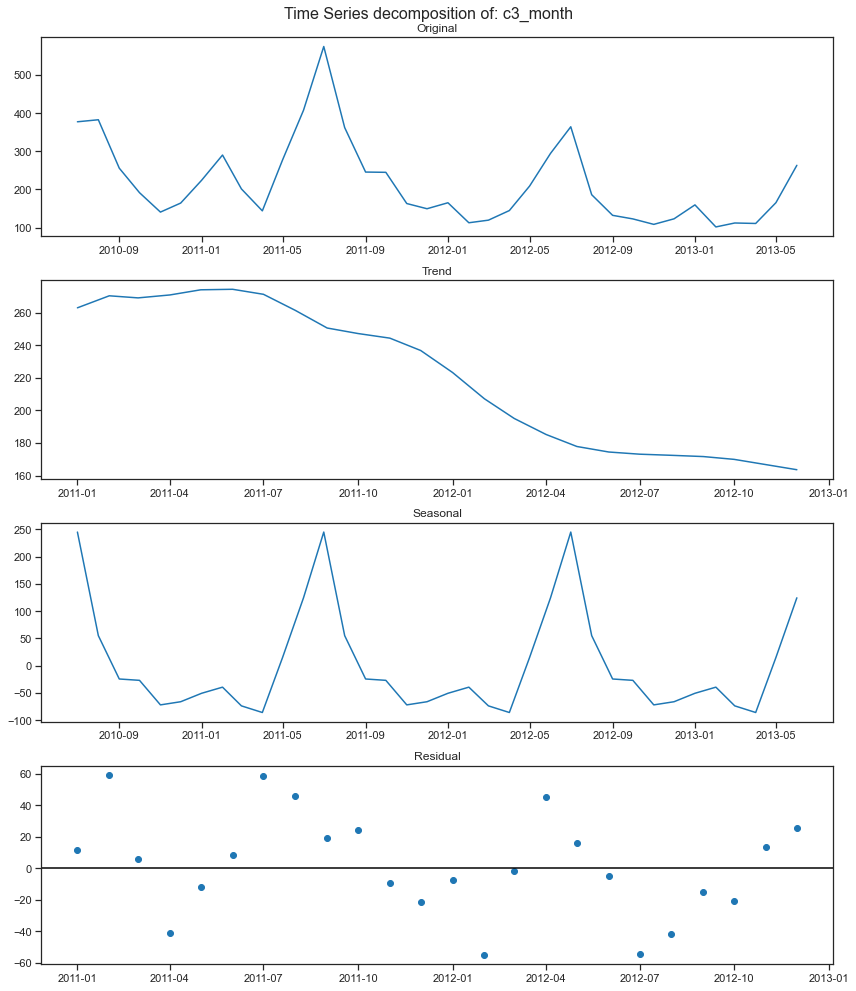

Results of ADFuller Test for c3_month:
Test Statistic            -3.770324
p-value                    0.003226
Lags                       1.000000
Number of Observations    34.000000
Critical Value (1%)       -3.639224
Critical Value (5%)       -2.951230
Critical Value (10%)      -2.614447
dtype: float64
Reject H0 - Time Series is stationary


In [23]:
#hourly: 1
#daily: 24
#weekly: 168
window_size = 12
decompose_and_test_time_series('c3_month', c3_month, window_size)

##### Exploring time series for Customer 4
- From the graphs, there is no detectable trend, though there might be a pattern of seasonality where the value tend to continuously increase and decrease with the peak observed that every summer each year (April - June). 
- By trying out different seasonal window sizes, it seems that yearly window sizes still best capture the seasonality component of these time series. 
- However, the Dickey Fuller test returns stationaries data

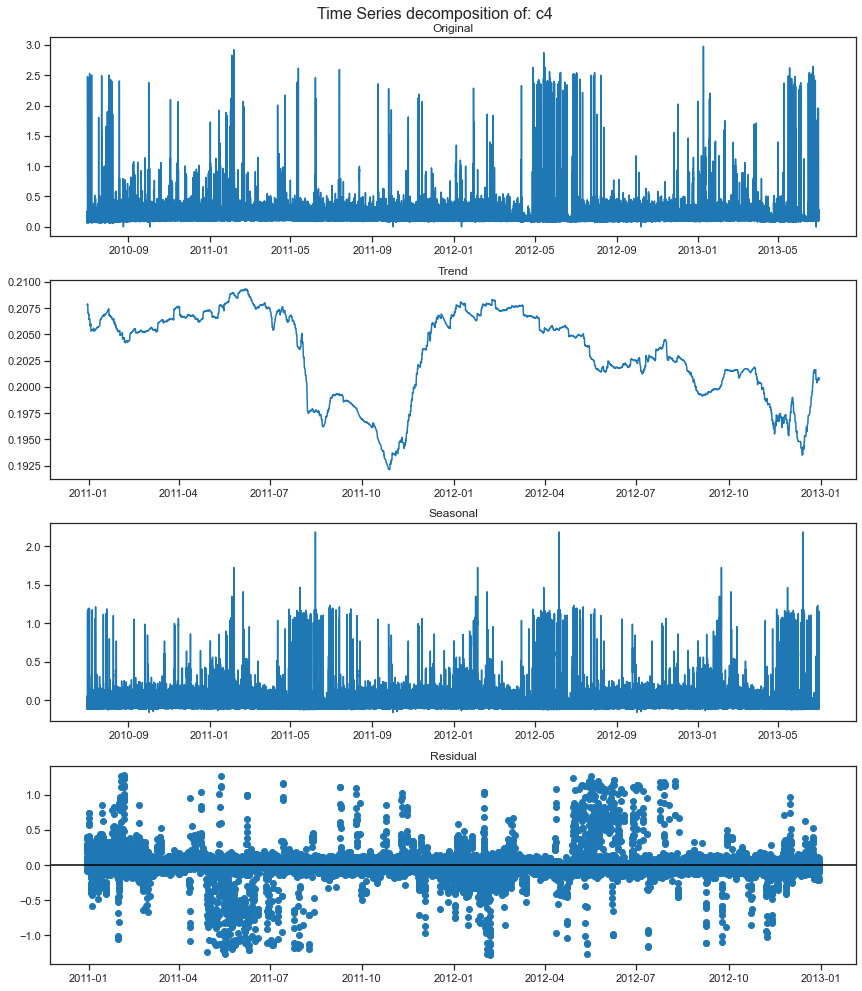

Results of ADFuller Test for c4:
Test Statistic              -20.038494
p-value                       0.000000
Lags                         56.000000
Number of Observations    52551.000000
Critical Value (1%)          -3.430474
Critical Value (5%)          -2.861595
Critical Value (10%)         -2.566799
dtype: float64
Reject H0 - Time Series is stationary


In [24]:
#hourly: 1
#daily: 24
#weekly: 168
window_size = 48*365
decompose_and_test_time_series('c4', c4, window_size)

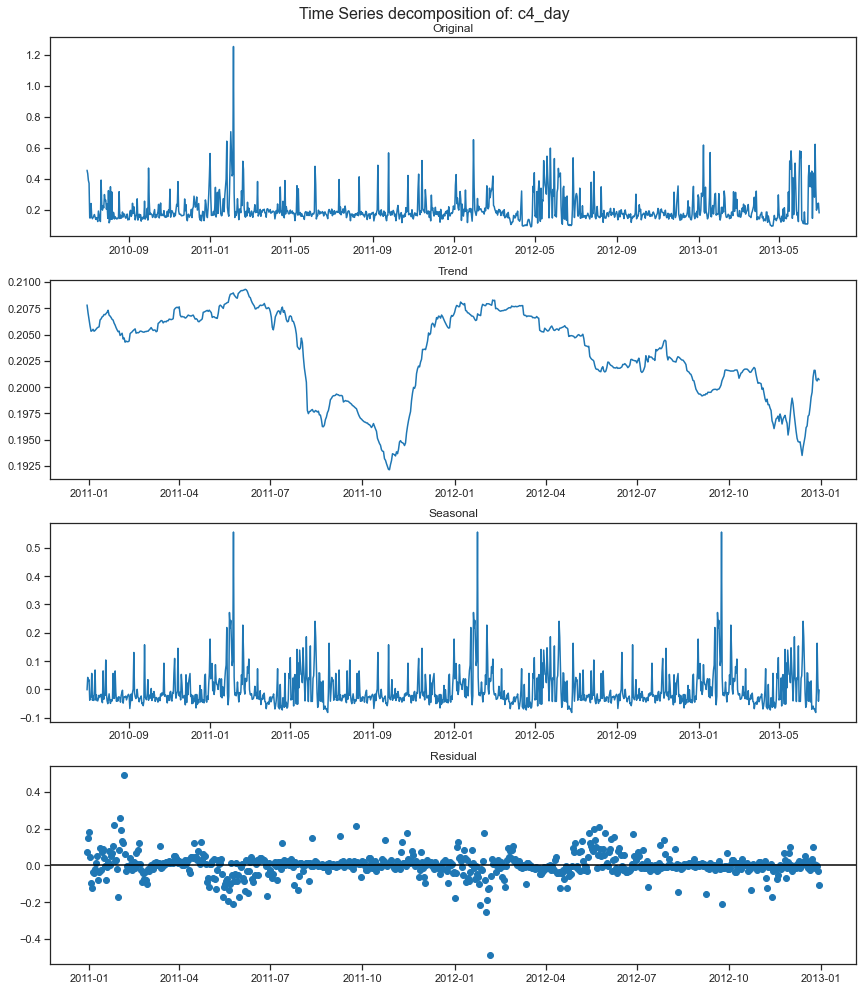

Results of ADFuller Test for c4_day:
Test Statistic              -5.600430
p-value                      0.000001
Lags                        13.000000
Number of Observations    1082.000000
Critical Value (1%)         -3.436408
Critical Value (5%)         -2.864215
Critical Value (10%)        -2.568194
dtype: float64
Reject H0 - Time Series is stationary


In [25]:
#hourly: 1
#daily: 24
#weekly: 168
window_size = 365
decompose_and_test_time_series('c4_day', c4_day, window_size)

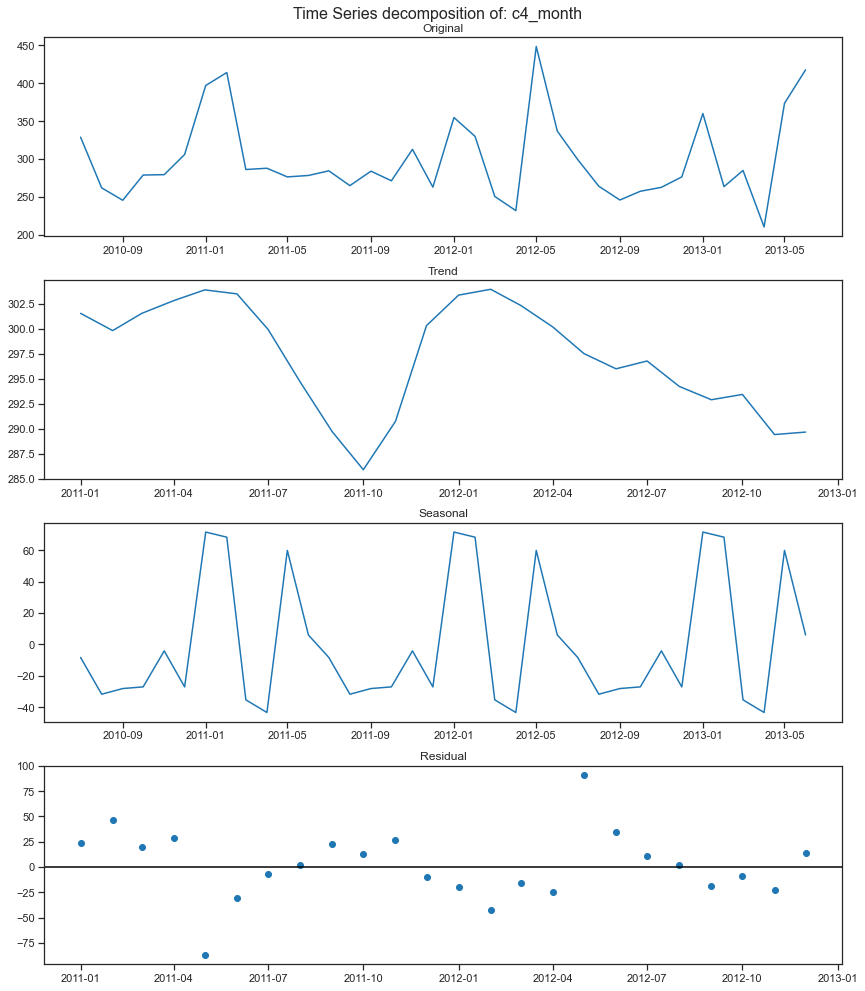

Results of ADFuller Test for c4_month:
Test Statistic            -4.189598
p-value                    0.000686
Lags                       1.000000
Number of Observations    34.000000
Critical Value (1%)       -3.639224
Critical Value (5%)       -2.951230
Critical Value (10%)      -2.614447
dtype: float64
Reject H0 - Time Series is stationary


In [26]:
#hourly: 1
#daily: 24
#weekly: 168
window_size = 12
decompose_and_test_time_series('c4_month', c4_month, window_size)

# Models Selection

- In this part, I will fit multiple fitting methods to **every** single time series. It will involve lots of FOR loop and uses of dictionaries to store data.

- Using the train and validation sets, I will then assess the performance of models base on the calculation of MAE. After each method, the MAE will be store in a dictionary.

- The model that returns the lowest MAE will be selected for later forecasting.

## A. NAIVE METHOD (Random-walk medthod)

FOr this method, the forecast are set to be the last observed value in the time series. Generally speaking, this model will not be able to capture well the future data since it is normal for all dataset to fluctuate over time instead of remaining the same. 

- I also develop a function that calculated the prediction based on the last observed value of the train sets with a forecast horizon equal to the length of the validation sets. 

- the probabilistic forecast is calculated as following equation: 

Lower Interval = forecast value - (Critical Value * Standard Deviation)
Upper Interval = forecast value + (Critical Value * Standard Deviation)

- Mean absolute error will also be used to validate the performance on the validation set for each keyword:

MAE = (1/n) * Σ|i - y_i|


The MAE represents the average absolute difference between the predicted values and the actual values. It is a commonly used metric to evaluate the performance of a forecasting or prediction model.


In [27]:
def naive(train_set, valid_set, frequency):
    h = len(valid_set)
    test = pd.period_range(start=valid_set.index[0], periods=h, freq=frequency)
    pred = pd.Series(np.repeat(train_set.iloc[-1], h), index=test)
    
    # Interval forecast
    #resid = valid_set - pred
    resid = train_set - train_set.shift(1)
    sigma = resid.std()
    crit = stats.norm.ppf(1-(1-0.95)/2)
    intv = pd.concat([pred - crit * sigma*np.sqrt(np.arange(1,h+1)),
                      pred + crit * sigma*np.sqrt(np.arange(1,h+1))], axis=1)
    intv.columns = ['Lower', 'Upper']

    
    return pred, intv

In [28]:
train_set_forecasts = {}

# Generate naive forecast for each train set
for name, train_set in train_sets.items():
    validation_set = validation_sets[name]
    frequency = train_set.index.freq
    forecast, interval = naive(train_set, validation_set, frequency)
    train_set_forecasts[name] = (forecast, interval)

    
# Access the forecasts for each time series
for name, (forecast, interval) in train_set_forecasts.items():
    print(f"Random Walk Forecast for {name}:")
    print(forecast)
    print(f"Forecasting Interval at 95% quantile:")
    print(interval.round(3))
    print()

Random Walk Forecast for c1:
2013-06-29 00:00    1.192
2013-06-29 00:30    1.192
2013-06-29 01:00    1.192
2013-06-29 01:30    1.192
2013-06-29 02:00    1.192
2013-06-29 02:30    1.192
2013-06-29 03:00    1.192
2013-06-29 03:30    1.192
2013-06-29 04:00    1.192
2013-06-29 04:30    1.192
2013-06-29 05:00    1.192
2013-06-29 05:30    1.192
2013-06-29 06:00    1.192
2013-06-29 06:30    1.192
2013-06-29 07:00    1.192
2013-06-29 07:30    1.192
2013-06-29 08:00    1.192
2013-06-29 08:30    1.192
2013-06-29 09:00    1.192
2013-06-29 09:30    1.192
2013-06-29 10:00    1.192
2013-06-29 10:30    1.192
2013-06-29 11:00    1.192
2013-06-29 11:30    1.192
2013-06-29 12:00    1.192
2013-06-29 12:30    1.192
2013-06-29 13:00    1.192
2013-06-29 13:30    1.192
2013-06-29 14:00    1.192
2013-06-29 14:30    1.192
2013-06-29 15:00    1.192
2013-06-29 15:30    1.192
2013-06-29 16:00    1.192
2013-06-29 16:30    1.192
2013-06-29 17:00    1.192
2013-06-29 17:30    1.192
2013-06-29 18:00    1.192
2013-06-2

                  Lower  Upper
2013-06-29 00:00 -0.217  0.309
2013-06-29 00:30 -0.325  0.417
2013-06-29 01:00 -0.409  0.501
2013-06-29 01:30 -0.479  0.571
2013-06-29 02:00 -0.541  0.633
2013-06-29 02:30 -0.597  0.689
2013-06-29 03:00 -0.649  0.741
2013-06-29 03:30 -0.697  0.789
2013-06-29 04:00 -0.742  0.834
2013-06-29 04:30 -0.785  0.877
2013-06-29 05:00 -0.825  0.917
2013-06-29 05:30 -0.864  0.956
2013-06-29 06:00 -0.901  0.993
2013-06-29 06:30 -0.937  1.029
2013-06-29 07:00 -0.971  1.063
2013-06-29 07:30 -1.005  1.097
2013-06-29 08:00 -1.037  1.129
2013-06-29 08:30 -1.068  1.160
2013-06-29 09:00 -1.099  1.191
2013-06-29 09:30 -1.129  1.221
2013-06-29 10:00 -1.158  1.250
2013-06-29 10:30 -1.186  1.278
2013-06-29 11:00 -1.214  1.306
2013-06-29 11:30 -1.241  1.333
2013-06-29 12:00 -1.267  1.359
2013-06-29 12:30 -1.293  1.385
2013-06-29 13:00 -1.319  1.411
2013-06-29 13:30 -1.344  1.436
2013-06-29 14:00 -1.369  1.461
2013-06-29 14:30 -1.393  1.485
2013-06-29 15:00 -1.417  1.509
2013-06-

In [29]:
mae_naive = {}

for keyword, (forecast, intvl,) in train_set_forecasts.items():
    validation_set = validation_sets[keyword]
    mae = np.abs(validation_set - forecast).mean()
    mae_naive[keyword] = {'MAE': round(mae, 3)}

print("MAE for Random Walk Method:")
for keyword, mae in mae_naive.items():
    mae_value = mae['MAE']
    print(f"{keyword}: MAE = {mae_value}")


MAE for Random Walk Method:
c1: MAE = 0.942
c1_day: MAE = 0.056
c1_month: MAE = 70.464
c2: MAE = 0.222
c2_day: MAE = 0.139
c2_month: MAE = 183.89
c3: MAE = 0.087
c3_day: MAE = 0.177
c3_month: MAE = 54.522
c4: MAE = 0.139
c4_day: MAE = 0.082
c4_month: MAE = 163.077


## B. EXPONENTIAL SMOOTHING 

<span style="color: red; font-size: 18px; font-weight: bold;">B.1.Simple exponential smoothing.</span>

Simple exponential smoothing model can be expressed as:

F(t+1) = α * Y(t) + (1 - α) * F(t)

- The forecasted value at time t+1 is a combination of the observed value at time t and the forecasted value at time t, weighted by the smoothing factor α.

- For Simple exponential smoothing model, I loop over the names in the train sets to train this model and represented them with graphs associated with the keyword to visualise the performance of this model. After that, i did point and probabilistic forecast, which was later used to calculate MAE, a metric to validate the performance of this model

In [30]:
import forecast
for name, train_set in train_sets.items():
    ses=forecast.ses(train_set)
    ses.fit()
    print(f"Simple exponential smoothing for {name}:")
    ses.summary()
    

Simple exponential smoothing for c1:
 Simple exponential smoothing

 Smoothing parameter:
 alpha  0.374 (0.006) 

 In-sample fit:
 MSE               0.080
 Log-likelihood   -8173.358
 AIC               16352.715
 BIC               16379.321
Simple exponential smoothing for c1_day:
 Simple exponential smoothing

 Smoothing parameter:
 alpha  0.231 (0.027) 

 In-sample fit:
 MSE               0.005
 Log-likelihood    1292.492
 AIC               -2578.984
 BIC               -2564.024
Simple exponential smoothing for c1_month:
 Simple exponential smoothing

 Smoothing parameter:
 alpha  0.922 (0.180) 

 In-sample fit:
 MSE               7319.185
 Log-likelihood   -199.514
 AIC               405.028
 BIC               409.608
Simple exponential smoothing for c2:
 Simple exponential smoothing

 Smoothing parameter:
 alpha  0.916 (0.005) 

 In-sample fit:
 MSE               0.057
 Log-likelihood    768.788
 AIC               -1531.576
 BIC               -1505.201
Simple exponential smoothing 

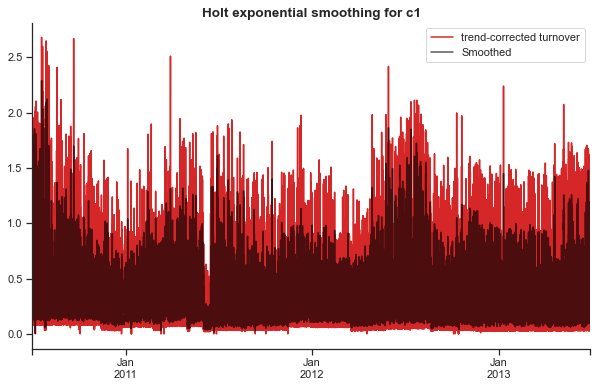

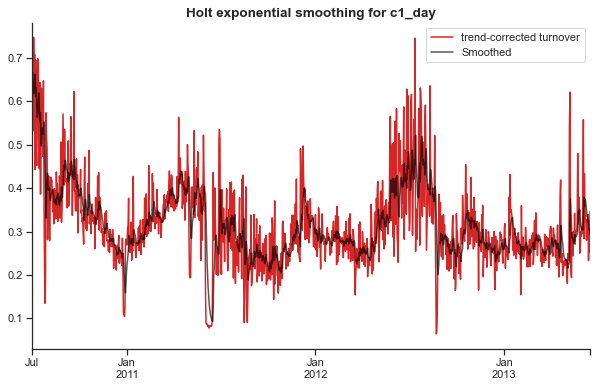

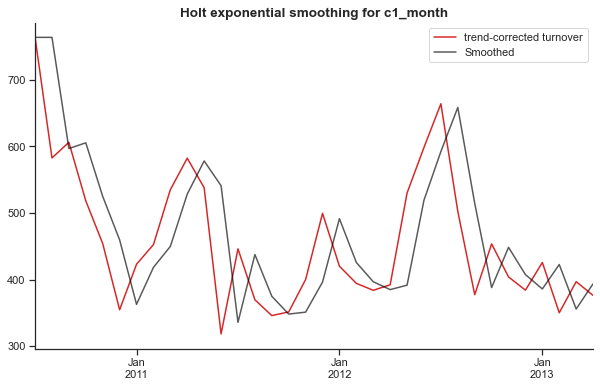

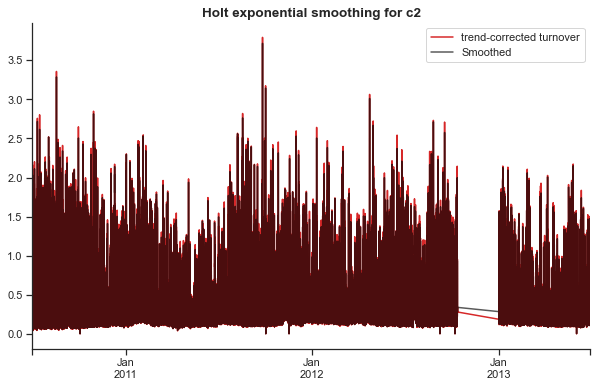

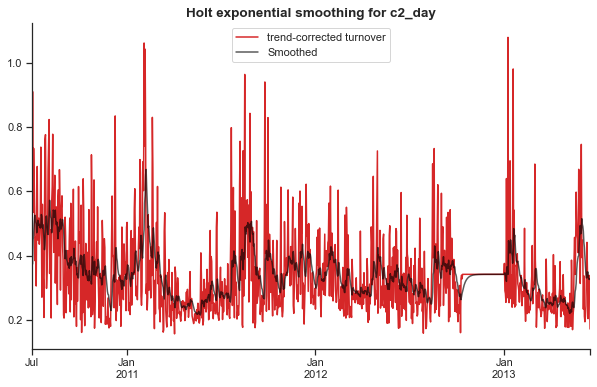

...

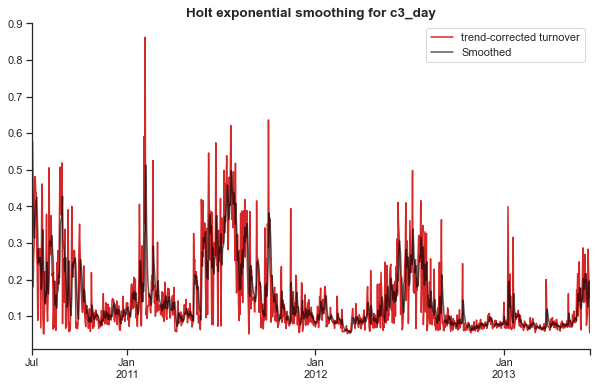

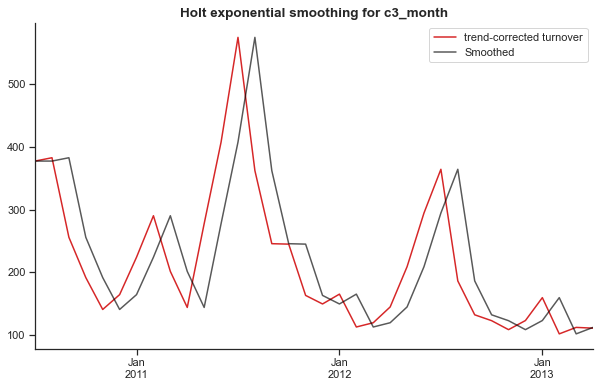

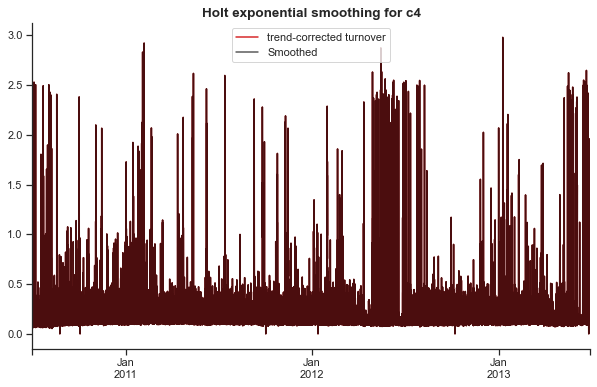

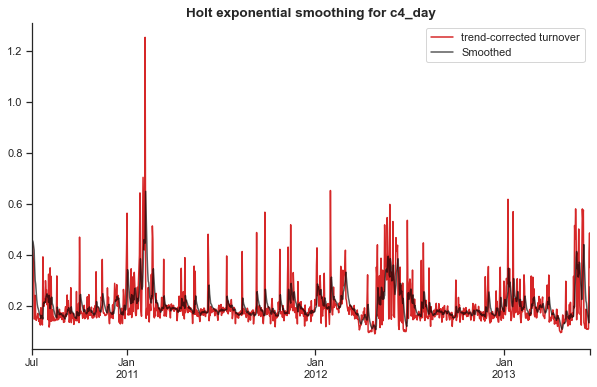

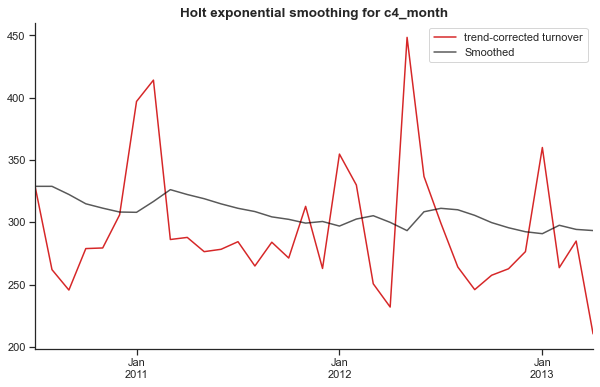

In [31]:
for name, train_set in train_sets.items():
    ses=forecast.ses(train_set)
    ses.fit()

    smoothed = pd.Series(ses.smooth(), index=train_set.index)  # Forecast value
    fig, ax = plt.subplots(figsize=(10, 6))

    train_set.plot(color='#D62728', label='trend-corrected turnover')
    smoothed.plot(color='black', label='Smoothed', alpha=0.65)
    plt.legend(loc='best')
    ax.set_xlabel('')
    ax.set_xticks([], minor=True)
    ax.set_title(f'Holt exponential smoothing for {name}', fontsize=13.5, fontweight='bold')

    sns.despine()
    plt.show()


<span style="color: green; font-size: 16px; font-weight: bold;"> Point forecast and Probabilistic forecast.</span>

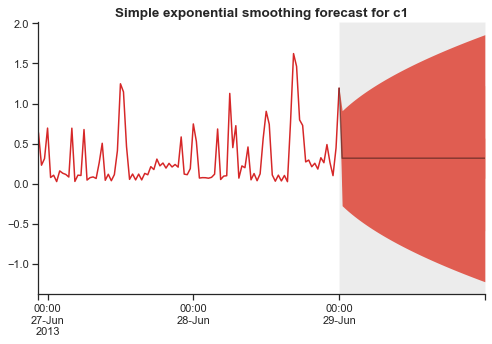

Simple Exponential smoothing for c1
2013-06-29 00:00    0.319184
2013-06-29 00:30    0.319184
2013-06-29 01:00    0.319184
2013-06-29 01:30    0.319184
2013-06-29 02:00    0.319184
2013-06-29 02:30    0.319184
2013-06-29 03:00    0.319184
2013-06-29 03:30    0.319184
2013-06-29 04:00    0.319184
2013-06-29 04:30    0.319184
2013-06-29 05:00    0.319184
2013-06-29 05:30    0.319184
2013-06-29 06:00    0.319184
2013-06-29 06:30    0.319184
2013-06-29 07:00    0.319184
2013-06-29 07:30    0.319184
2013-06-29 08:00    0.319184
2013-06-29 08:30    0.319184
2013-06-29 09:00    0.319184
2013-06-29 09:30    0.319184
2013-06-29 10:00    0.319184
2013-06-29 10:30    0.319184
2013-06-29 11:00    0.319184
2013-06-29 11:30    0.319184
2013-06-29 12:00    0.319184
2013-06-29 12:30    0.319184
2013-06-29 13:00    0.319184
2013-06-29 13:30    0.319184
2013-06-29 14:00    0.319184
2013-06-29 14:30    0.319184
2013-06-29 15:00    0.319184
2013-06-29 15:30    0.319184
2013-06-29 16:00    0.319184
2013-06

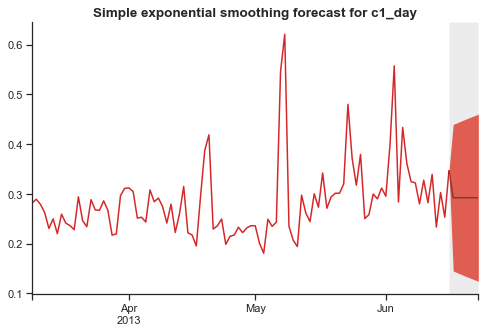

Simple Exponential smoothing for c1_day
2013-06-17    0.292233
2013-06-18    0.292233
2013-06-19    0.292233
2013-06-20    0.292233
2013-06-21    0.292233
2013-06-22    0.292233
2013-06-23    0.292233
Freq: D, dtype: float64
SES probabilistic forecast at the 95% quantile for c1_day
                   0         1
2013-06-17  0.144838  0.439627
2013-06-18  0.141162  0.443304
2013-06-19  0.137573  0.446892
2013-06-20  0.134066  0.450400
2013-06-21  0.130634  0.453831
2013-06-22  0.127274  0.457191
2013-06-23  0.123982  0.460484


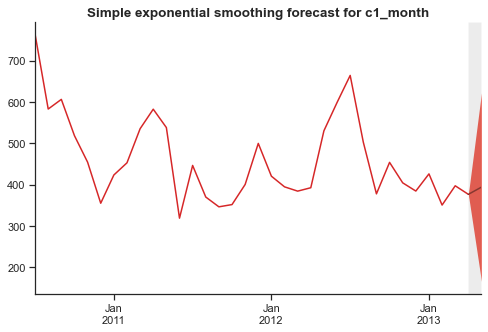

Simple Exponential smoothing for c1_month
2013-05    393.840462
Freq: M, dtype: float64
SES probabilistic forecast at the 95% quantile for c1_month
                  0           1
2013-05  165.737295  621.943628


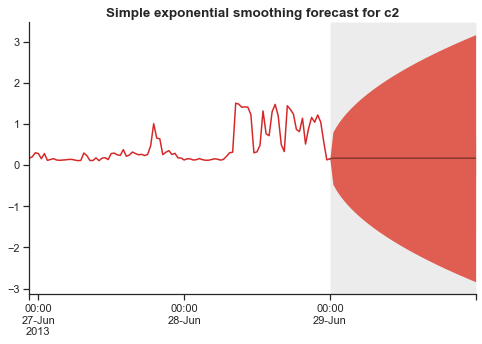

Simple Exponential smoothing for c2
2013-06-29 00:00    0.166816
2013-06-29 00:30    0.166816
2013-06-29 01:00    0.166816
2013-06-29 01:30    0.166816
2013-06-29 02:00    0.166816
2013-06-29 02:30    0.166816
2013-06-29 03:00    0.166816
2013-06-29 03:30    0.166816
2013-06-29 04:00    0.166816
2013-06-29 04:30    0.166816
2013-06-29 05:00    0.166816
2013-06-29 05:30    0.166816
2013-06-29 06:00    0.166816
2013-06-29 06:30    0.166816
2013-06-29 07:00    0.166816
2013-06-29 07:30    0.166816
2013-06-29 08:00    0.166816
2013-06-29 08:30    0.166816
2013-06-29 09:00    0.166816
2013-06-29 09:30    0.166816
2013-06-29 10:00    0.166816
2013-06-29 10:30    0.166816
2013-06-29 11:00    0.166816
2013-06-29 11:30    0.166816
2013-06-29 12:00    0.166816
2013-06-29 12:30    0.166816
2013-06-29 13:00    0.166816
2013-06-29 13:30    0.166816
2013-06-29 14:00    0.166816
2013-06-29 14:30    0.166816
2013-06-29 15:00    0.166816
2013-06-29 15:30    0.166816
2013-06-29 16:00    0.166816
2013-06

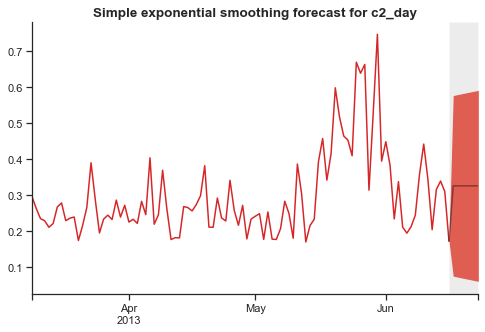

Simple Exponential smoothing for c2_day
2013-06-17    0.325821
2013-06-18    0.325821
2013-06-19    0.325821
2013-06-20    0.325821
2013-06-21    0.325821
2013-06-22    0.325821
2013-06-23    0.325821
Freq: D, dtype: float64
SES probabilistic forecast at the 95% quantile for c2_day
                   0         1
2013-06-17  0.075342  0.576300
2013-06-18  0.072883  0.578759
2013-06-19  0.070447  0.581195
2013-06-20  0.068035  0.583607
2013-06-21  0.065644  0.585997
2013-06-22  0.063276  0.588366
2013-06-23  0.060929  0.590713


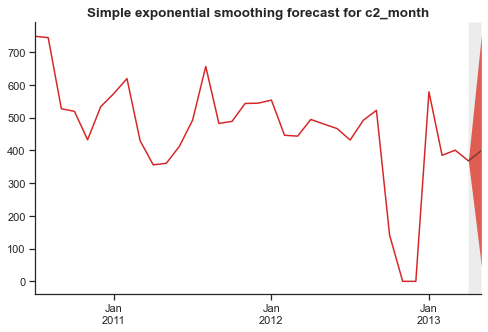

Simple Exponential smoothing for c2_month
2013-05    399.666162
Freq: M, dtype: float64
SES probabilistic forecast at the 95% quantile for c2_month
                 0           1
2013-05  44.707802  754.624522


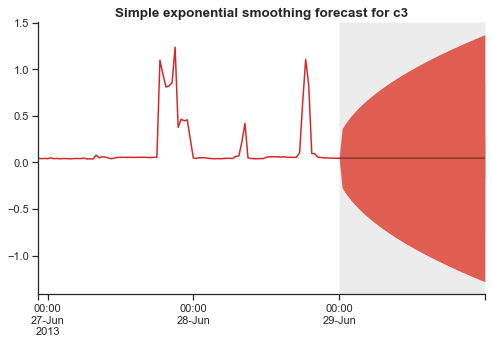

Simple Exponential smoothing for c3
2013-06-29 00:00    0.046129
2013-06-29 00:30    0.046129
2013-06-29 01:00    0.046129
2013-06-29 01:30    0.046129
2013-06-29 02:00    0.046129
2013-06-29 02:30    0.046129
2013-06-29 03:00    0.046129
2013-06-29 03:30    0.046129
2013-06-29 04:00    0.046129
2013-06-29 04:30    0.046129
2013-06-29 05:00    0.046129
2013-06-29 05:30    0.046129
2013-06-29 06:00    0.046129
2013-06-29 06:30    0.046129
2013-06-29 07:00    0.046129
2013-06-29 07:30    0.046129
2013-06-29 08:00    0.046129
2013-06-29 08:30    0.046129
2013-06-29 09:00    0.046129
2013-06-29 09:30    0.046129
2013-06-29 10:00    0.046129
2013-06-29 10:30    0.046129
2013-06-29 11:00    0.046129
2013-06-29 11:30    0.046129
2013-06-29 12:00    0.046129
2013-06-29 12:30    0.046129
2013-06-29 13:00    0.046129
2013-06-29 13:30    0.046129
2013-06-29 14:00    0.046129
2013-06-29 14:30    0.046129
2013-06-29 15:00    0.046129
2013-06-29 15:30    0.046129
2013-06-29 16:00    0.046129
2013-06

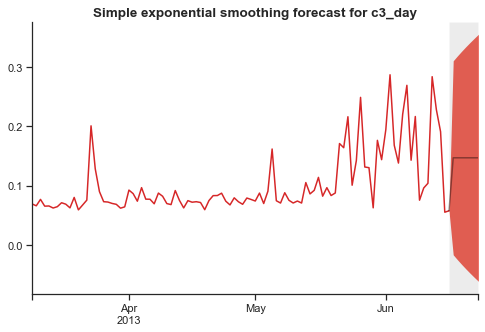

Simple Exponential smoothing for c3_day
2013-06-17    0.146953
2013-06-18    0.146953
2013-06-19    0.146953
2013-06-20    0.146953
2013-06-21    0.146953
2013-06-22    0.146953
2013-06-23    0.146953
Freq: D, dtype: float64
SES probabilistic forecast at the 95% quantile for c3_day
                   0         1
2013-06-17 -0.016679  0.310586
2013-06-18 -0.024954  0.318860
2013-06-19 -0.032848  0.326755
2013-06-20 -0.040410  0.334317
2013-06-21 -0.047678  0.341585
2013-06-22 -0.054685  0.348591
2013-06-23 -0.061456  0.355362


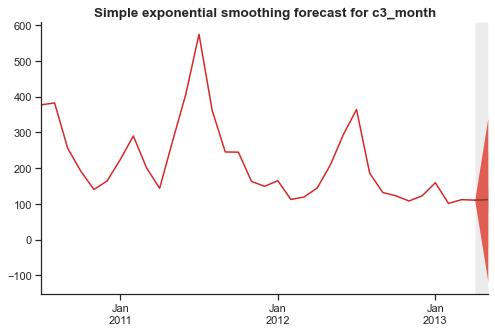

Simple Exponential smoothing for c3_month
2013-05    111.94
Freq: M, dtype: float64
SES probabilistic forecast at the 95% quantile for c3_month
                  0           1
2013-05 -116.548739  340.428739


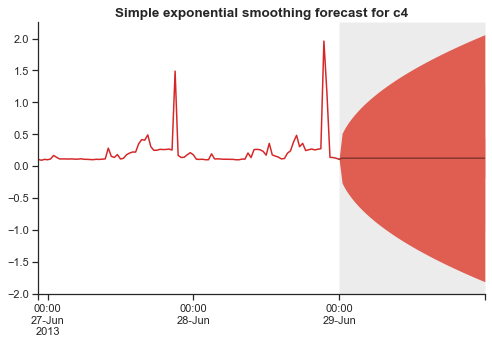

Simple Exponential smoothing for c4
2013-06-29 00:00    0.124
2013-06-29 00:30    0.124
2013-06-29 01:00    0.124
2013-06-29 01:30    0.124
2013-06-29 02:00    0.124
2013-06-29 02:30    0.124
2013-06-29 03:00    0.124
2013-06-29 03:30    0.124
2013-06-29 04:00    0.124
2013-06-29 04:30    0.124
2013-06-29 05:00    0.124
2013-06-29 05:30    0.124
2013-06-29 06:00    0.124
2013-06-29 06:30    0.124
2013-06-29 07:00    0.124
2013-06-29 07:30    0.124
2013-06-29 08:00    0.124
2013-06-29 08:30    0.124
2013-06-29 09:00    0.124
2013-06-29 09:30    0.124
2013-06-29 10:00    0.124
2013-06-29 10:30    0.124
2013-06-29 11:00    0.124
2013-06-29 11:30    0.124
2013-06-29 12:00    0.124
2013-06-29 12:30    0.124
2013-06-29 13:00    0.124
2013-06-29 13:30    0.124
2013-06-29 14:00    0.124
2013-06-29 14:30    0.124
2013-06-29 15:00    0.124
2013-06-29 15:30    0.124
2013-06-29 16:00    0.124
2013-06-29 16:30    0.124
2013-06-29 17:00    0.124
2013-06-29 17:30    0.124
2013-06-29 18:00    0.124
20

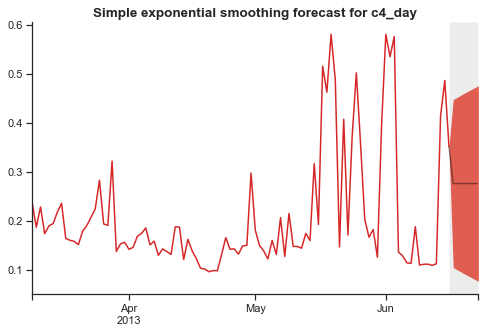

Simple Exponential smoothing for c4_day
2013-06-17    0.275787
2013-06-18    0.275787
2013-06-19    0.275787
2013-06-20    0.275787
2013-06-21    0.275787
2013-06-22    0.275787
2013-06-23    0.275787
Freq: D, dtype: float64
SES probabilistic forecast at the 95% quantile for c4_day
                   0         1
2013-06-17  0.104482  0.447092
2013-06-18  0.099437  0.452137
2013-06-19  0.094533  0.457041
2013-06-20  0.089758  0.461816
2013-06-21  0.085102  0.466472
2013-06-22  0.080558  0.471016
2013-06-23  0.076116  0.475457


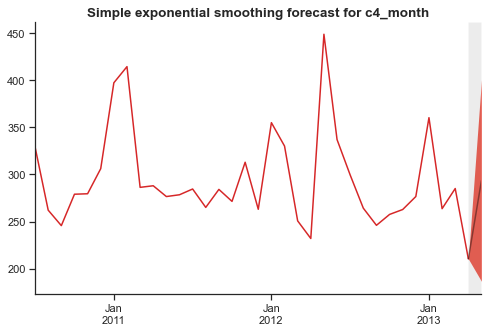

Simple Exponential smoothing for c4_month
2013-05    293.39218
Freq: M, dtype: float64
SES probabilistic forecast at the 95% quantile for c4_month
                  0           1
2013-05  186.570062  400.214297


In [32]:
ses_preds = {} # for later purposes I will store predictions data in a dictionary
for name, train_set in train_sets.items():
    ses=forecast.ses(train_set)
    ses.fit()

    validation_set = validation_sets[name]
    frequency = train_set.index.freq
    
    h = len(validation_set)
    test = pd.period_range(start=validation_set.index[0], periods=h, freq=frequency)
    pred = pd.Series(ses.forecast(len(validation_set)), index=test)
    intv1 = pd.DataFrame(ses.intervalforecast(h, level=.25), index=test)
    intv2 = pd.DataFrame(ses.intervalforecast(h, level=.75), index=test) 
    intv_ses = pd.DataFrame(ses.intervalforecast(h, level=.95), index=test) 

    
    fig, ax = forecast.fanchart(train_set[-100:], pred, intv_ses,intv1,intv2)
    ax.set_xlabel('')
    ax.set_xticks([], minor=True)
    plt.title(f'Simple exponential smoothing forecast for {name}', fontsize=13.5, fontweight='bold')
    
    ses_preds[name] = pred

    sns.despine()
    plt.show()
    print(f'Simple Exponential smoothing for {name}')
    print(pred)
    print(f'SES probabilistic forecast at the 95% quantile for {name}')
    print(intv_ses)

<span style="color: green; font-size: 16px; font-weight: bold;"> MAE calculation.</span> 

In [33]:
mae_ses = {}

for name, pred in ses_preds.items():
    validation_set = validation_sets[name]
    mae = (np.abs(validation_set - pred).mean())
    mae_ses[name] = {'MAE': mae}  # Update the structure of mae_ses

print("MAE for Simple Exponential Smoothing:")
for name, values in mae_ses.items():
    mae = values['MAE']
    print(f"Time series {name} has MAE = {mae}")


MAE for Simple Exponential Smoothing:
Time series c1 has MAE = 0.2032641700394486
Time series c1_day has MAE = 0.07119991986237115
Time series c1_month has MAE = 53.011538141325445
Time series c2 has MAE = 0.21622784781648494
Time series c2_day has MAE = 0.05487208588425924
Time series c2_month has MAE = 152.4838378358951
Time series c3 has MAE = 0.08680022063648017
Time series c3_day has MAE = 0.12740398386860452
Time series c3_month has MAE = 53.27799999999999
Time series c4 has MAE = 0.13381249999999997
Time series c4_day has MAE = 0.11612539969539082
Time series c4_month has MAE = 80.13082031603722


<span style="color: red; font-size: 18px; font-weight: bold;">B.2.Holt-winter trend corrected.</span>

The Holt-Winters equation can be expressed as below:

Level:
L(t) = α * (Y(t) - S(t-m)) + (1 - α) * (L(t-1) + T(t-1))

Trend:
T(t) = β * (L(t) - L(t-1)) + (1 - β) * T(t-1)

Seasonal:
S(t) = γ * (Y(t) - L(t)) + (1 - γ) * S(t-m)

Forecast:
F(t+h) = L(t) + h * T(t) + S(t-m+h)


While the level equation updates the level component based on the observed value, the previous level, and the previous trend, the trend equation updates the trend component based on the current level, the previous level, and the previous trend. The seasonal equation updates the seasonal component based on the observed value and the current level. 
Finally, the forecast equation combines the level, trend, and seasonal components to generate the forecasted value.

The values of α, β, and γ determine the smoothing of the components and can handle the curves and fluctuation of the dataset better. 

In the following holt-winters models, I first fit the models, according to the model that i used, with a graph that can visualise how well the model fits the dataset. After that, i did point and probabilistic forecast on thev validation set and finally calculated MAE to evaluate the performance of the model 

In [34]:
for name, train_set in train_sets.items():
    model_trend = forecast.holt(train_set)
    model_trend.fit()
    print(f'Holt exponential smoothing model fitting for {name}')
    model_trend.summary()

Holt exponential smoothing model fitting for c1
 Holt (trend corrected) exponential smoothing

 Smoothing parameters: 
 alpha (level) 0.374 (0.010)
 beta (trend)  0.000 (0.013)
 
 In-sample fit:
 MSE               0.080
 Log-likelihood   -8173.358
 AIC               16352.715
 BIC               16379.321
Holt exponential smoothing model fitting for c1_day
 Holt (trend corrected) exponential smoothing

 Smoothing parameters: 
 alpha (level) 0.231 (0.029)
 beta (trend)  0.000 (0.029)
 
 In-sample fit:
 MSE               0.005
 Log-likelihood    1292.492
 AIC               -2578.984
 BIC               -2564.024
Holt exponential smoothing model fitting for c1_month
 Holt (trend corrected) exponential smoothing

 Smoothing parameters: 
 alpha (level) 0.922 (0.221)
 beta (trend)  0.000 (0.169)
 
 In-sample fit:
 MSE               7319.185
 Log-likelihood   -199.514
 AIC               405.028
 BIC               409.608
Holt exponential smoothing model fitting for c2
 Holt (trend corrected) ex

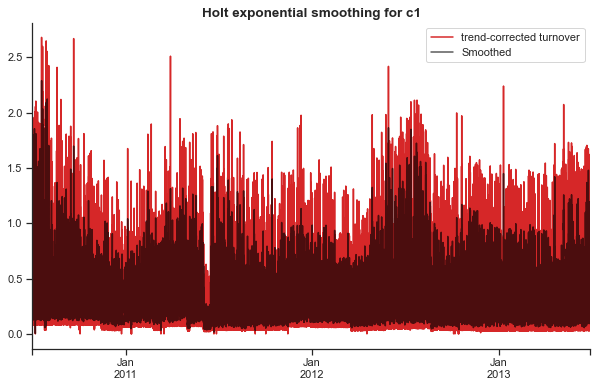

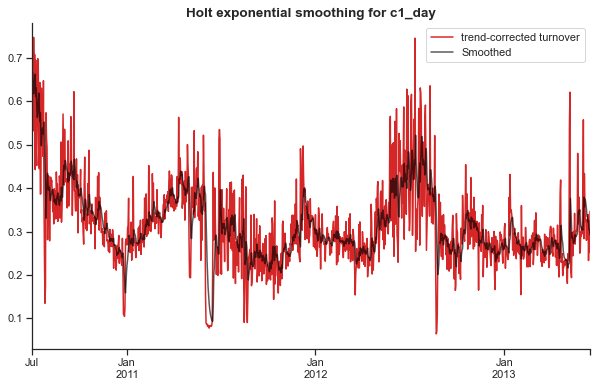

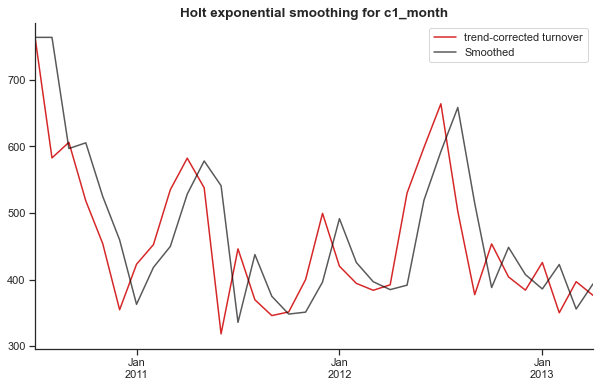

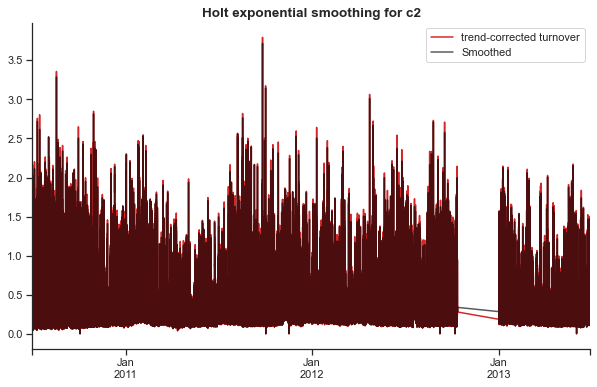

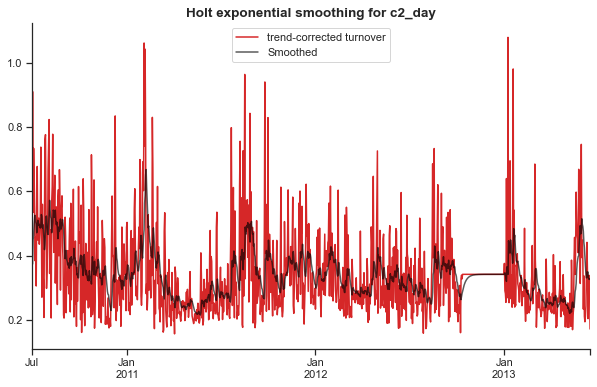

...

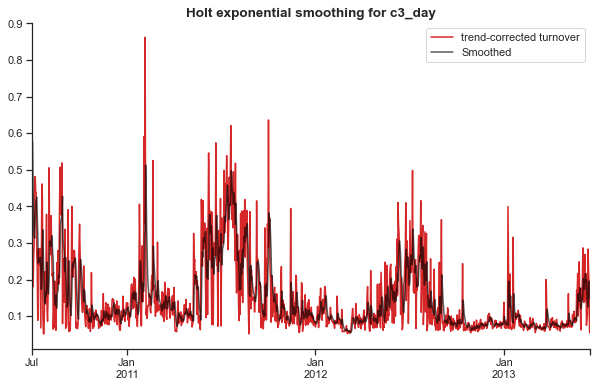

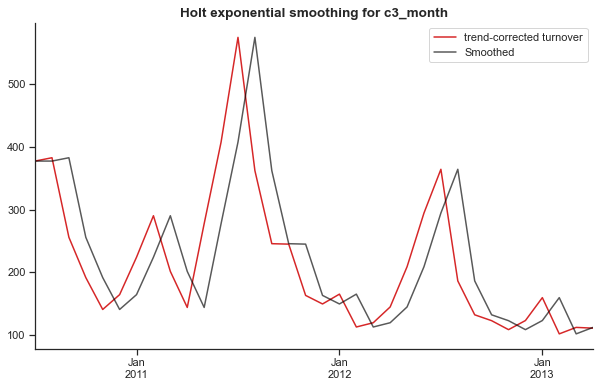

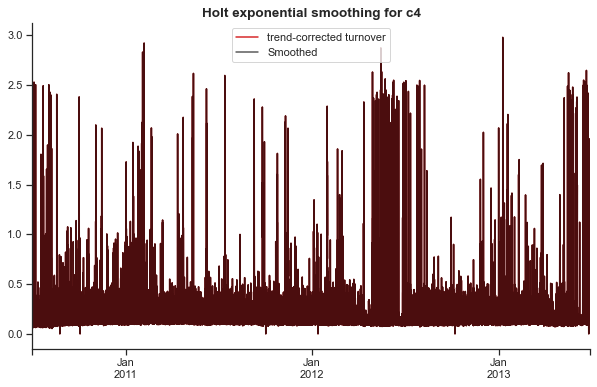

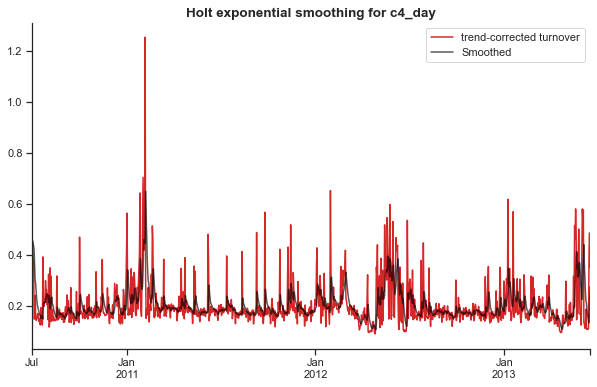

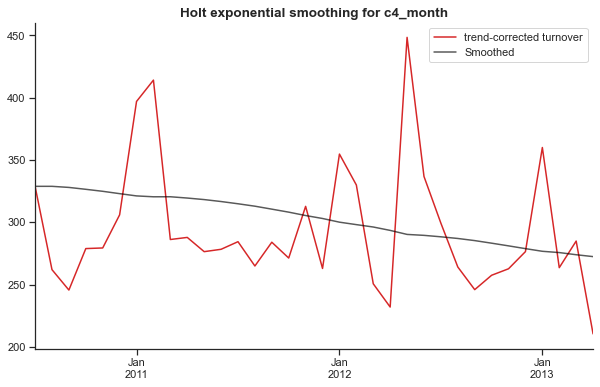

In [35]:
for name, train_set in train_sets.items():
    model_trend = forecast.holt(train_set)  #fit the model
    model_trend.fit()

    smoothed = pd.Series(model_trend.smooth(), index=train_set.index)  # Forecast value

    fig, ax = plt.subplots(figsize=(10, 6))

    train_set.plot(color='#D62728', label='trend-corrected turnover')
    smoothed.plot(color='black', label='Smoothed', alpha=0.65)
    plt.legend(loc='best')
    ax.set_xlabel('')
    ax.set_xticks([], minor=True)
    ax.set_title(f'Holt exponential smoothing for {name}', fontsize=13.5, fontweight='bold')

    sns.despine()
    plt.show()

<span style="color: green; font-size: 16px; font-weight: bold;">Point and interval forecast for trend corrected Holt-winter.</span>  

Trend corrected Holt Exponential smoothing for c1:
2013-06-29 00:00    0.319184
2013-06-29 00:30    0.319184
2013-06-29 01:00    0.319184
2013-06-29 01:30    0.319184
2013-06-29 02:00    0.319184
2013-06-29 02:30    0.319184
2013-06-29 03:00    0.319184
2013-06-29 03:30    0.319184
2013-06-29 04:00    0.319184
2013-06-29 04:30    0.319184
2013-06-29 05:00    0.319184
2013-06-29 05:30    0.319184
2013-06-29 06:00    0.319184
2013-06-29 06:30    0.319184
2013-06-29 07:00    0.319184
2013-06-29 07:30    0.319184
2013-06-29 08:00    0.319184
2013-06-29 08:30    0.319184
2013-06-29 09:00    0.319184
2013-06-29 09:30    0.319184
2013-06-29 10:00    0.319184
2013-06-29 10:30    0.319184
2013-06-29 11:00    0.319184
2013-06-29 11:30    0.319184
2013-06-29 12:00    0.319184
2013-06-29 12:30    0.319184
2013-06-29 13:00    0.319184
2013-06-29 13:30    0.319184
2013-06-29 14:00    0.319184
2013-06-29 14:30    0.319184
2013-06-29 15:00    0.319184
2013-06-29 15:30    0.319184
2013-06-29 16:00    0

Trend corrected Holt Exponential smoothing for c3_day:
2013-06-17    0.146954
2013-06-18    0.146954
2013-06-19    0.146954
2013-06-20    0.146954
2013-06-21    0.146954
2013-06-22    0.146954
2013-06-23    0.146954
Freq: D, dtype: float64
Probabilistic forecast for c3_day at 95% quantile:
                   0         1
2013-06-17 -0.007962  0.301871
2013-06-18 -0.016677  0.310586
2013-06-19 -0.024951  0.318860
2013-06-20 -0.032845  0.326754
2013-06-21 -0.040407  0.334316
2013-06-22 -0.047675  0.341583
2013-06-23 -0.054681  0.348590
Trend corrected Holt Exponential smoothing for c3_month:
2013-05    111.94
Freq: M, dtype: float64
Probabilistic forecast for c3_month at 95% quantile:
                 0           1
2013-05 -49.625937  273.505937
Trend corrected Holt Exponential smoothing for c4:
2013-06-29 00:00    0.124
2013-06-29 00:30    0.124
2013-06-29 01:00    0.124
2013-06-29 01:30    0.124
2013-06-29 02:00    0.124
2013-06-29 02:30    0.124
2013-06-29 03:00    0.124
2013-06-29 03:

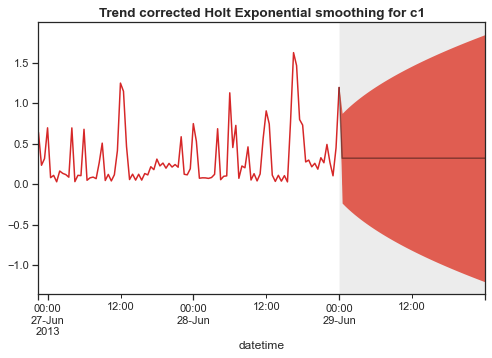

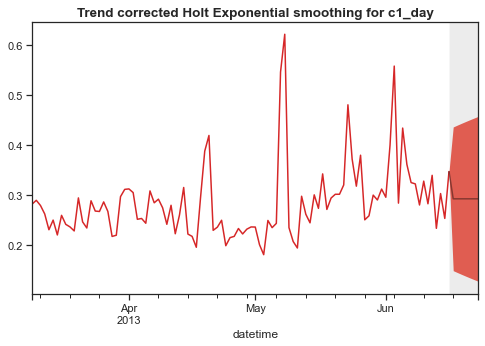

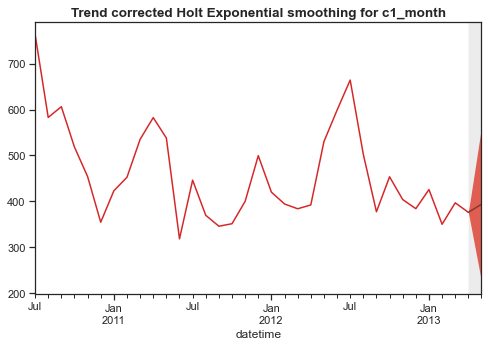

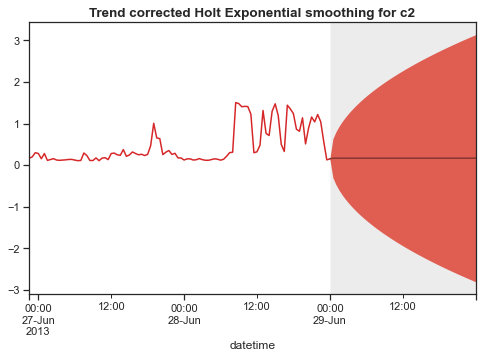

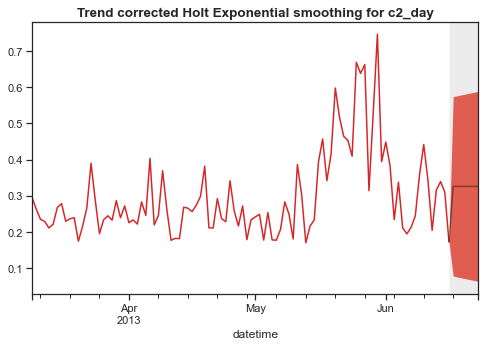

...

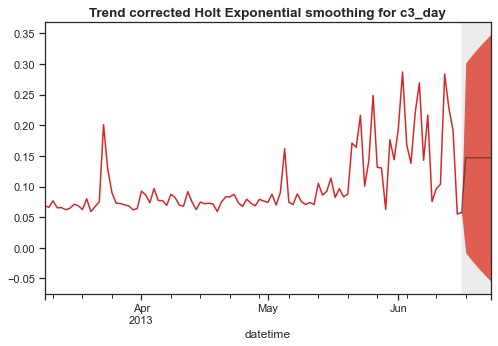

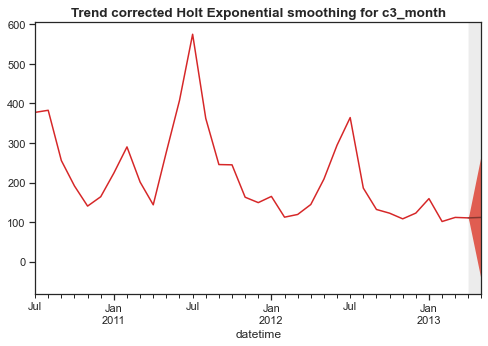

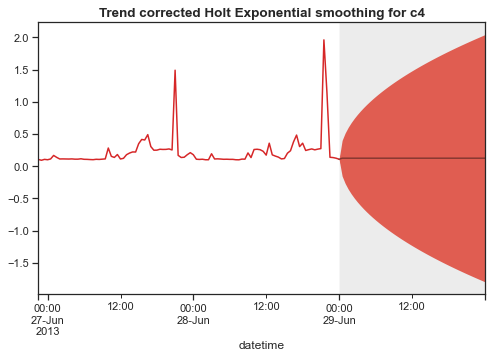

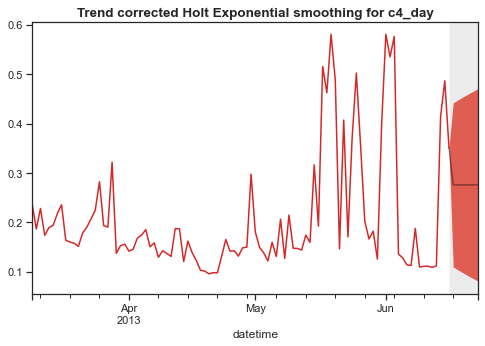

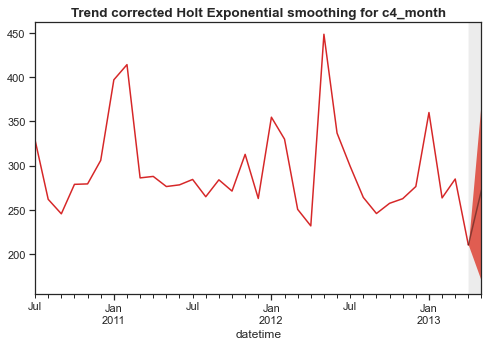

In [36]:
hwtc_preds = {}
for keyword, train_set in train_sets.items():
    model_trend = forecast.holt(train_set)  # Instantiate the Holt model
    model_trend.fit()

    validation_set = validation_sets[keyword]
    frequency = train_set.index.freq
    h = len(validation_set)
    
    test = pd.period_range(start=validation_set.index[0], periods=h, freq=frequency)
    pred = pd.Series(model_trend.forecast(h), index=test)
    
    intv_hw = pd.DataFrame(model_trend.intervalforecast(h, level=0.95), index=test)
    intv1 = pd.DataFrame(model_trend.intervalforecast(h, level=0.75), index=test)
    intv2 = pd.DataFrame(model_trend.intervalforecast(h, level=0.25), index=test)

    fig, ax = forecast.fanchart(train_set[-100:], pred, intv_hw, intv1, intv2)

    plt.title(f'Trend corrected Holt Exponential smoothing for {keyword}', fontsize=13.5, fontweight='bold')
    
    hwtc_preds[keyword] = pred

    print(f'Trend corrected Holt Exponential smoothing for {keyword}:')
    print(pred)
    print(f'Probabilistic forecast for {keyword} at 95% quantile:')
    print(intv_hw)

<span style="color: green; font-size: 16px; font-weight: bold;"> MAE calculation.</span>  

In [37]:
mae_hwtc = {} # again using dictionary to store data

for name, pred in hwtc_preds.items():
    validation_set = validation_sets[name]
    mae = (np.abs(validation_set - pred).mean()) #I have no idea why I couldn't use the round() function
    mae_hwtc[name] = {'MAE': mae}  

#display MAE value for each time series
print("MAE values for Holt-Winters with Trend Corrected:")
for name, values in mae_hwtc.items():
    mae = values['MAE']
    print(f"time series {name} has MAE = {mae}")

MAE values for Holt-Winters with Trend Corrected:
time seriesc1 has MAE = 0.20326417549552442
time seriesc1_day has MAE = 0.07121153335531878
time seriesc1_month has MAE = 53.0127762653795
time seriesc2 has MAE = 0.21622740772099003
time seriesc2_day has MAE = 0.054915794081823455
time seriesc2_month has MAE = 152.51272081571324
time seriesc3 has MAE = 0.0868002373079098
time seriesc3_day has MAE = 0.12740345009201265
time seriesc3_month has MAE = 53.27799999999999
time seriesc4 has MAE = 0.13381249999999997
time seriesc4_day has MAE = 0.11615714566026579
time seriesc4_month has MAE = 101.05150215284141


<span style="color: red; font-size: 18px; font-weight: bold;">B.3. Additive Holt-winter.</span>

- None of the models above have captured the possible seasonality patterns of the time series. Therefore, I will using Additive and Multiplicative Holt-Winter models to consider the potential seasonality of the time series. 
- Damped trend is also considered to handle time series with significant difference in magnitudes.

- One input of these models is the seasonal window, but it is hard to eyeball and determine the period of the seasonality component. Therefore, I decided to loop for the possible windows for each timeseries and finally use MAE to decide which window size is most suitable
- Rememeber that the window size is stores in the m-values dictionary.


In [38]:
ahw_fitting = {}

for name, train_set in train_sets.items():
    for m in m_values.get(name, []): #retrieve m_value for each time series
        ahw = forecast.holtwinters(train_set, additive=True, damped=False, m=m)
        ahw.fit()
        print(f'Additive Holt-Winters fitting for {name} with seasonality = {m}')
        ahw.summary()
        ahw_fitting.setdefault(name, {})[m] = ahw

Additive Holt-Winters fitting for c1 with seasonality = 48
 Additive Holt-winters exponential smoothing

 Smoothing parameters:
 alpha (level)    0.291 (0.004)
 beta  (trend)    0.000 (0.003)
 delta (seasonal) 0.192 (0.003)
 
 In-sample fit:
 MSE               0.052
 RMSE              0.229
 Log-likelihood    2941.802
 AIC               -5875.604
 BIC               -5840.129
Additive Holt-Winters fitting for c1 with seasonality = 17520
 Additive Holt-winters exponential smoothing

 Smoothing parameters:
 alpha (level)    0.298 (0.007)
 beta  (trend)    0.000 (0.004)
 delta (seasonal) 0.551 (0.008)
 
 In-sample fit:
 MSE               0.114
 RMSE              0.338
 Log-likelihood   -17531.590
 AIC               35071.180
 BIC               35106.656
Additive Holt-Winters fitting for c1_day with seasonality = 7
 Additive Holt-winters exponential smoothing

 Smoothing parameters:
 alpha (level)    0.189 (0.033)
 beta  (trend)    0.000 (0.096)
 delta (seasonal) 0.126 (0.022)
 
 In-sample 

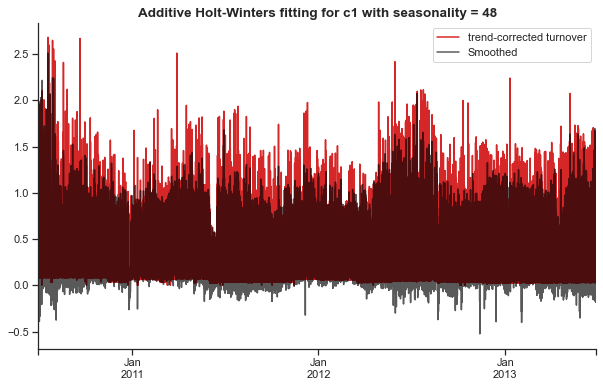

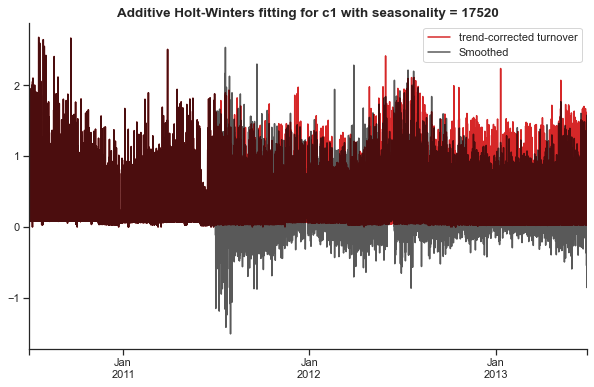

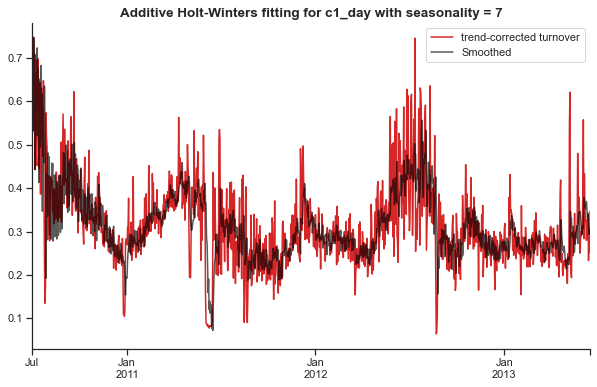

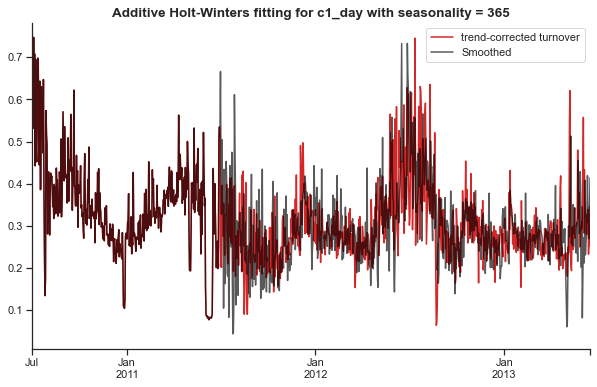

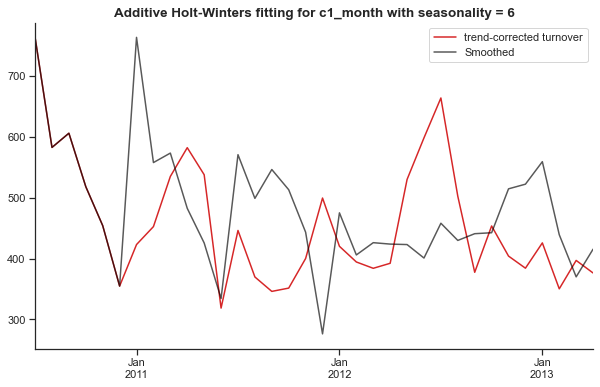

...

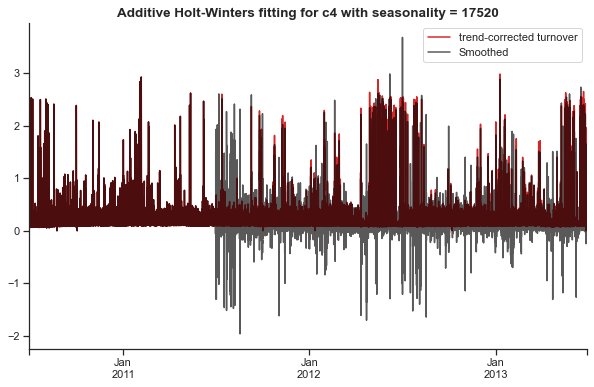

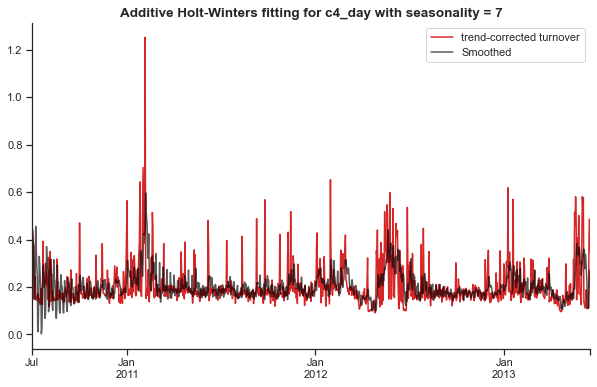

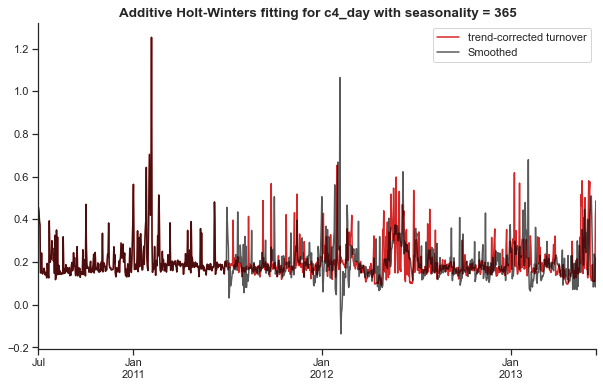

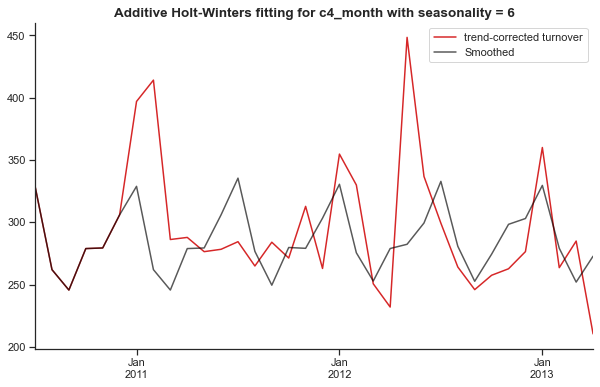

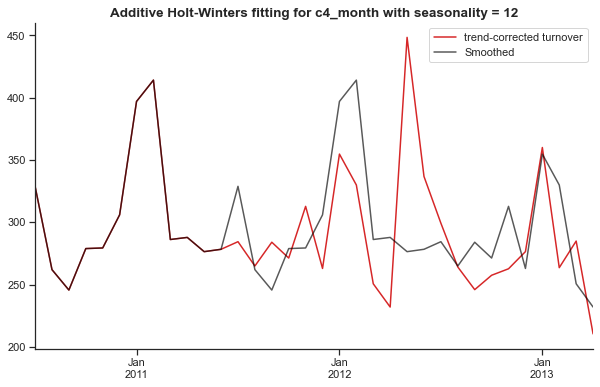

In [39]:
for name, m_values_dict in ahw_fitting.items():
    for m, ahw in m_values_dict.items():
        smoothed = pd.Series(ahw.smooth(), index=train_sets[name].index)
        
        fig, ax = plt.subplots(figsize=(10, 6))
        train_sets[name].plot(color='#D62728', label='trend-corrected turnover')
        smoothed.plot(color='black', label='Smoothed', alpha=0.65)
        plt.legend(loc='best')
        ax.set_xlabel('')
        ax.set_xticks([], minor=True)
        ax.set_title(f'Additive Holt-Winters fitting for {name} with seasonality = {m}', fontsize=13.5, fontweight='bold')
        sns.despine()
        plt.show()

<span style="color: green; font-size: 16px; font-weight: bold;">Point and Probabilistic forecast using Additive Holt-winter.</span>  

Additive Holt-Winters forecast for c1 with seasonality = 48:
2013-06-29 00:00    0.295149
2013-06-29 00:30    0.464423
2013-06-29 01:00    0.419967
2013-06-29 01:30    0.377644
2013-06-29 02:00    0.356858
2013-06-29 02:30    0.329349
2013-06-29 03:00    0.323226
2013-06-29 03:30    0.902145
2013-06-29 04:00    0.236299
2013-06-29 04:30    0.152543
2013-06-29 05:00    0.190692
2013-06-29 05:30    0.946982
2013-06-29 06:00    0.444139
2013-06-29 06:30    0.516867
2013-06-29 07:00    0.178165
2013-06-29 07:30    0.169914
2013-06-29 08:00    0.330868
2013-06-29 08:30    0.448042
2013-06-29 09:00    0.343970
2013-06-29 09:30    0.266116
2013-06-29 10:00    0.200897
2013-06-29 10:30    0.236049
2013-06-29 11:00    0.318311
2013-06-29 11:30    0.652596
2013-06-29 12:00    0.568161
2013-06-29 12:30    0.441578
2013-06-29 13:00    0.470137
2013-06-29 13:30    0.507848
2013-06-29 14:00    0.392611
2013-06-29 14:30    0.448215
2013-06-29 15:00    0.583469
2013-06-29 15:30    0.753278
2013-06-29 

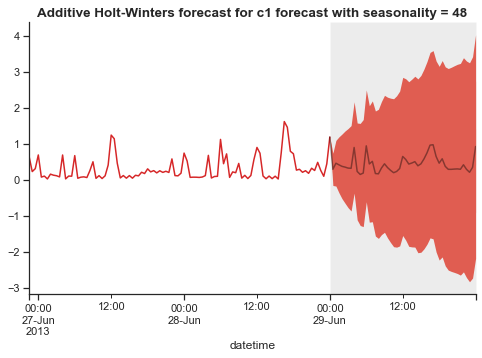

Additive Holt-Winters forecast for c1 with seasonality = 17520:
2013-06-29 00:00    0.657596
2013-06-29 00:30    0.496596
2013-06-29 01:00    0.127596
2013-06-29 01:30    0.065596
2013-06-29 02:00    0.101596
2013-06-29 02:30    0.042596
2013-06-29 03:00    0.098596
2013-06-29 03:30    0.492596
2013-06-29 04:00    0.094596
2013-06-29 04:30    0.076596
2013-06-29 05:00    0.062596
2013-06-29 05:30    0.541596
2013-06-29 06:00    0.041596
2013-06-29 06:30    0.259596
2013-06-29 07:00    0.727596
2013-06-29 07:30    0.874596
2013-06-29 08:00    0.204596
2013-06-29 08:30    0.225596
2013-06-29 09:00    0.142596
2013-06-29 09:30    0.067596
2013-06-29 10:00    0.120596
2013-06-29 10:30    0.291596
2013-06-29 11:00    0.986596
2013-06-29 11:30    1.059596
2013-06-29 12:00    0.434596
2013-06-29 12:30    1.378596
2013-06-29 13:00    1.414596
2013-06-29 13:30    1.449596
2013-06-29 14:00    0.978596
2013-06-29 14:30    0.244596
2013-06-29 15:00    0.672596
2013-06-29 15:30    1.228596
2013-06-

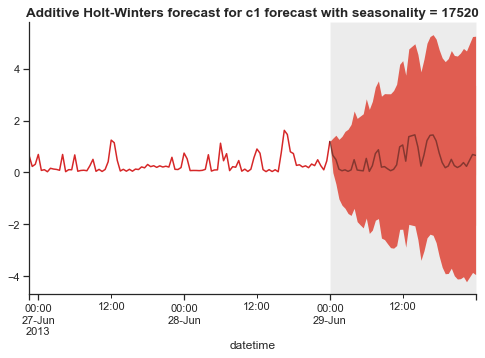

Additive Holt-Winters forecast for c1_day with seasonality = 7:
2013-06-17    0.310520
2013-06-18    0.297940
2013-06-19    0.318892
2013-06-20    0.295998
2013-06-21    0.286785
2013-06-22    0.290026
2013-06-23    0.306354
Freq: D, dtype: float64
Probabilistic forecast for c1_day at 95% quantile:
                   0         1
2013-06-17  0.159346  0.461695
2013-06-18  0.084148  0.511733
2013-06-19  0.057051  0.580734
2013-06-20 -0.006351  0.598346
2013-06-21 -0.051252  0.624821
2013-06-22 -0.080274  0.660326
2013-06-23 -0.093615  0.706324


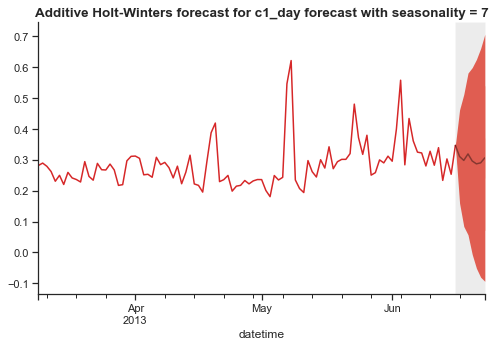

Additive Holt-Winters forecast for c1_day with seasonality = 365:
2013-06-17    0.434645
2013-06-18    0.486750
2013-06-19    0.554687
2013-06-20    0.484812
2013-06-21    0.424645
2013-06-22    0.355562
2013-06-23    0.403208
Freq: D, dtype: float64
Probabilistic forecast for c1_day at 95% quantile:
                   0         1
2013-06-17  0.246396  0.622894
2013-06-18  0.220525  0.752974
2013-06-19  0.228630  0.880744
2013-06-20  0.108314  0.861310
2013-06-21  0.003708  0.845583
2013-06-22 -0.105552  0.816676
2013-06-23 -0.094852  0.901268


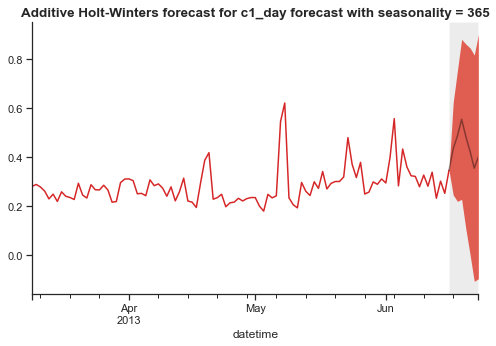

Additive Holt-Winters forecast for c1_month with seasonality = 6:
2013-05    481.453149
Freq: M, dtype: float64
Probabilistic forecast for c1_month at 95% quantile:
                  0           1
2013-05  212.900452  750.005846


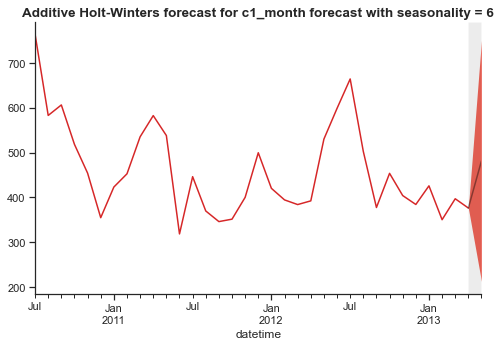

Additive Holt-Winters forecast for c1_month with seasonality = 12:
2013-05    498.493379
Freq: M, dtype: float64
Probabilistic forecast for c1_month at 95% quantile:
                  0           1
2013-05  204.370802  792.615956


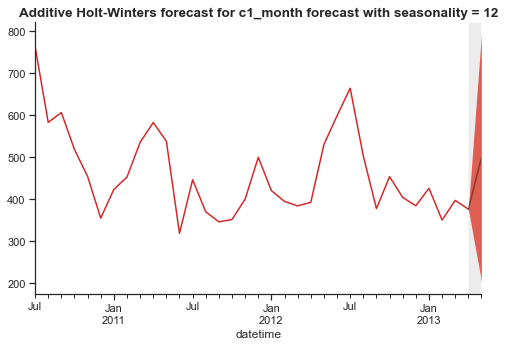

Additive Holt-Winters forecast for c2 with seasonality = 48:
2013-06-29 00:00    0.135271
2013-06-29 00:30    0.092115
2013-06-29 01:00    0.076587
2013-06-29 01:30    0.082400
2013-06-29 02:00    0.076738
2013-06-29 02:30    0.075481
2013-06-29 03:00    0.034910
2013-06-29 03:30   -0.015556
2013-06-29 04:00   -0.058185
2013-06-29 04:30   -0.102239
2013-06-29 05:00   -0.134548
2013-06-29 05:30   -0.165341
2013-06-29 06:00   -0.204573
2013-06-29 06:30   -0.220752
2013-06-29 07:00   -0.005762
2013-06-29 07:30   -0.038164
2013-06-29 08:00   -0.104243
2013-06-29 08:30   -0.144435
2013-06-29 09:00   -0.153057
2013-06-29 09:30   -0.119600
2013-06-29 10:00   -0.037758
2013-06-29 10:30    0.074864
2013-06-29 11:00    0.152324
2013-06-29 11:30    0.182280
2013-06-29 12:00    0.198755
2013-06-29 12:30    0.148562
2013-06-29 13:00    0.143851
2013-06-29 13:30    0.161274
2013-06-29 14:00    0.173614
2013-06-29 14:30    0.189284
2013-06-29 15:00    0.184934
2013-06-29 15:30    0.231351
2013-06-29 

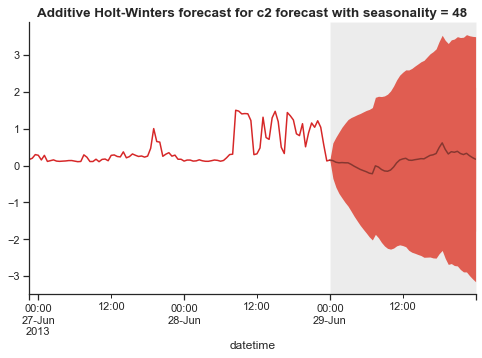

Additive Holt-Winters forecast for c2 with seasonality = 17520:
2013-06-29 00:00   -0.695549
2013-06-29 00:30   -0.562549
2013-06-29 01:00   -0.619549
2013-06-29 01:30   -0.759549
2013-06-29 02:00   -0.615549
2013-06-29 02:30   -0.763549
2013-06-29 03:00   -0.685549
2013-06-29 03:30   -0.688549
2013-06-29 04:00   -0.776549
2013-06-29 04:30   -0.735549
2013-06-29 05:00   -0.736549
2013-06-29 05:30   -0.779549
2013-06-29 06:00   -0.748549
2013-06-29 06:30   -0.737549
2013-06-29 07:00   -0.771549
2013-06-29 07:30   -0.785549
2013-06-29 08:00   -0.745549
2013-06-29 08:30   -0.725549
2013-06-29 09:00   -0.748549
2013-06-29 09:30   -0.746549
2013-06-29 10:00   -0.533549
2013-06-29 10:30   -0.644549
2013-06-29 11:00   -0.751549
2013-06-29 11:30   -0.683549
2013-06-29 12:00   -0.684549
2013-06-29 12:30   -0.776549
2013-06-29 13:00   -0.359549
2013-06-29 13:30   -0.636549
2013-06-29 14:00   -0.710549
2013-06-29 14:30   -0.703549
2013-06-29 15:00   -0.743549
2013-06-29 15:30   -0.555549
2013-06-

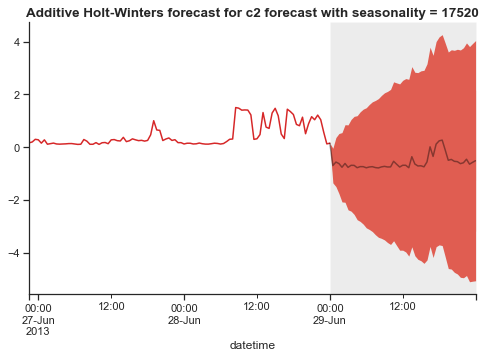

Additive Holt-Winters forecast for c2_day with seasonality = 7:
2013-06-17    0.314654
2013-06-18    0.306262
2013-06-19    0.304582
2013-06-20    0.345625
2013-06-21    0.317873
2013-06-22    0.360034
2013-06-23    0.345565
Freq: D, dtype: float64
Probabilistic forecast for c2_day at 95% quantile:
                   0         1
2013-06-17  0.055523  0.573785
2013-06-18 -0.060205  0.672728
2013-06-19 -0.144246  0.753410
2013-06-20 -0.172637  0.863887
2013-06-21 -0.261562  0.897307
2013-06-22 -0.274704  0.994773
2013-06-23 -0.340031  1.031161


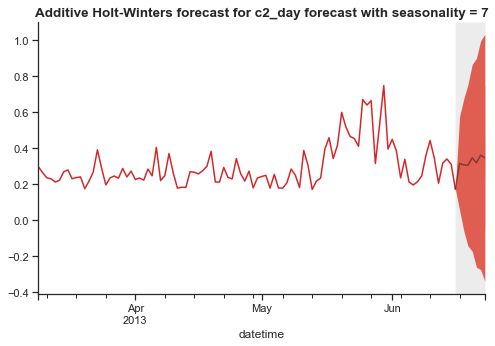

Additive Holt-Winters forecast for c2_day with seasonality = 365:
2013-06-17    0.280627
2013-06-18    0.278918
2013-06-19    0.263273
2013-06-20    0.246939
2013-06-21    0.250335
2013-06-22    0.515564
2013-06-23    0.562793
Freq: D, dtype: float64
Probabilistic forecast for c2_day at 95% quantile:
                   0         1
2013-06-17 -0.056979  0.618232
2013-06-18 -0.198528  0.756365
2013-06-19 -0.321477  0.848022
2013-06-20 -0.428271  0.922150
2013-06-21 -0.504573  1.005244
2013-06-22 -0.311397  1.342525
2013-06-23 -0.330426  1.456013


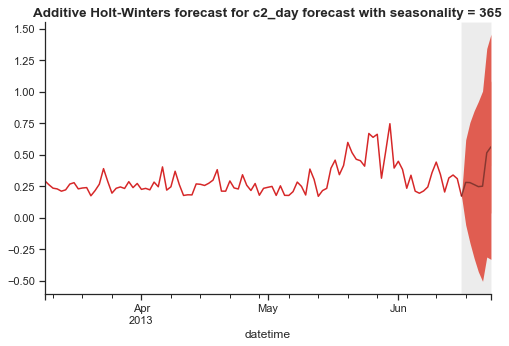

Additive Holt-Winters forecast for c2_month with seasonality = 6:
2013-05    187.23679
Freq: M, dtype: float64
Probabilistic forecast for c2_month at 95% quantile:
                  0           1
2013-05 -123.096418  497.569997


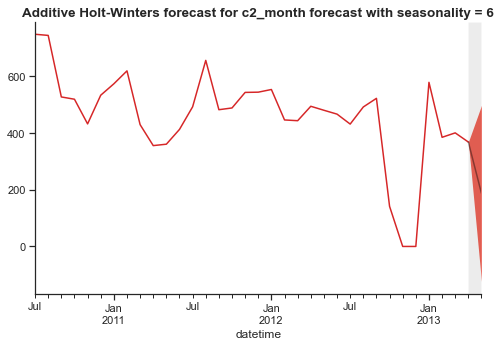

Additive Holt-Winters forecast for c2_month with seasonality = 12:
2013-05    240.359634
Freq: M, dtype: float64
Probabilistic forecast for c2_month at 95% quantile:
                  0           1
2013-05 -143.929584  624.648851


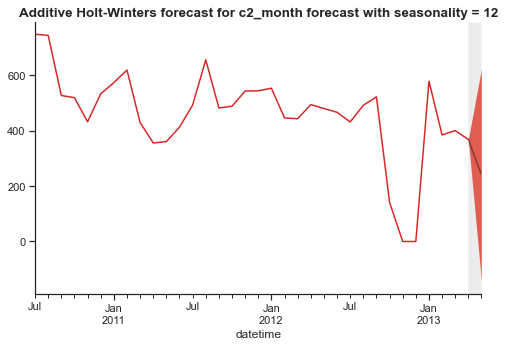

Additive Holt-Winters forecast for c3 with seasonality = 48:
2013-06-29 00:00    0.129331
2013-06-29 00:30    0.081491
2013-06-29 01:00    0.036982
2013-06-29 01:30    0.028574
2013-06-29 02:00   -0.038625
2013-06-29 02:30   -0.065544
2013-06-29 03:00   -0.078053
2013-06-29 03:30   -0.099081
2013-06-29 04:00   -0.125777
2013-06-29 04:30   -0.131005
2013-06-29 05:00   -0.172826
2013-06-29 05:30   -0.225566
2013-06-29 06:00   -0.208401
2013-06-29 06:30   -0.232248
2013-06-29 07:00   -0.227683
2013-06-29 07:30   -0.307133
2013-06-29 08:00   -0.233179
2013-06-29 08:30   -0.250414
2013-06-29 09:00   -0.263580
2013-06-29 09:30   -0.255212
2013-06-29 10:00   -0.271104
2013-06-29 10:30   -0.272899
2013-06-29 11:00   -0.256961
2013-06-29 11:30   -0.249542
2013-06-29 12:00   -0.259152
2013-06-29 12:30   -0.237106
2013-06-29 13:00   -0.241923
2013-06-29 13:30   -0.244647
2013-06-29 14:00   -0.253309
2013-06-29 14:30   -0.265293
2013-06-29 15:00   -0.217314
2013-06-29 15:30   -0.194442
2013-06-29 

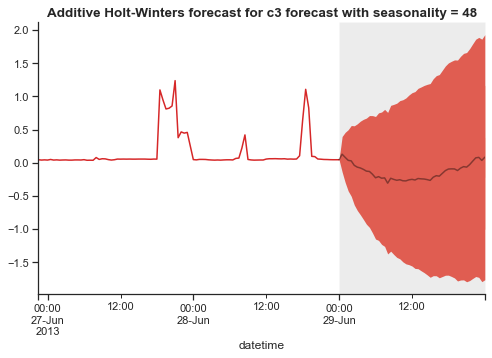

Additive Holt-Winters forecast for c3 with seasonality = 17520:
2013-06-29 00:00   -0.197839
2013-06-29 00:30   -0.163839
2013-06-29 01:00   -0.243839
2013-06-29 01:30   -0.246839
2013-06-29 02:00   -0.248839
2013-06-29 02:30   -0.197839
2013-06-29 03:00   -0.239839
2013-06-29 03:30   -0.212839
2013-06-29 04:00   -0.251839
2013-06-29 04:30   -0.251839
2013-06-29 05:00   -0.253839
2013-06-29 05:30   -0.243839
2013-06-29 06:00   -0.242839
2013-06-29 06:30   -0.243839
2013-06-29 07:00   -0.255839
2013-06-29 07:30   -0.260839
2013-06-29 08:00   -0.261839
2013-06-29 08:30   -0.247839
2013-06-29 09:00   -0.251839
2013-06-29 09:30   -0.229839
2013-06-29 10:00   -0.236839
2013-06-29 10:30   -0.240839
2013-06-29 11:00   -0.258839
2013-06-29 11:30   -0.253839
2013-06-29 12:00   -0.188839
2013-06-29 12:30   -0.188839
2013-06-29 13:00   -0.105839
2013-06-29 13:30   -0.188839
2013-06-29 14:00   -0.158839
2013-06-29 14:30   -0.203839
2013-06-29 15:00    0.260161
2013-06-29 15:30    0.249161
2013-06-

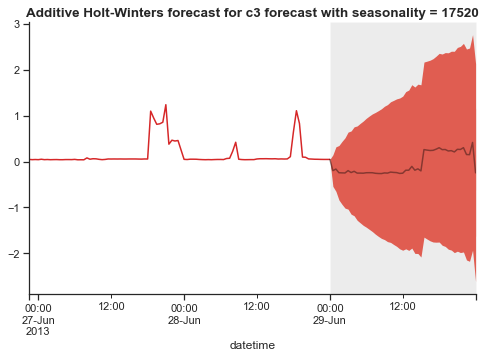

Additive Holt-Winters forecast for c3_day with seasonality = 7:
2013-06-17    0.144365
2013-06-18    0.147772
2013-06-19    0.150286
2013-06-20    0.176898
2013-06-21    0.133071
2013-06-22    0.162595
2013-06-23    0.162954
Freq: D, dtype: float64
Probabilistic forecast for c3_day at 95% quantile:
                   0         1
2013-06-17 -0.017737  0.306468
2013-06-18 -0.081476  0.377019
2013-06-19 -0.130483  0.431056
2013-06-20 -0.147307  0.501103
2013-06-21 -0.229401  0.495543
2013-06-22 -0.234473  0.559663
2013-06-23 -0.265929  0.591836


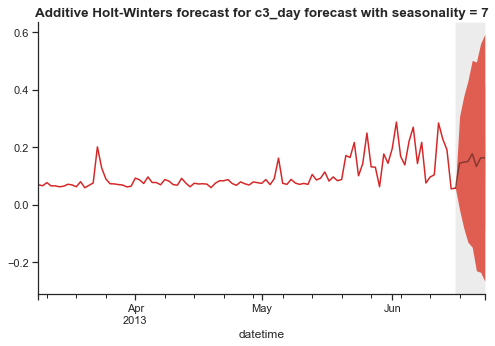

Additive Holt-Winters forecast for c3_day with seasonality = 365:
2013-06-17    0.142548
2013-06-18    0.170611
2013-06-19    0.135882
2013-06-20    0.155757
2013-06-21    0.443673
2013-06-22    0.250715
2013-06-23    0.108215
Freq: D, dtype: float64
Probabilistic forecast for c3_day at 95% quantile:
                   0         1
2013-06-17 -0.063855  0.348952
2013-06-18 -0.121288  0.462509
2013-06-19 -0.221620  0.493383
2013-06-20 -0.257051  0.568564
2013-06-21 -0.017859  0.905206
2013-06-22 -0.254869  0.756298
2013-06-23 -0.437878  0.654308


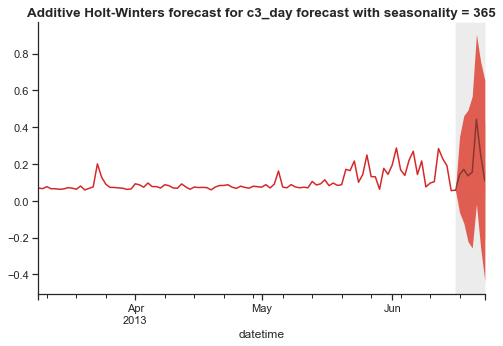

Additive Holt-Winters forecast for c3_month with seasonality = 6:
2013-05    87.32981
Freq: M, dtype: float64
Probabilistic forecast for c3_month at 95% quantile:
                  0           1
2013-05 -112.674715  287.334336


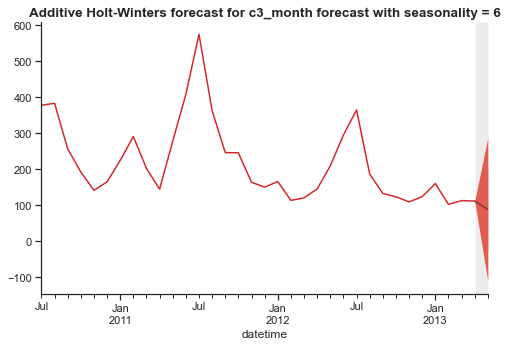

Additive Holt-Winters forecast for c3_month with seasonality = 12:
2013-05    206.054672
Freq: M, dtype: float64
Probabilistic forecast for c3_month at 95% quantile:
                 0           1
2013-05  54.873388  357.235956


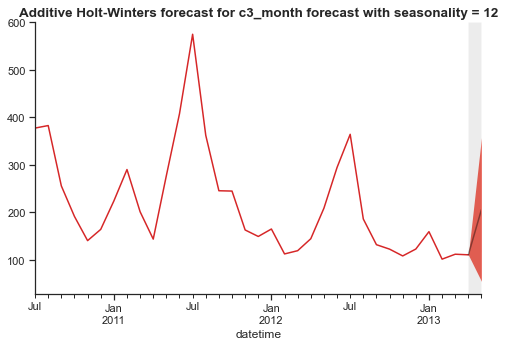

Additive Holt-Winters forecast for c4 with seasonality = 48:
2013-06-29 00:00    0.136342
2013-06-29 00:30    0.091711
2013-06-29 01:00    0.023213
2013-06-29 01:30   -0.009335
2013-06-29 02:00   -0.027110
2013-06-29 02:30   -0.021055
2013-06-29 03:00    0.011701
2013-06-29 03:30    0.067121
2013-06-29 04:00    0.153528
2013-06-29 04:30    0.177500
2013-06-29 05:00    0.236630
2013-06-29 05:30    0.304467
2013-06-29 06:00    0.625631
2013-06-29 06:30    0.749720
2013-06-29 07:00    0.535586
2013-06-29 07:30    0.495156
2013-06-29 08:00    0.576783
2013-06-29 08:30    0.600354
2013-06-29 09:00    0.598279
2013-06-29 09:30    0.587424
2013-06-29 10:00    0.352206
2013-06-29 10:30    0.295512
2013-06-29 11:00    0.290785
2013-06-29 11:30    0.240006
2013-06-29 12:00    0.212228
2013-06-29 12:30    0.198859
2013-06-29 13:00    0.211124
2013-06-29 13:30    0.206343
2013-06-29 14:00    0.215092
2013-06-29 14:30    0.208903
2013-06-29 15:00    0.143632
2013-06-29 15:30    0.118991
2013-06-29 

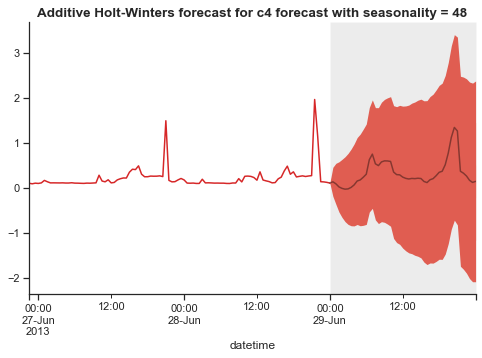

Additive Holt-Winters forecast for c4 with seasonality = 17520:
2013-06-29 00:00    0.125574
2013-06-29 00:30    0.115574
2013-06-29 01:00    0.120574
2013-06-29 01:30    0.113574
2013-06-29 02:00    0.119574
2013-06-29 02:30    0.124574
2013-06-29 03:00    0.226574
2013-06-29 03:30    0.179574
2013-06-29 04:00    0.145574
2013-06-29 04:30    0.135574
2013-06-29 05:00    0.131574
2013-06-29 05:30    0.128574
2013-06-29 06:00    0.134574
2013-06-29 06:30    0.130574
2013-06-29 07:00    0.124574
2013-06-29 07:30    0.118574
2013-06-29 08:00    0.242574
2013-06-29 08:30    0.242574
2013-06-29 09:00    0.184574
2013-06-29 09:30    0.147574
2013-06-29 10:00    0.129574
2013-06-29 10:30    0.132574
2013-06-29 11:00    0.140574
2013-06-29 11:30    0.128574
2013-06-29 12:00    0.126574
2013-06-29 12:30    0.125574
2013-06-29 13:00    0.154574
2013-06-29 13:30    0.230574
2013-06-29 14:00    0.255574
2013-06-29 14:30    0.277574
2013-06-29 15:00    0.336574
2013-06-29 15:30    0.296574
2013-06-

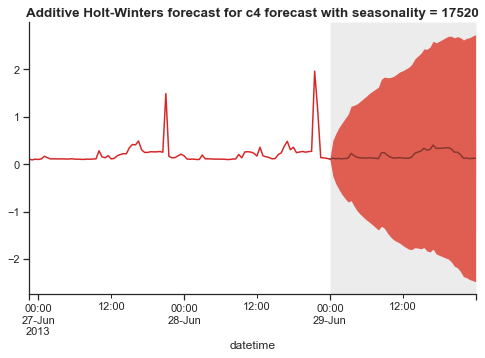

Additive Holt-Winters forecast for c4_day with seasonality = 7:
2013-06-17    0.268418
2013-06-18    0.185916
2013-06-19    0.220132
2013-06-20    0.192226
2013-06-21    0.273780
2013-06-22    0.301780
2013-06-23    0.272597
Freq: D, dtype: float64
Probabilistic forecast for c4_day at 95% quantile:
                   0         1
2013-06-17  0.094386  0.442450
2013-06-18 -0.060203  0.432034
2013-06-19 -0.081300  0.521564
2013-06-20 -0.155838  0.540289
2013-06-21 -0.115367  0.662927
2013-06-22 -0.124510  0.728069
2013-06-23 -0.187848  0.733043


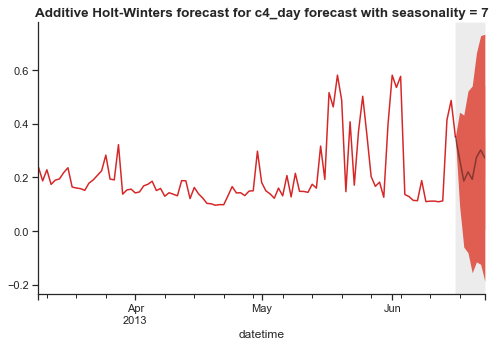

Additive Holt-Winters forecast for c4_day with seasonality = 365:
2013-06-17    0.257204
2013-06-18    0.249995
2013-06-19    0.229308
2013-06-20    0.252954
2013-06-21    0.255245
2013-06-22    0.241954
2013-06-23    0.238016
Freq: D, dtype: float64
Probabilistic forecast for c4_day at 95% quantile:
                   0         1
2013-06-17  0.036298  0.478109
2013-06-18 -0.062413  0.562403
2013-06-19 -0.153312  0.611928
2013-06-20 -0.188858  0.694765
2013-06-21 -0.238715  0.749206
2013-06-22 -0.299153  0.783060
2013-06-23 -0.346446  0.822478


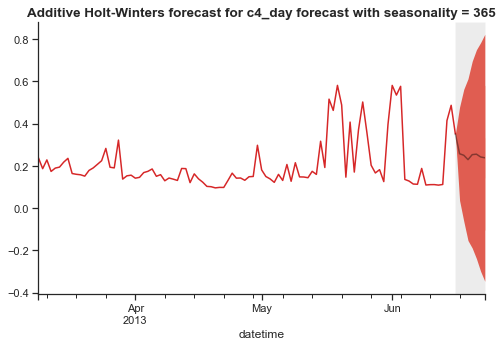

Additive Holt-Winters forecast for c4_month with seasonality = 6:
2013-05    298.388831
Freq: M, dtype: float64
Probabilistic forecast for c4_month at 95% quantile:
                  0           1
2013-05  186.365993  410.411668


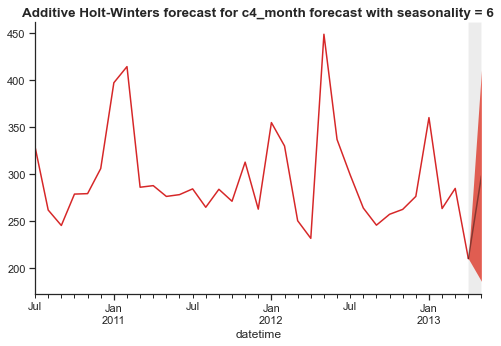

Additive Holt-Winters forecast for c4_month with seasonality = 12:
2013-05    276.449
Freq: M, dtype: float64
Probabilistic forecast for c4_month at 95% quantile:
                  0           1
2013-05  163.243307  389.654693


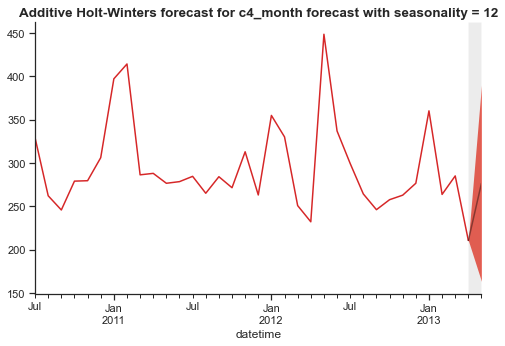

In [40]:
ahw_preds = {}
for name, ahw_dict in ahw_fitting.items():
    validation_set = validation_sets[name]  
    frequency = train_sets[name].index.freq  # store the frequency of the time series in the variable 'frequency'
    train_set = train_sets[name]
    ahw_preds[name] = {}
    for m, ahw in ahw_dict.items():
        h = len(validation_set)
        test = pd.period_range(start=validation_set.index[0], periods=h, freq=frequency)
        ahw_pred = pd.Series(ahw.forecast(h), index=test)
        ahw_preds[name][m] = ahw_pred
        
        intv_ahw = pd.DataFrame(ahw.intervalforecast(h, level=.95), index=test)
        intv1 = pd.DataFrame(ahw.intervalforecast(h, level=.75), index=test)
        intv2 = pd.DataFrame(ahw.intervalforecast(h, level=.25), index=test)

        fig, ax = forecast.fanchart(train_set[-100:], ahw_pred, intv_ahw, intv1, intv2)

        plt.title(f'Additive Holt-Winters forecast for {name} forecast with seasonality = {m}', fontsize=13.5, fontweight='bold')

        print(f'Additive Holt-Winters forecast for {name} with seasonality = {m}:')
        print(ahw_pred)
        print(f'Probabilistic forecast for {name} at 95% quantile:')
        print(intv_ahw)

        sns.despine()
        plt.show()


<span style="color: green; font-size: 16px; font-weight: bold;">MAE calculation.</span>  

- Here I use my own method to search for the optimal seasonal window -  the one that return the lowest m value

In [41]:
mae_ahw = {}

for name, ahw_pred in ahw_preds.items():
    mae_dict = {}
    validation_set = validation_sets[name]
    
    for m_value, pred in ahw_pred.items():  
        mae = np.abs(validation_set - pred).mean()
        mae_dict[m_value] = {'MAE': mae}  # Update the structure of mae_dict

    
    if mae_dict:
        best_m = min(mae_dict, key=lambda x: mae_dict[x]['MAE'])
        best_mae = round(mae_dict[best_m]['MAE'], 3)  # Access the 'MAE' value correctly
        mae_ahw[name] = {'best_m': best_m, 'MAE': best_mae}

for name, values in mae_ahw.items():
    best_m = values['best_m']
    best_mae = values['MAE']
    print(f"{name}: m = {best_m}, MAE = {best_mae}")


c1: m = 48, MAE = 0.25
c1_day: m = 7, MAE = 0.068
c1_month: m = 6, MAE = 34.601
c2: m = 48, MAE = 0.246
c2_day: m = 7, MAE = 0.059
c2_month: m = 12, MAE = 311.79
c3: m = 48, MAE = 0.272
c3_day: m = 365, MAE = 0.106
c3_month: m = 12, MAE = 40.837
c4: m = 17520, MAE = 0.121
c4_day: m = 7, MAE = 0.123
c4_month: m = 6, MAE = 75.134


<span style="color: red; font-size: 18px; font-weight: bold;">B.4.Additive Damped Holt-winter.</span>

In [42]:
ahw_damped_fitting = {}

for name, train_set in train_sets.items():
    m_values_name = m_values.get(name, [])
    for m in m_values_name:
        if m == 1:
            continue
        
        ahw_damped=forecast.holtwinters(train_set, additive=True, damped=True, m=m) 
        ahw_damped.fit()
        print(f'Additive holt-winters (Damped) fitting for {name} with seasonality = {m}')
        ahw_damped.summary()
        ahw_damped_fitting.setdefault(name, {})[m] = ahw_damped # store the new fitting data to the dictionary with the corresponding name

Additive holt-winters (Damped) fitting for c1 with seasonality = 48
 Additive Holt-winters exponential smoothing (damped trend)

 Smoothing parameters:
 alpha (level)    0.291 (0.010)
 beta  (trend)    0.000 (0.006)
 delta (seasonal) 0.192 (0.003)
 phi (damping)    0.847 (0.004)
 
 In-sample fit:
 MSE               0.052
 RMSE              0.229
 Log-likelihood    2941.301
 AIC               -5872.603
 BIC               -5828.259
Additive holt-winters (Damped) fitting for c1 with seasonality = 17520
 Additive Holt-winters exponential smoothing (damped trend)

 Smoothing parameters:
 alpha (level)    0.199 (0.003)
 beta  (trend)    1.000 (0.026)
 delta (seasonal) 0.510 (0.008)
 phi (damping)    0.000 (0.017)
 
 In-sample fit:
 MSE               0.106
 RMSE              0.326
 Log-likelihood   -15645.995
 AIC               31301.991
 BIC               31346.335
Additive holt-winters (Damped) fitting for c1_day with seasonality = 7
 Additive Holt-winters exponential smoothing (damped tren

Additive holt-winters (Damped) fitting for c4 with seasonality = 17520
 Additive Holt-winters exponential smoothing (damped trend)

 Smoothing parameters:
 alpha (level)    0.435 (0.006)
 beta  (trend)    0.979 (0.025)
 delta (seasonal) 0.378 (0.007)
 phi (damping)    0.000 (0.004)
 
 In-sample fit:
 MSE               0.035
 RMSE              0.187
 Log-likelihood    13607.673
 AIC               -27205.347
 BIC               -27161.003
Additive holt-winters (Damped) fitting for c4_day with seasonality = 7
 Additive Holt-winters exponential smoothing (damped trend)

 Smoothing parameters:
 alpha (level)    0.180 (0.039)
 beta  (trend)    0.000 (0.037)
 delta (seasonal) 0.147 (0.019)
 phi (damping)    0.844 (0.027)
 
 In-sample fit:
 MSE               0.008
 RMSE              0.089
 Log-likelihood    1084.204
 AIC               -2158.409
 BIC               -2133.476
Additive holt-winters (Damped) fitting for c4_day with seasonality = 365
 Additive Holt-winters exponential smoothing (damp

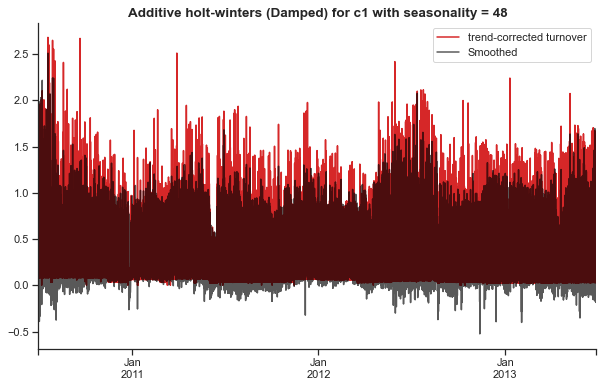

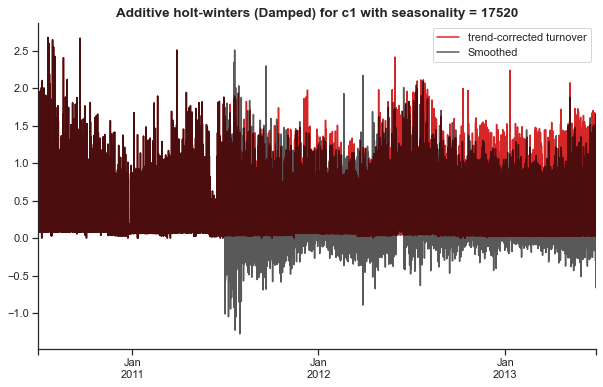

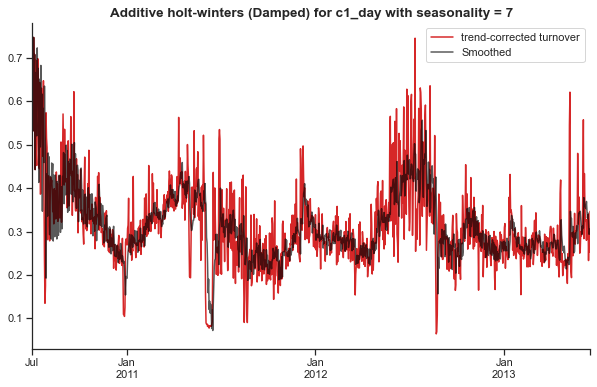

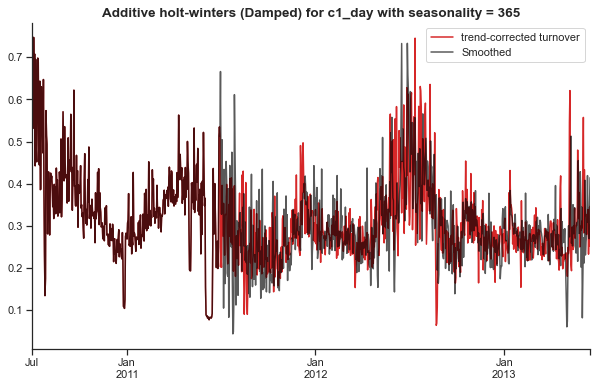

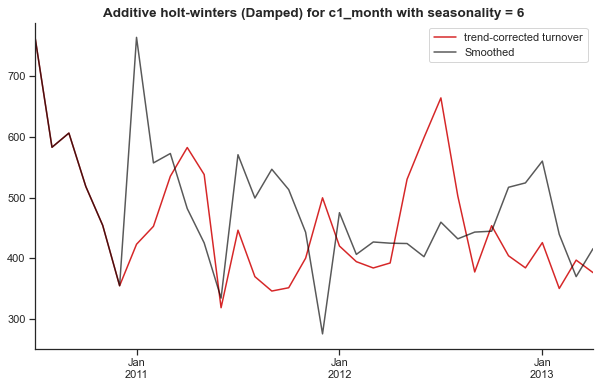

...

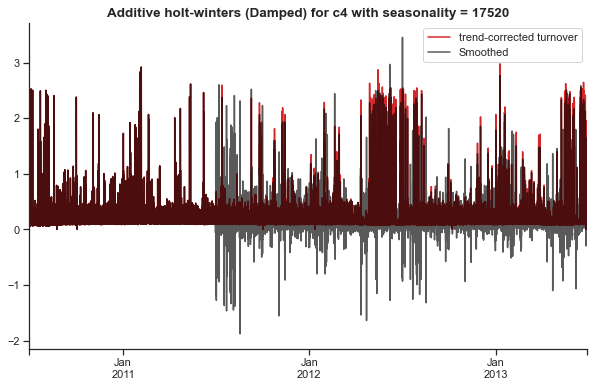

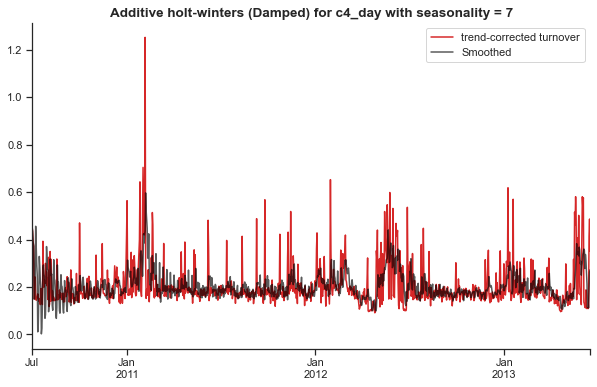

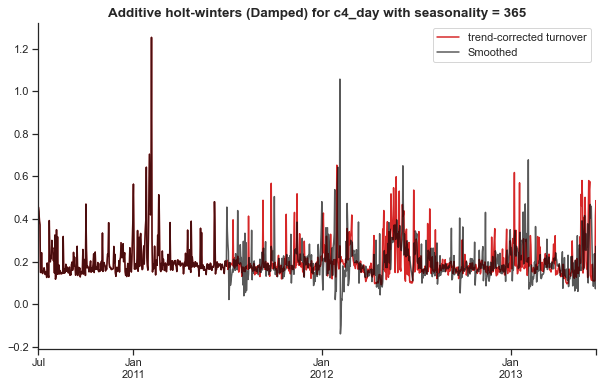

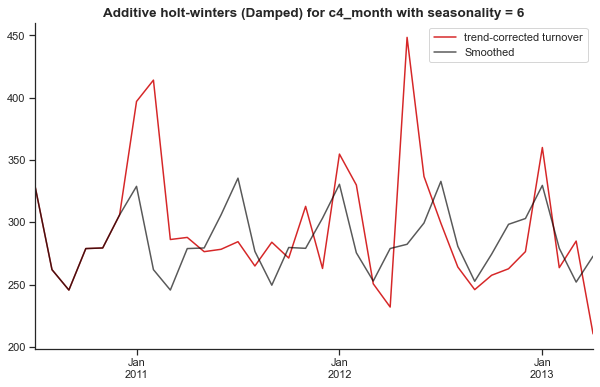

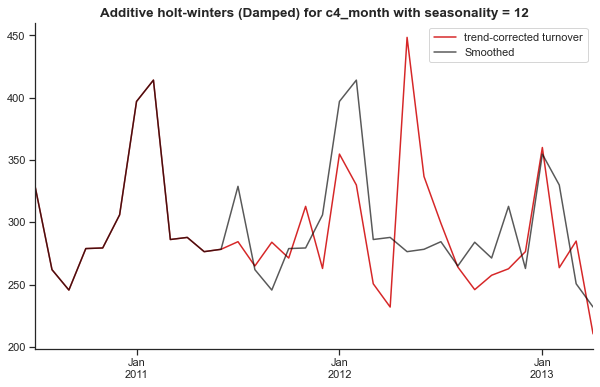

In [43]:
for name, ahw_damped_dict in ahw_damped_fitting.items():
    for m, ahw_damped in ahw_damped_dict.items():
        train_set = train_sets[name]
        smoothed = pd.Series(ahw_damped.smooth(), index=train_set.index)

        # Plot the graph between time series and the forecast value (smoothed)
        fig, ax = plt.subplots(figsize=(10, 6))
    
        train_set.plot(color='#D62728', label='trend-corrected turnover')
        smoothed.plot(color='black', label='Smoothed', alpha=0.65)
        plt.legend(loc='best')
        ax.set_xlabel('')
        ax.set_xticks([], minor=True)
        ax.set_title(f'Additive holt-winters (Damped) for {name} with seasonality = {m}', fontsize=13.5, fontweight='bold')
    
        sns.despine()
        plt.show()

<span style="color: green; font-size: 16px; font-weight: bold;">Point and Probabilistic forecast for Additive Damped Holt-winter.</span>  

Additive holt-winters (Damped) forecast for c1 with seasonality = 48:
2013-06-29 00:00    0.295139
2013-06-29 00:30    0.464430
2013-06-29 01:00    0.419974
2013-06-29 01:30    0.377650
2013-06-29 02:00    0.356859
2013-06-29 02:30    0.329349
2013-06-29 03:00    0.323222
2013-06-29 03:30    0.902150
2013-06-29 04:00    0.236302
2013-06-29 04:30    0.152541
2013-06-29 05:00    0.190686
2013-06-29 05:30    0.946971
2013-06-29 06:00    0.444134
2013-06-29 06:30    0.516875
2013-06-29 07:00    0.178164
2013-06-29 07:30    0.169911
2013-06-29 08:00    0.330863
2013-06-29 08:30    0.448039
2013-06-29 09:00    0.343961
2013-06-29 09:30    0.266113
2013-06-29 10:00    0.200889
2013-06-29 10:30    0.236043
2013-06-29 11:00    0.318308
2013-06-29 11:30    0.652610
2013-06-29 12:00    0.568164
2013-06-29 12:30    0.441569
2013-06-29 13:00    0.470135
2013-06-29 13:30    0.507847
2013-06-29 14:00    0.392602
2013-06-29 14:30    0.448215
2013-06-29 15:00    0.583478
2013-06-29 15:30    0.753292
20

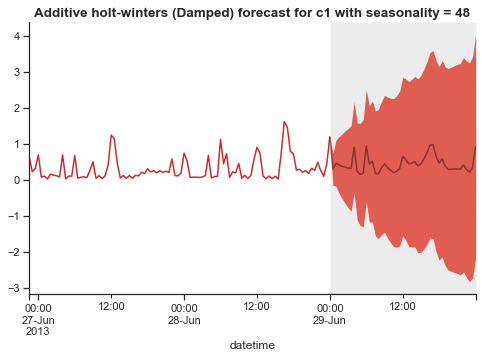

Additive holt-winters (Damped) forecast for c1 with seasonality = 17520:
2013-06-29 00:00    0.595386
2013-06-29 00:30    0.434386
2013-06-29 01:00    0.065386
2013-06-29 01:30    0.003386
2013-06-29 02:00    0.039386
2013-06-29 02:30   -0.019614
2013-06-29 03:00    0.036386
2013-06-29 03:30    0.430386
2013-06-29 04:00    0.032386
2013-06-29 04:30    0.014386
2013-06-29 05:00    0.000386
2013-06-29 05:30    0.479386
2013-06-29 06:00   -0.020614
2013-06-29 06:30    0.197386
2013-06-29 07:00    0.665386
2013-06-29 07:30    0.812386
2013-06-29 08:00    0.142386
2013-06-29 08:30    0.163386
2013-06-29 09:00    0.080386
2013-06-29 09:30    0.005386
2013-06-29 10:00    0.058386
2013-06-29 10:30    0.229386
2013-06-29 11:00    0.924386
2013-06-29 11:30    0.997386
2013-06-29 12:00    0.372386
2013-06-29 12:30    1.316386
2013-06-29 13:00    1.352386
2013-06-29 13:30    1.387386
2013-06-29 14:00    0.916386
2013-06-29 14:30    0.182386
2013-06-29 15:00    0.610386
2013-06-29 15:30    1.166386

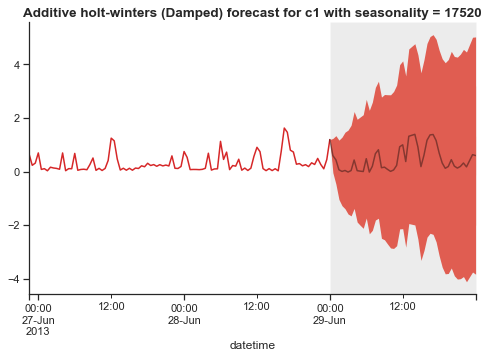

Additive holt-winters (Damped) forecast for c1_day with seasonality = 7:
2013-06-17    0.310538
2013-06-18    0.297925
2013-06-19    0.318922
2013-06-20    0.296003
2013-06-21    0.286780
2013-06-22    0.290010
2013-06-23    0.306346
Freq: D, dtype: float64
Probabilistic forecast for c1_day at 95% quantile:
                   0         1
2013-06-17  0.159293  0.461783
2013-06-18  0.084033  0.511818
2013-06-19  0.056958  0.580886
2013-06-20 -0.006487  0.598493
2013-06-21 -0.051414  0.624974
2013-06-22 -0.080463  0.660483
2013-06-23 -0.093811  0.706502


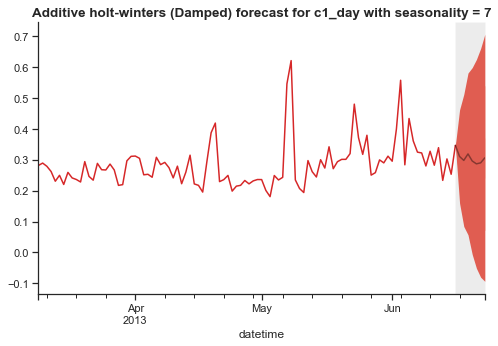

Additive holt-winters (Damped) forecast for c1_day with seasonality = 365:
2013-06-17    0.434644
2013-06-18    0.486748
2013-06-19    0.554686
2013-06-20    0.484811
2013-06-21    0.424644
2013-06-22    0.355561
2013-06-23    0.403207
Freq: D, dtype: float64
Probabilistic forecast for c1_day at 95% quantile:
                   0         1
2013-06-17  0.246263  0.623025
2013-06-18  0.220337  0.753159
2013-06-19  0.228400  0.880972
2013-06-20  0.108049  0.861573
2013-06-21  0.003411  0.845877
2013-06-22 -0.105877  0.816998
2013-06-23 -0.095203  0.901616


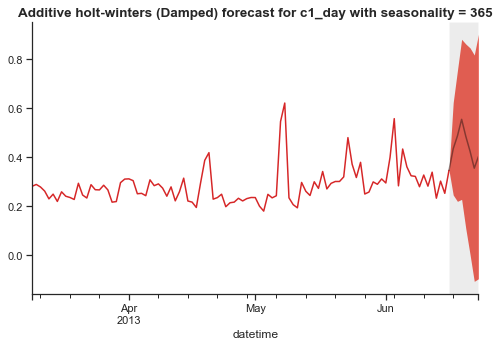

Additive holt-winters (Damped) forecast for c1_month with seasonality = 6:
2013-05    483.070638
Freq: M, dtype: float64
Probabilistic forecast for c1_month at 95% quantile:
                  0           1
2013-05  208.971806  757.169471


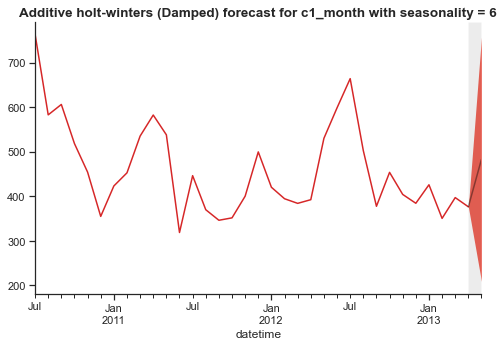

Additive holt-winters (Damped) forecast for c1_month with seasonality = 12:
2013-05    498.474847
Freq: M, dtype: float64
Probabilistic forecast for c1_month at 95% quantile:
                  0           1
2013-05  196.292628  800.657065


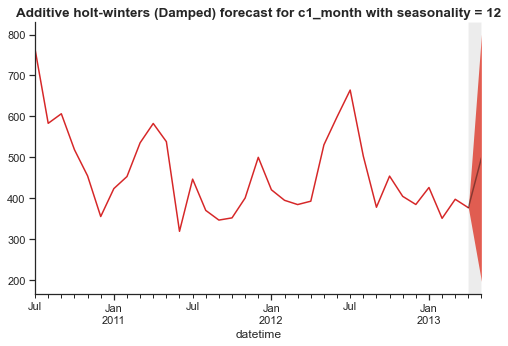

Additive holt-winters (Damped) forecast for c2 with seasonality = 48:
2013-06-29 00:00    0.417832
2013-06-29 00:30    0.359393
2013-06-29 01:00    0.338491
2013-06-29 01:30    0.341355
2013-06-29 02:00    0.344030
2013-06-29 02:30    0.365790
2013-06-29 03:00    0.355075
2013-06-29 03:30    0.359740
2013-06-29 04:00    0.369429
2013-06-29 04:30    0.375332
2013-06-29 05:00    0.386150
2013-06-29 05:30    0.396418
2013-06-29 06:00    0.391953
2013-06-29 06:30    0.400014
2013-06-29 07:00    0.625162
2013-06-29 07:30    0.558097
2013-06-29 08:00    0.504311
2013-06-29 08:30    0.473310
2013-06-29 09:00    0.461047
2013-06-29 09:30    0.461045
2013-06-29 10:00    0.489833
2013-06-29 10:30    0.556909
2013-06-29 11:00    0.559768
2013-06-29 11:30    0.540823
2013-06-29 12:00    0.513120
2013-06-29 12:30    0.457809
2013-06-29 13:00    0.445787
2013-06-29 13:30    0.445997
2013-06-29 14:00    0.443604
2013-06-29 14:30    0.426989
2013-06-29 15:00    0.395881
2013-06-29 15:30    0.415379
20

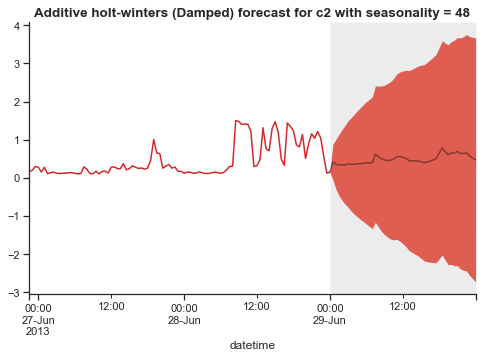

Additive holt-winters (Damped) forecast for c2 with seasonality = 17520:
2013-06-29 00:00   -0.108971
2013-06-29 00:30    0.024029
2013-06-29 01:00   -0.032971
2013-06-29 01:30   -0.172971
2013-06-29 02:00   -0.028971
2013-06-29 02:30   -0.176971
2013-06-29 03:00   -0.098971
2013-06-29 03:30   -0.101971
2013-06-29 04:00   -0.189971
2013-06-29 04:30   -0.148971
2013-06-29 05:00   -0.149971
2013-06-29 05:30   -0.192971
2013-06-29 06:00   -0.161971
2013-06-29 06:30   -0.150971
2013-06-29 07:00   -0.184971
2013-06-29 07:30   -0.198971
2013-06-29 08:00   -0.158971
2013-06-29 08:30   -0.138971
2013-06-29 09:00   -0.161971
2013-06-29 09:30   -0.159971
2013-06-29 10:00    0.053029
2013-06-29 10:30   -0.057971
2013-06-29 11:00   -0.164971
2013-06-29 11:30   -0.096971
2013-06-29 12:00   -0.097971
2013-06-29 12:30   -0.189971
2013-06-29 13:00    0.227029
2013-06-29 13:30   -0.049971
2013-06-29 14:00   -0.123971
2013-06-29 14:30   -0.116971
2013-06-29 15:00   -0.156971
2013-06-29 15:30    0.031029

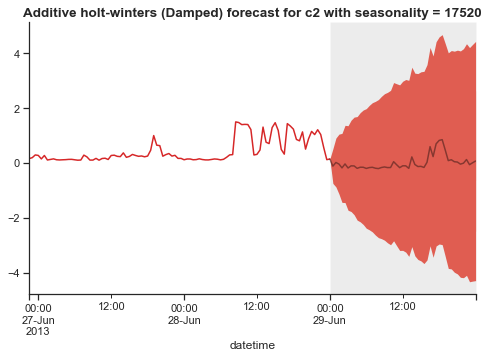

Additive holt-winters (Damped) forecast for c2_day with seasonality = 7:
2013-06-17    0.314656
2013-06-18    0.306265
2013-06-19    0.304585
2013-06-20    0.345627
2013-06-21    0.317876
2013-06-22    0.360037
2013-06-23    0.345567
Freq: D, dtype: float64
Probabilistic forecast for c2_day at 95% quantile:
                   0         1
2013-06-17  0.055404  0.573908
2013-06-18 -0.060372  0.672903
2013-06-19 -0.144453  0.753622
2013-06-20 -0.172876  0.864131
2013-06-21 -0.261829  0.897581
2013-06-22 -0.274998  0.995071
2013-06-23 -0.340349  1.031483


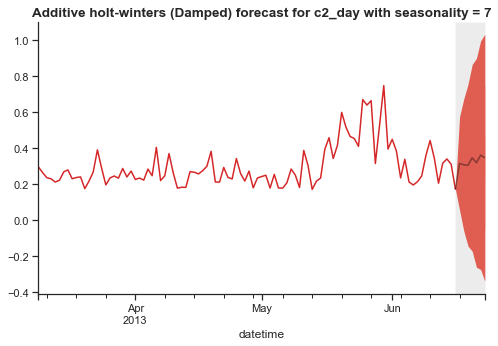

Additive holt-winters (Damped) forecast for c2_day with seasonality = 365:
2013-06-17    0.285690
2013-06-18    0.283982
2013-06-19    0.268336
2013-06-20    0.252003
2013-06-21    0.255399
2013-06-22    0.520628
2013-06-23    0.567857
Freq: D, dtype: float64
Probabilistic forecast for c2_day at 95% quantile:
                   0         1
2013-06-17 -0.046040  0.617420
2013-06-18 -0.185155  0.753119
2013-06-19 -0.306237  0.842910
2013-06-20 -0.411457  0.915463
2013-06-21 -0.486372  0.997170
2013-06-22 -0.291942  1.333197
2013-06-23 -0.309818  1.445532


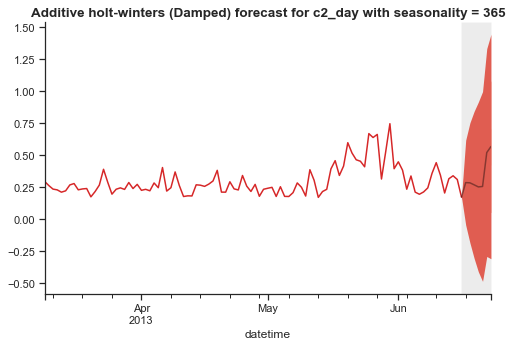

Additive holt-winters (Damped) forecast for c2_month with seasonality = 6:
2013-05    226.752183
Freq: M, dtype: float64
Probabilistic forecast for c2_month at 95% quantile:
                 0           1
2013-05 -84.963117  538.467482


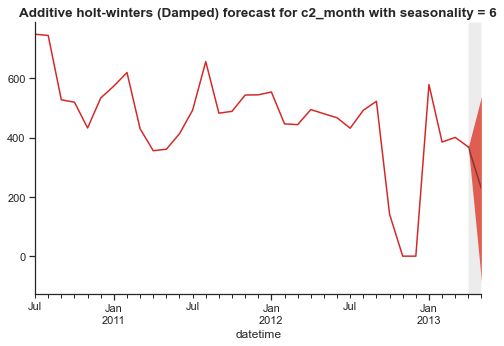

Additive holt-winters (Damped) forecast for c2_month with seasonality = 12:
2013-05    240.360114
Freq: M, dtype: float64
Probabilistic forecast for c2_month at 95% quantile:
                  0           1
2013-05 -154.459524  635.179753


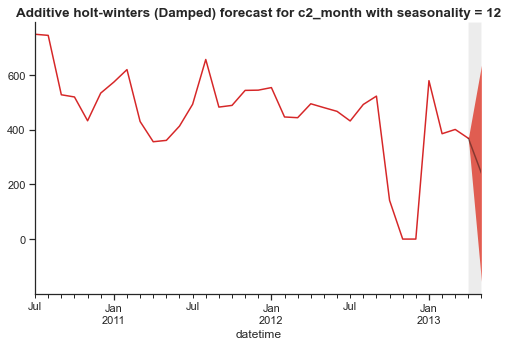

Additive holt-winters (Damped) forecast for c3 with seasonality = 48:
2013-06-29 00:00    0.093932
2013-06-29 00:30    0.055219
2013-06-29 01:00    0.017217
2013-06-29 01:30    0.031142
2013-06-29 02:00   -0.023827
2013-06-29 02:30   -0.044364
2013-06-29 03:00   -0.040153
2013-06-29 03:30   -0.030274
2013-06-29 04:00   -0.017578
2013-06-29 04:30    0.028107
2013-06-29 05:00    0.030418
2013-06-29 05:30    0.007615
2013-06-29 06:00    0.070618
2013-06-29 06:30    0.079907
2013-06-29 07:00    0.109760
2013-06-29 07:30    0.010305
2013-06-29 08:00    0.092809
2013-06-29 08:30    0.082651
2013-06-29 09:00    0.083254
2013-06-29 09:30    0.099667
2013-06-29 10:00    0.087098
2013-06-29 10:30    0.082884
2013-06-29 11:00    0.096137
2013-06-29 11:30    0.107236
2013-06-29 12:00    0.097785
2013-06-29 12:30    0.118775
2013-06-29 13:00    0.111547
2013-06-29 13:30    0.106825
2013-06-29 14:00    0.091081
2013-06-29 14:30    0.053309
2013-06-29 15:00    0.088870
2013-06-29 15:30    0.098590
20

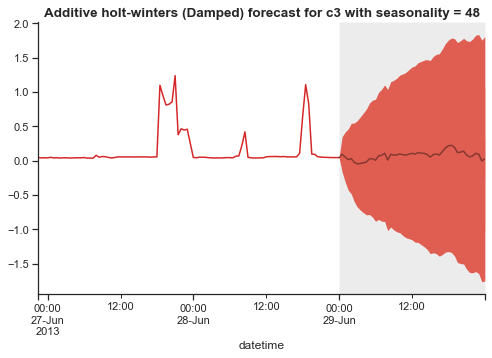

Additive holt-winters (Damped) forecast for c3 with seasonality = 17520:
2013-06-29 00:00   -0.244014
2013-06-29 00:30   -0.210014
2013-06-29 01:00   -0.290014
2013-06-29 01:30   -0.293014
2013-06-29 02:00   -0.295014
2013-06-29 02:30   -0.244014
2013-06-29 03:00   -0.286014
2013-06-29 03:30   -0.259014
2013-06-29 04:00   -0.298014
2013-06-29 04:30   -0.298014
2013-06-29 05:00   -0.300014
2013-06-29 05:30   -0.290014
2013-06-29 06:00   -0.289014
2013-06-29 06:30   -0.290014
2013-06-29 07:00   -0.302014
2013-06-29 07:30   -0.307014
2013-06-29 08:00   -0.308014
2013-06-29 08:30   -0.294014
2013-06-29 09:00   -0.298014
2013-06-29 09:30   -0.276014
2013-06-29 10:00   -0.283014
2013-06-29 10:30   -0.287014
2013-06-29 11:00   -0.305014
2013-06-29 11:30   -0.300014
2013-06-29 12:00   -0.235014
2013-06-29 12:30   -0.235014
2013-06-29 13:00   -0.152014
2013-06-29 13:30   -0.235014
2013-06-29 14:00   -0.205014
2013-06-29 14:30   -0.250014
2013-06-29 15:00    0.213986
2013-06-29 15:30    0.202986

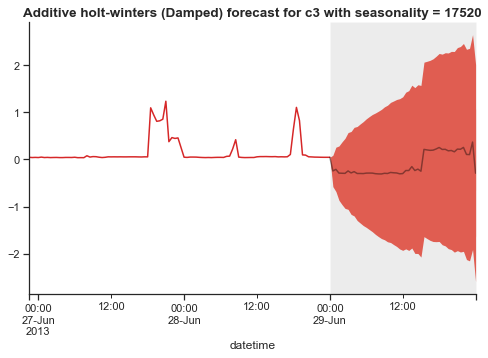

Additive holt-winters (Damped) forecast for c3_day with seasonality = 7:
2013-06-17    0.144367
2013-06-18    0.147773
2013-06-19    0.150286
2013-06-20    0.176893
2013-06-21    0.133074
2013-06-22    0.162594
2013-06-23    0.162953
Freq: D, dtype: float64
Probabilistic forecast for c3_day at 95% quantile:
                   0         1
2013-06-17 -0.017811  0.306545
2013-06-18 -0.081581  0.377127
2013-06-19 -0.130614  0.431187
2013-06-20 -0.147463  0.501249
2013-06-21 -0.229567  0.495715
2013-06-22 -0.234659  0.559847
2013-06-23 -0.266129  0.592036


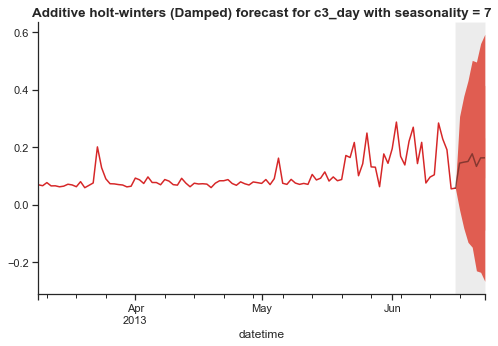

Additive holt-winters (Damped) forecast for c3_day with seasonality = 365:
2013-06-17    0.141638
2013-06-18    0.169700
2013-06-19    0.134971
2013-06-20    0.154846
2013-06-21    0.442763
2013-06-22    0.249804
2013-06-23    0.107304
Freq: D, dtype: float64
Probabilistic forecast for c3_day at 95% quantile:
                   0         1
2013-06-17 -0.058331  0.341607
2013-06-18 -0.113099  0.452499
2013-06-19 -0.211385  0.481327
2013-06-20 -0.245092  0.554784
2013-06-21 -0.004381  0.889907
2013-06-22 -0.240017  0.739626
2013-06-23 -0.421764  0.636372


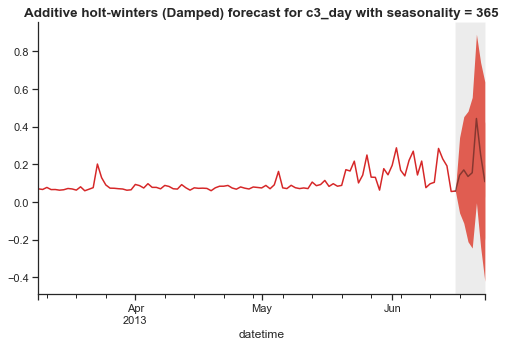

Additive holt-winters (Damped) forecast for c3_month with seasonality = 6:
2013-05   -3.245
Freq: M, dtype: float64
Probabilistic forecast for c3_month at 95% quantile:
                  0           1
2013-05 -235.705796  229.215796


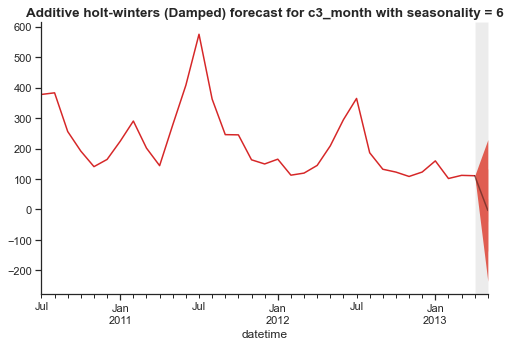

Additive holt-winters (Damped) forecast for c3_month with seasonality = 12:
2013-05    206.054821
Freq: M, dtype: float64
Probabilistic forecast for c3_month at 95% quantile:
                 0           1
2013-05  50.730817  361.378825


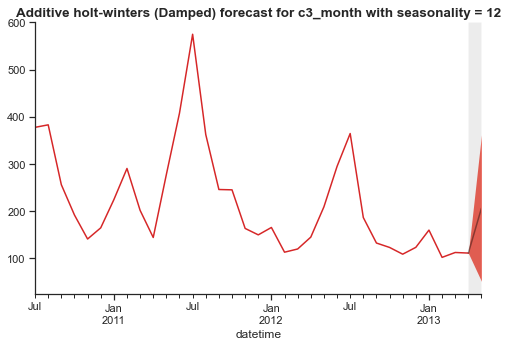

Additive holt-winters (Damped) forecast for c4 with seasonality = 48:
2013-06-29 00:00    0.041365
2013-06-29 00:30    0.062567
2013-06-29 01:00    0.123805
2013-06-29 01:30    0.224510
2013-06-29 02:00    0.318028
2013-06-29 02:30    0.396057
2013-06-29 03:00    0.456886
2013-06-29 03:30    0.497775
2013-06-29 04:00    0.529054
2013-06-29 04:30    0.495781
2013-06-29 05:00    0.490596
2013-06-29 05:30    0.493949
2013-06-29 06:00    0.699589
2013-06-29 06:30    0.730659
2013-06-29 07:00    0.565219
2013-06-29 07:30    0.592146
2013-06-29 08:00    0.671296
2013-06-29 08:30    0.627520
2013-06-29 09:00    0.525406
2013-06-29 09:30    0.420451
2013-06-29 10:00    0.235601
2013-06-29 10:30    0.264570
2013-06-29 11:00    0.345319
2013-06-29 11:30    0.373783
2013-06-29 12:00    0.414376
2013-06-29 12:30    0.437093
2013-06-29 13:00    0.448352
2013-06-29 13:30    0.429315
2013-06-29 14:00    0.440047
2013-06-29 14:30    0.429979
2013-06-29 15:00    0.394089
2013-06-29 15:30    0.412174
20

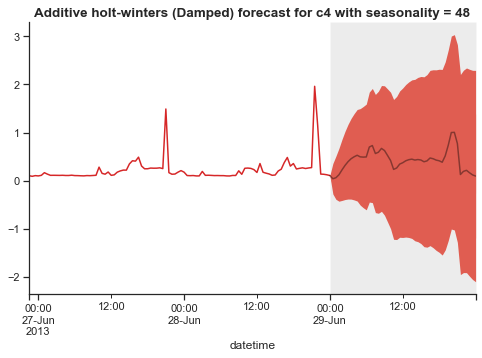

Additive holt-winters (Damped) forecast for c4 with seasonality = 17520:
2013-06-29 00:00    0.285912
2013-06-29 00:30    0.275912
2013-06-29 01:00    0.280912
2013-06-29 01:30    0.273912
2013-06-29 02:00    0.279912
2013-06-29 02:30    0.284912
2013-06-29 03:00    0.386912
2013-06-29 03:30    0.339912
2013-06-29 04:00    0.305912
2013-06-29 04:30    0.295912
2013-06-29 05:00    0.291912
2013-06-29 05:30    0.288912
2013-06-29 06:00    0.294912
2013-06-29 06:30    0.290912
2013-06-29 07:00    0.284912
2013-06-29 07:30    0.278912
2013-06-29 08:00    0.402912
2013-06-29 08:30    0.402912
2013-06-29 09:00    0.344912
2013-06-29 09:30    0.307912
2013-06-29 10:00    0.289912
2013-06-29 10:30    0.292912
2013-06-29 11:00    0.300912
2013-06-29 11:30    0.288912
2013-06-29 12:00    0.286912
2013-06-29 12:30    0.285912
2013-06-29 13:00    0.314912
2013-06-29 13:30    0.390912
2013-06-29 14:00    0.415912
2013-06-29 14:30    0.437912
2013-06-29 15:00    0.496912
2013-06-29 15:30    0.456912

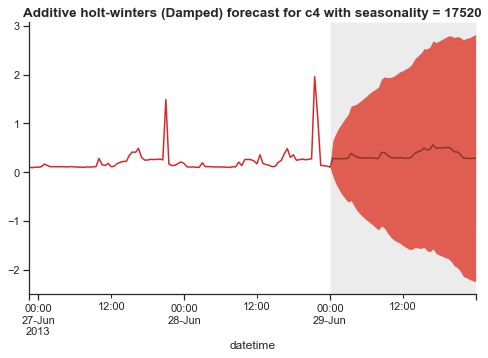

Additive holt-winters (Damped) forecast for c4_day with seasonality = 7:
2013-06-17    0.268421
2013-06-18    0.185917
2013-06-19    0.220135
2013-06-20    0.192229
2013-06-21    0.273785
2013-06-22    0.301785
2013-06-23    0.272602
Freq: D, dtype: float64
Probabilistic forecast for c4_day at 95% quantile:
                   0         1
2013-06-17  0.094307  0.442534
2013-06-18 -0.060316  0.432150
2013-06-19 -0.081438  0.521708
2013-06-20 -0.155997  0.540455
2013-06-21 -0.115544  0.663114
2013-06-22 -0.124703  0.728274
2013-06-23 -0.188059  0.733262


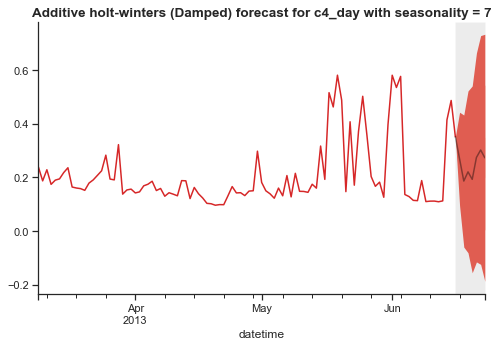

Additive holt-winters (Damped) forecast for c4_day with seasonality = 365:
2013-06-17    0.255768
2013-06-18    0.248560
2013-06-19    0.227873
2013-06-20    0.251518
2013-06-21    0.253810
2013-06-22    0.240518
2013-06-23    0.236581
Freq: D, dtype: float64
Probabilistic forecast for c4_day at 95% quantile:
                   0         1
2013-06-17  0.041651  0.469886
2013-06-18 -0.054248  0.551368
2013-06-19 -0.142990  0.598735
2013-06-20 -0.176717  0.679754
2013-06-21 -0.224972  0.732592
2013-06-22 -0.283961  0.764997
2013-06-23 -0.329921  0.803083


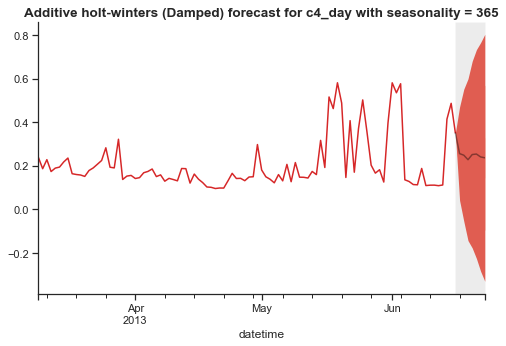

Additive holt-winters (Damped) forecast for c4_month with seasonality = 6:
2013-05    298.391368
Freq: M, dtype: float64
Probabilistic forecast for c4_month at 95% quantile:
                  0           1
2013-05  184.058538  412.724198


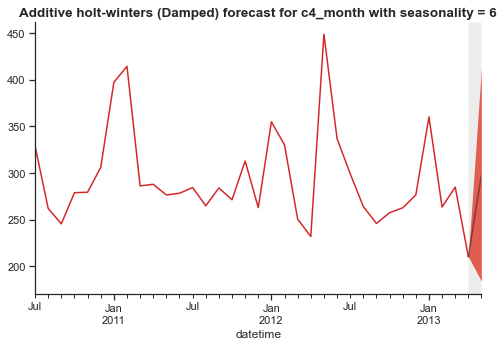

Additive holt-winters (Damped) forecast for c4_month with seasonality = 12:
2013-05    276.449
Freq: M, dtype: float64
Probabilistic forecast for c4_month at 95% quantile:
                  0           1
2013-05  160.141207  392.756793


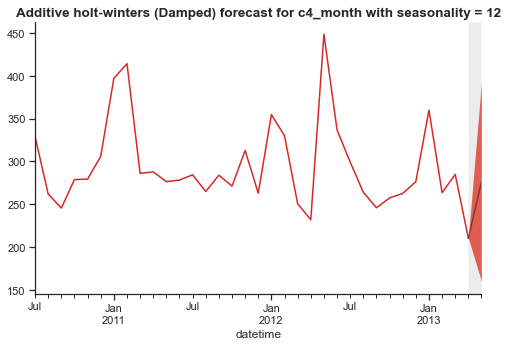

In [44]:
ahw_damped_preds = {}
for name, ahw_damped_dict in ahw_damped_fitting.items():
    validation_set = validation_sets[name]  
    frequency = train_sets[name].index.freq 
    train_set = train_sets[name]
    ahw_damped_preds[name] = {}
    
    for m, ahw_damped in ahw_damped_dict.items():
        h = len(validation_set)
        test = pd.period_range(start=validation_set.index[0], periods=h, freq=frequency)
        ahw_damped_pred = pd.Series(ahw_damped.forecast(h), index=test)
        ahw_damped_preds[name][m] = ahw_damped_pred
    
        intv_ahw_damped = pd.DataFrame(ahw_damped.intervalforecast(h, level=.95), index=test)
        intv1 = pd.DataFrame(ahw_damped.intervalforecast(h, level=.75), index=test)
        intv2 = pd.DataFrame(ahw_damped.intervalforecast(h, level=.25), index=test)

        fig, ax = forecast.fanchart(train_set[-100:], ahw_damped_pred, intv_ahw_damped, intv1, intv2)
        plt.title(f'Additive holt-winters (Damped) forecast for {name} with seasonality = {m}', fontsize=13.5, fontweight='bold')
        print(f'Additive holt-winters (Damped) forecast for {name} with seasonality = {m}:')
        print(ahw_damped_pred)
        print(f'Probabilistic forecast for {name} at 95% quantile:')
        print(intv_ahw_damped)
        sns.despine()
        plt.show()

<span style="color: green; font-size: 16px; font-weight: bold;">MAE calculation.</span>  

same method to select best m value is used

In [45]:
mae_ahw_damped = {}

for name, ahw_damped_pred in ahw_damped_preds.items():
    mae_dict = {}
    validation_set = validation_sets[name]
    
    for m_value, pred in ahw_damped_pred.items(): 
        mae = np.abs(validation_set - pred).mean()
        mae_dict[m_value] = {'MAE': mae}  

    
    if mae_dict:
        best_m = min(mae_dict, key=lambda x: mae_dict[x]['MAE'])
        best_mae = round(mae_dict[best_m]['MAE'], 3)  # Access the 'MAE' value correctly
        mae_ahw_damped[name] = {'best_m': best_m, 'MAE': best_mae}

for name, values in mae_ahw_damped.items():
    best_m = values['best_m']
    best_mae = values['MAE']
    print(f"{name}: m = {best_m}, MAE = {best_mae}")

c1: m = 48, MAE = 0.25
c1_day: m = 7, MAE = 0.068
c1_month: m = 6, MAE = 36.219
c2: m = 48, MAE = 0.301
c2_day: m = 7, MAE = 0.059
c2_month: m = 12, MAE = 311.79
c3: m = 48, MAE = 0.12
c3_day: m = 365, MAE = 0.106
c3_month: m = 12, MAE = 40.837
c4: m = 17520, MAE = 0.231
c4_day: m = 7, MAE = 0.123
c4_month: m = 6, MAE = 75.132


<span style="color: red; font-size: 18px; font-weight: bold;">B.5.Multiplicative Holt-winter.</span>

- This process is prone to ZeroDivisionError due to the choice of seasonal window (m_value). Therefore, I will choose to skip all model the contain an inapprpriate m that  cause the above error.

In [46]:
mhw_fitting = {}

for name, train_set in train_sets.items():
    m_values_name = m_values.get(name, [])
    for m in m_values_name:
        try: # this step is to spot the error and handle it
            mhw = forecast.holtwinters(train_set, additive=False, damped=False, m=m)
            mhw.fit()
            print(f'Multiplicative Holt-Winters fitting for {name} with seasonality = {m}')
            mhw.summary()
            mhw_fitting.setdefault(name, {})[m] = mhw
        except ZeroDivisionError:
            print(f'Skip time series {name} with seasonality = {m} due to Zero Division Error')


Multiplicative Holt-Winters fitting for c1 with seasonality = 48
 Multiplicative Holt-winters exponential smoothing

 Smoothing parameters:
 alpha (level)    0.100 (0.004)
 beta  (trend)    0.100 (0.004)
 delta (seasonal) 0.050 (0.004)
 
 In-sample fit:
 MSE               1592.651
 RMSE              39.908
 Log-likelihood   -268100.857
 AIC               536209.714
 BIC               536245.190
Skip time series c1 with seasonality = 17520 due to Zero Division Error
Multiplicative Holt-Winters fitting for c1_day with seasonality = 7
 Multiplicative Holt-winters exponential smoothing

 Smoothing parameters:
 alpha (level)    0.240 (0.039)
 beta  (trend)    0.000 (0.018)
 delta (seasonal) 0.083 (0.015)
 
 In-sample fit:
 MSE               0.006
 RMSE              0.076
 Log-likelihood    1258.634
 AIC               -2509.267
 BIC               -2489.321
Multiplicative Holt-Winters fitting for c1_day with seasonality = 365
 Multiplicative Holt-winters exponential smoothing

 Smoothing para

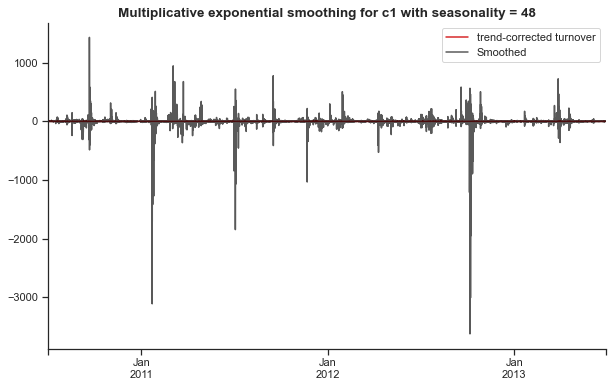

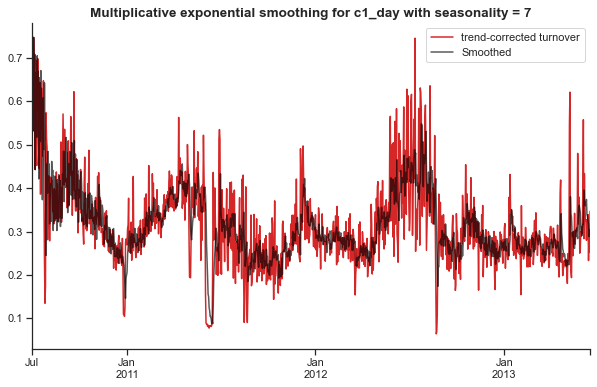

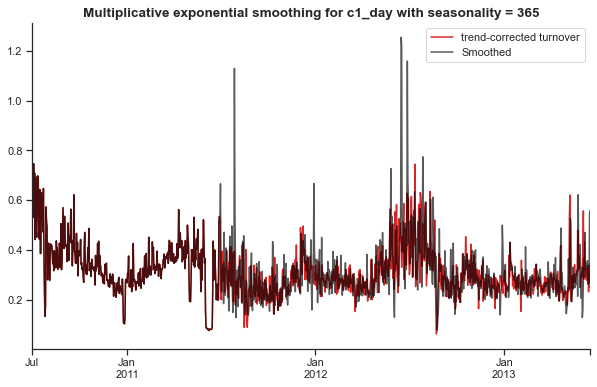

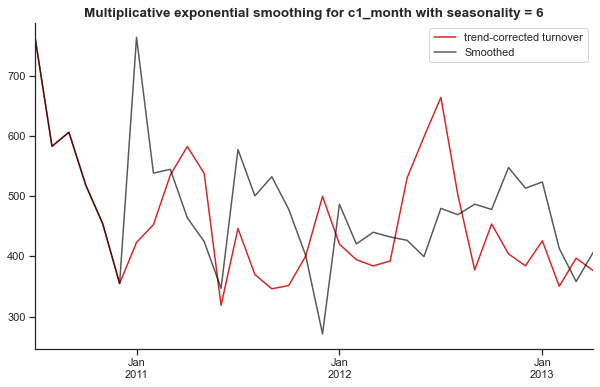

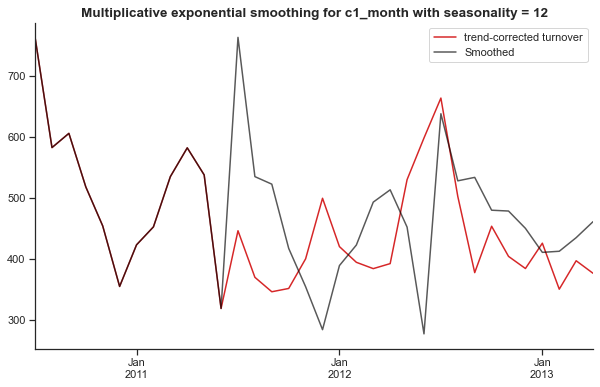

...

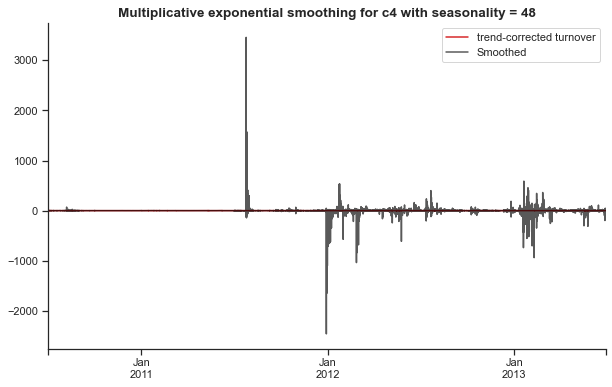

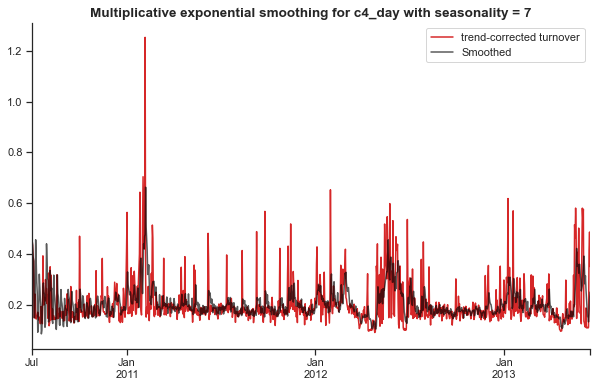

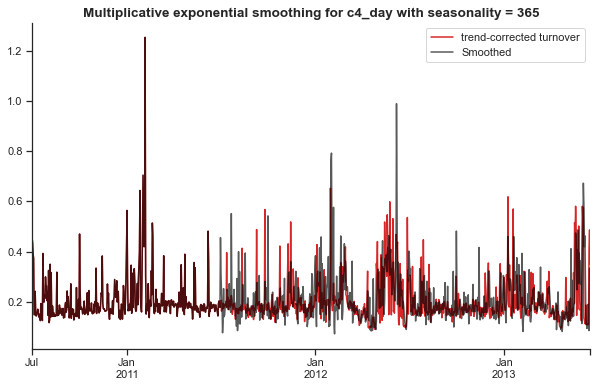

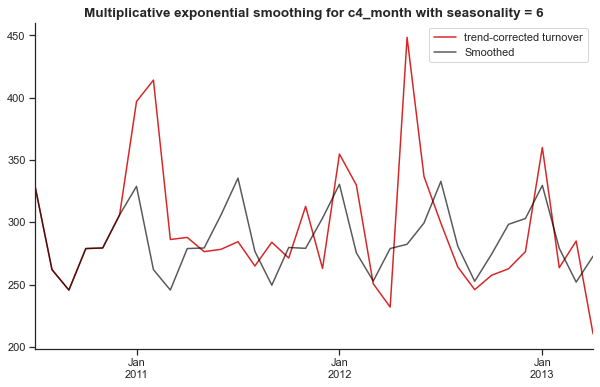

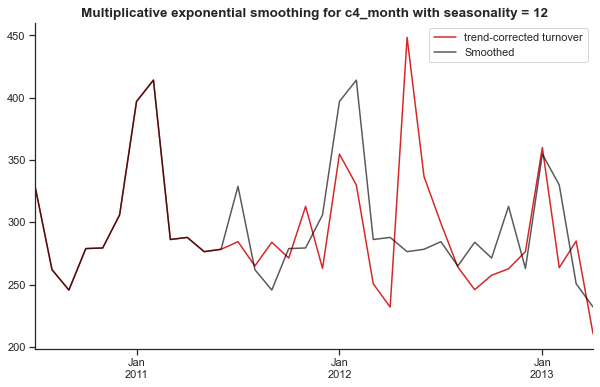

In [47]:
for name, mhw_dict in mhw_fitting.items():
    for m, mhw in mhw_dict.items():
        train_set = train_sets[name]
        smoothed = pd.Series(mhw.smooth(), index=train_set.index)
        
        fig, ax = plt.subplots(figsize=(10, 6))
        train_set.plot(color='#D62728', label='trend-corrected turnover')
        smoothed.plot(color='black', label='Smoothed', alpha=0.65)
        plt.legend(loc='best')
        ax.set_xlabel('')
        ax.set_xticks([], minor=True)
        ax.set_title(f'Multiplicative exponential smoothing for {name} with seasonality = {m}', fontsize=13.5, fontweight='bold')
    
        sns.despine()
        plt.show()


Multiplicative Holt-Winters forecast for c1 with seasonality = 48:
2013-06-29 00:00    0.202671
2013-06-29 00:30    0.195929
2013-06-29 01:00    0.128836
2013-06-29 01:30   -0.072815
2013-06-29 02:00    0.106470
2013-06-29 02:30    0.028963
2013-06-29 03:00   -0.018806
2013-06-29 03:30   -0.120811
2013-06-29 04:00    0.064708
2013-06-29 04:30   -0.127994
2013-06-29 05:00    0.311033
2013-06-29 05:30   -0.594605
2013-06-29 06:00   -0.676182
2013-06-29 06:30   -0.067529
2013-06-29 07:00   -0.452108
2013-06-29 07:30    0.269978
2013-06-29 08:00   -0.004028
2013-06-29 08:30   -1.098566
2013-06-29 09:00    0.008268
2013-06-29 09:30   -0.345662
2013-06-29 10:00   -0.643374
2013-06-29 10:30   -0.848415
2013-06-29 11:00   -1.124032
2013-06-29 11:30   -1.088262
2013-06-29 12:00   -0.598515
2013-06-29 12:30   -0.133642
2013-06-29 13:00   -0.557753
2013-06-29 13:30   -0.231103
2013-06-29 14:00   -1.136057
2013-06-29 14:30   -0.416351
2013-06-29 15:00   -0.486580
2013-06-29 15:30   -1.208106
2013-

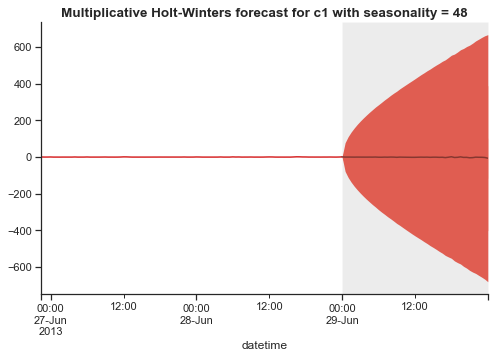

Multiplicative Holt-Winters forecast for c1_day with seasonality = 7:
2013-06-17    0.298439
2013-06-18    0.296967
2013-06-19    0.299572
2013-06-20    0.288586
2013-06-21    0.281029
2013-06-22    0.288731
2013-06-23    0.304123
Freq: D, dtype: float64
Probabilistic forecast for c1_day at 95% quantile:
                   0         1
2013-06-17  0.150249  0.446629
2013-06-18  0.087394  0.506539
2013-06-19  0.042899  0.556245
2013-06-20 -0.007795  0.584966
2013-06-21 -0.050334  0.612392
2013-06-22 -0.074259  0.651721
2013-06-23 -0.087951  0.696197


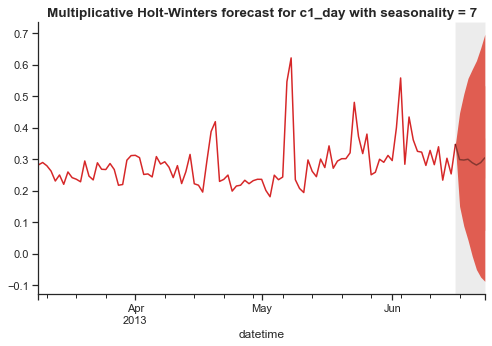

Multiplicative Holt-Winters forecast for c1_day with seasonality = 365:
2013-06-17    0.589138
2013-06-18    0.698598
2013-06-19    0.841320
2013-06-20    0.694528
2013-06-21    0.568131
2013-06-22    0.423002
2013-06-23    0.523095
Freq: D, dtype: float64
Probabilistic forecast for c1_day at 95% quantile:
                   0         1
2013-06-17  0.366180  0.812097
2013-06-18  0.383287  1.013909
2013-06-19  0.455144  1.227496
2013-06-20  0.248610  1.140445
2013-06-21  0.069580  1.066682
2013-06-22 -0.123134  0.969137
2013-06-23 -0.066798  1.112989


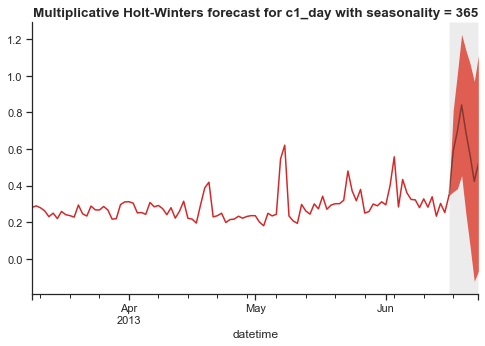

Multiplicative Holt-Winters forecast for c1_month with seasonality = 6:
2013-05    480.685605
Freq: M, dtype: float64
Probabilistic forecast for c1_month at 95% quantile:
                  0           1
2013-05  217.990868  743.380341


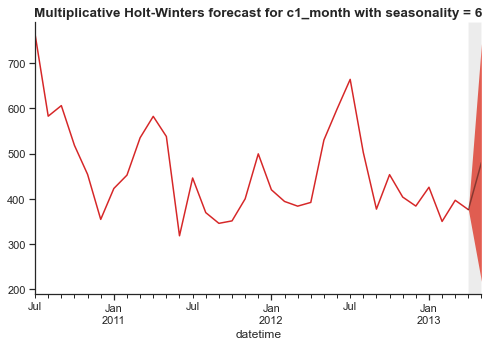

Multiplicative Holt-Winters forecast for c1_month with seasonality = 12:
2013-05    483.423997
Freq: M, dtype: float64
Probabilistic forecast for c1_month at 95% quantile:
                  0           1
2013-05  199.275888  767.572107


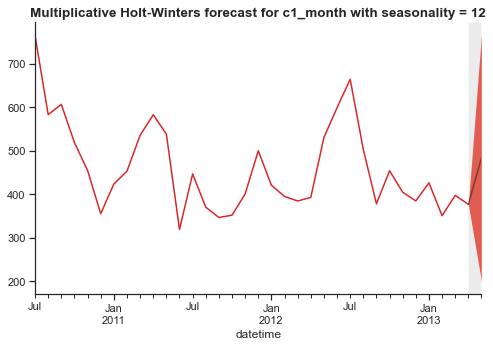

Multiplicative Holt-Winters forecast for c2_day with seasonality = 7:
2013-06-17    0.302775
2013-06-18    0.311694
2013-06-19    0.305637
2013-06-20    0.337882
2013-06-21    0.325895
2013-06-22    0.361904
2013-06-23    0.339731
Freq: D, dtype: float64
Probabilistic forecast for c2_day at 95% quantile:
                   0         1
2013-06-17  0.044914  0.560636
2013-06-18 -0.052976  0.676364
2013-06-19 -0.140991  0.752264
2013-06-20 -0.177839  0.853604
2013-06-21 -0.250698  0.902489
2013-06-22 -0.269723  0.993531
2013-06-23 -0.342504  1.021966


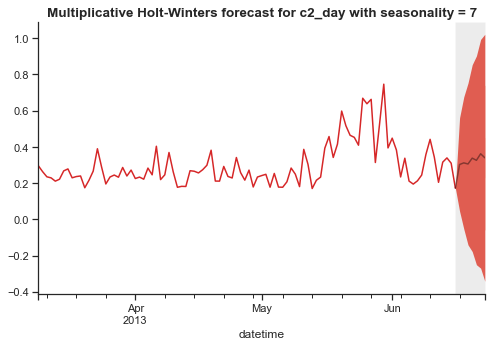

Multiplicative Holt-Winters forecast for c2_day with seasonality = 365:
2013-06-17    0.318920
2013-06-18    0.316769
2013-06-19    0.297064
2013-06-20    0.276494
2013-06-21    0.280770
2013-06-22    0.614804
2013-06-23    0.674285
Freq: D, dtype: float64
Probabilistic forecast for c2_day at 95% quantile:
                   0         1
2013-06-17 -0.026327  0.664167
2013-06-18 -0.171485  0.805022
2013-06-19 -0.300922  0.895050
2013-06-20 -0.414001  0.966988
2013-06-21 -0.491226  1.052767
2013-06-22 -0.230876  1.460483
2013-06-23 -0.239154  1.587723


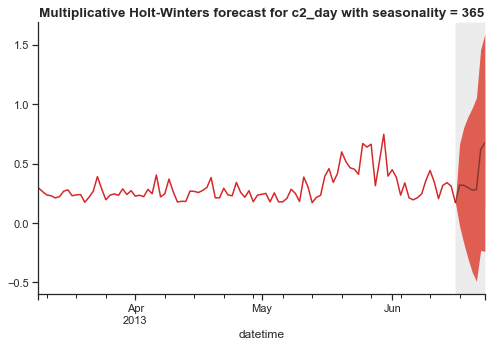

Multiplicative Holt-Winters forecast for c2_month with seasonality = 6:
2013-05    239.270606
Freq: M, dtype: float64
Probabilistic forecast for c2_month at 95% quantile:
                 0           1
2013-05 -63.787604  542.328816


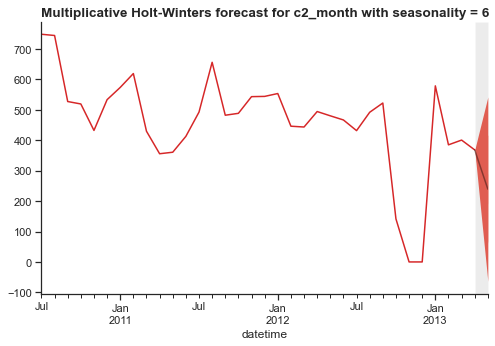

Multiplicative Holt-Winters forecast for c2_month with seasonality = 12:
2013-05    278.625619
Freq: M, dtype: float64
Probabilistic forecast for c2_month at 95% quantile:
                  0           1
2013-05 -119.089884  676.341123


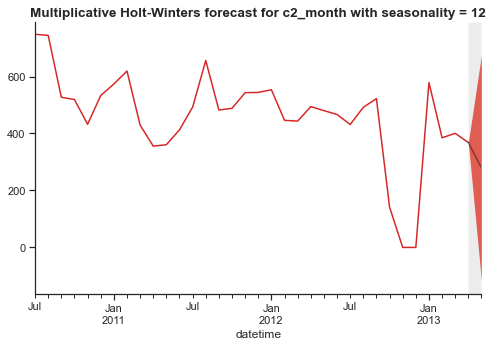

Multiplicative Holt-Winters forecast for c3_day with seasonality = 7:
2013-06-17    0.149892
2013-06-18    0.152413
2013-06-19    0.144962
2013-06-20    0.161488
2013-06-21    0.138928
2013-06-22    0.161641
2013-06-23    0.155764
Freq: D, dtype: float64
Probabilistic forecast for c3_day at 95% quantile:
                   0         1
2013-06-17 -0.013030  0.312814
2013-06-18 -0.077993  0.382819
2013-06-19 -0.137227  0.427150
2013-06-20 -0.164356  0.487331
2013-06-21 -0.225376  0.503232
2013-06-22 -0.237434  0.560716
2013-06-23 -0.275286  0.586814


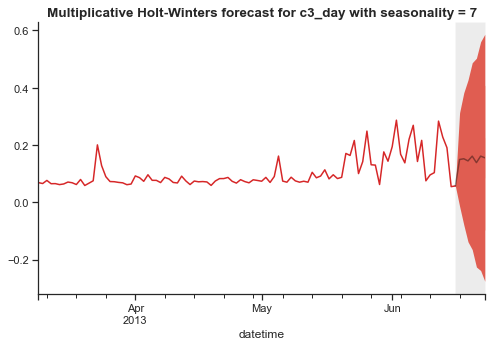

Multiplicative Holt-Winters forecast for c3_day with seasonality = 365:
2013-06-17    0.241332
2013-06-18    0.266152
2013-06-19    0.235435
2013-06-20    0.253014
2013-06-21    0.507668
2013-06-22    0.337002
2013-06-23    0.210965
Freq: D, dtype: float64
Probabilistic forecast for c3_day at 95% quantile:
                   0         1
2013-06-17 -0.003754  0.486417
2013-06-18 -0.080452  0.612756
2013-06-19 -0.189066  0.659936
2013-06-20 -0.237158  0.743186
2013-06-21 -0.040360  1.055697
2013-06-22 -0.263333  0.937337
2013-06-23 -0.437471  0.859401


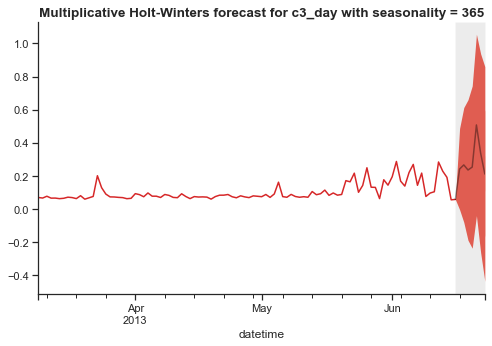

Multiplicative Holt-Winters forecast for c3_month with seasonality = 6:
2013-05    121.936513
Freq: M, dtype: float64
Probabilistic forecast for c3_month at 95% quantile:
                 0           1
2013-05 -95.302562  339.175588


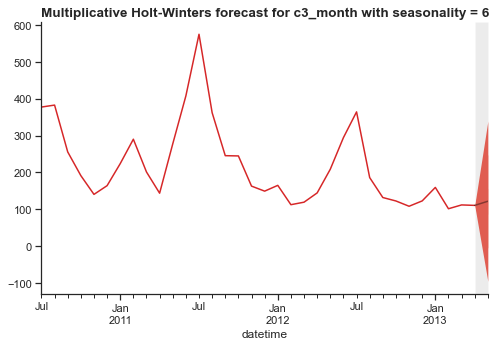

Multiplicative Holt-Winters forecast for c3_month with seasonality = 12:
2013-05    192.393664
Freq: M, dtype: float64
Probabilistic forecast for c3_month at 95% quantile:
                0           1
2013-05  53.57657  331.210759


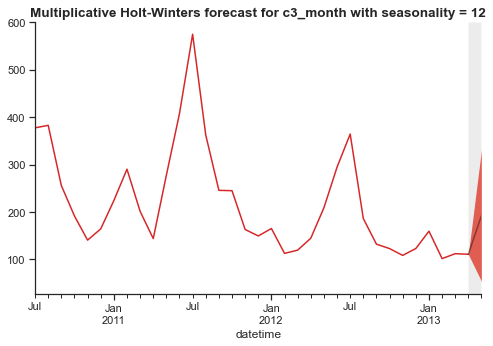

Multiplicative Holt-Winters forecast for c4 with seasonality = 48:
2013-06-29 00:00   -51.250701
2013-06-29 00:30     2.673594
2013-06-29 01:00    -0.660806
2013-06-29 01:30    -0.340510
2013-06-29 02:00    -1.558623
2013-06-29 02:30    -0.717064
2013-06-29 03:00    -0.647783
2013-06-29 03:30    -0.899331
2013-06-29 04:00    10.663745
2013-06-29 04:30    -1.085837
2013-06-29 05:00     2.022111
2013-06-29 05:30    -0.763330
2013-06-29 06:00    -1.711407
2013-06-29 06:30    -2.091091
2013-06-29 07:00    -0.541196
2013-06-29 07:30    -1.281297
2013-06-29 08:00     0.524848
2013-06-29 08:30   -12.556903
2013-06-29 09:00     0.136122
2013-06-29 09:30     0.287879
2013-06-29 10:00    -1.188718
2013-06-29 10:30     0.010915
2013-06-29 11:00    -0.242206
2013-06-29 11:30    -0.231352
2013-06-29 12:00     0.296013
2013-06-29 12:30    -0.240753
2013-06-29 13:00    -0.038325
2013-06-29 13:30     0.004558
2013-06-29 14:00     0.040473
2013-06-29 14:30    -0.010354
2013-06-29 15:00    -0.000839
201

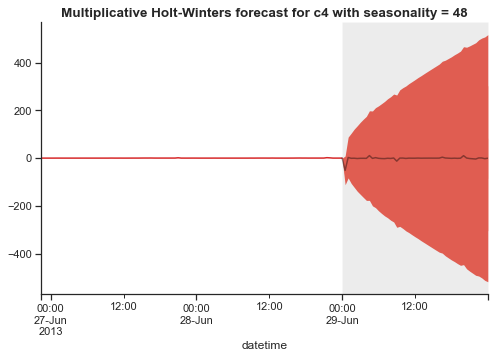

Multiplicative Holt-Winters forecast for c4_day with seasonality = 7:
2013-06-17    0.253008
2013-06-18    0.220040
2013-06-19    0.233628
2013-06-20    0.215095
2013-06-21    0.273892
2013-06-22    0.277000
2013-06-23    0.250226
Freq: D, dtype: float64
Probabilistic forecast for c4_day at 95% quantile:
                   0         1
2013-06-17  0.081475  0.424540
2013-06-18 -0.022543  0.462624
2013-06-19 -0.063475  0.530731
2013-06-20 -0.127970  0.558160
2013-06-21 -0.109666  0.657451
2013-06-22 -0.143168  0.697167
2013-06-23 -0.203607  0.704058


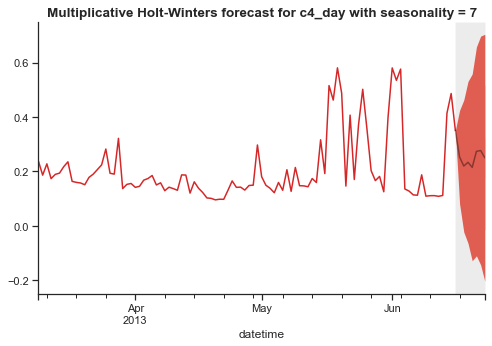

Multiplicative Holt-Winters forecast for c4_day with seasonality = 365:
2013-06-17    0.390873
2013-06-18    0.376036
2013-06-19    0.333453
2013-06-20    0.382125
2013-06-21    0.386842
2013-06-22    0.359483
2013-06-23    0.351378
Freq: D, dtype: float64
Probabilistic forecast for c4_day at 95% quantile:
                   0         1
2013-06-17  0.185221  0.596524
2013-06-18  0.085201  0.666870
2013-06-19 -0.022745  0.689652
2013-06-20 -0.029178  0.793428
2013-06-21 -0.073009  0.846692
2013-06-22 -0.144258  0.863224
2013-06-23 -0.192724  0.895481


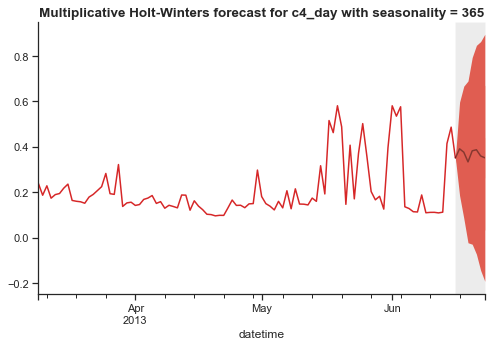

Multiplicative Holt-Winters forecast for c4_month with seasonality = 6:
2013-05    298.388786
Freq: M, dtype: float64
Probabilistic forecast for c4_month at 95% quantile:
                  0           1
2013-05  186.365949  410.411624


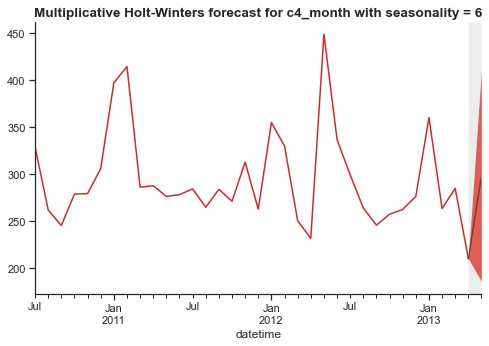

Multiplicative Holt-Winters forecast for c4_month with seasonality = 12:
2013-05    276.449
Freq: M, dtype: float64
Probabilistic forecast for c4_month at 95% quantile:
                  0           1
2013-05  163.243307  389.654693


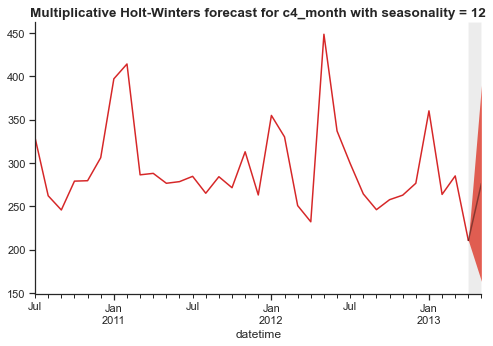

In [48]:
forecast_val = {}

for name, models in mhw_fitting.items():
    validation_set = validation_sets[name]  
    frequency = train_sets[name].index.freq  
    train_set = train_sets[name]
    forecast_val[name] = {}
    
    for m, mhw_model in models.items():
        if len(validation_set) > m:
            continue  # Skip values of m that are greater than or equal to the length of the validation set
        
        h = len(validation_set)
        test = pd.period_range(start=validation_set.index[0], periods=h, freq=frequency)
        
    
        mhw_pred = pd.Series(mhw_model.forecast(h), index=test)
        forecast_val[name][m] = mhw_pred

        intv_mhw = pd.DataFrame(mhw_model.intervalforecast(h, level=0.95), index=test)
        intv1 = pd.DataFrame(mhw_model.intervalforecast(h, level=0.75), index=test)
        intv2 = pd.DataFrame(mhw_model.intervalforecast(h, level=0.25), index=test)


        fig, ax = forecast.fanchart(train_set[-100:], mhw_pred, intv_mhw, intv1, intv2)
        plt.title(f'Multiplicative Holt-Winters forecast for {name} with seasonality = {m}', fontsize=13.5, fontweight='bold')

        print(f'Multiplicative Holt-Winters forecast for {name} with seasonality = {m}:')
        print(mhw_pred)
        print(f'Probabilistic forecast for {name} at 95% quantile:')
        print(intv_mhw)

        sns.despine()
        plt.show()




<span style="color: green; font-size: 16px; font-weight: bold;">MAE calculation.</span>  

In [49]:
mae_mhw = {}

for name, m_val in forecast_val.items():
    mae_dict = {}
    validation_set = validation_sets[name]
    
    for m, mhw_pred in m_val.items():
        mae = np.abs(validation_set - mhw_pred).mean()
        mae_dict[m] = {'MAE': mae}  # Update the structure of mae_dict

    if mae_dict:
        best_m = min(mae_dict, key=lambda x: mae_dict[x]['MAE'])
        best_mae = round(mae_dict[best_m]['MAE'], 3)  # Access the 'MAE' value correctly
        mae_mhw[name] = {'best_m': best_m, 'MAE': best_mae}

for name, values in mae_mhw.items():
    best_m = values['best_m']
    best_mae = values['MAE']
    print(f"{name}: m = {best_m}, MAE = {best_mae}")

c1: m = 48, MAE = 1.083
c1_day: m = 7, MAE = 0.071
c1_month: m = 6, MAE = 33.834
c2_day: m = 7, MAE = 0.058
c2_month: m = 12, MAE = 273.524
c3_day: m = 7, MAE = 0.125
c3_month: m = 12, MAE = 27.176
c4: m = 48, MAE = 2.72
c4_day: m = 365, MAE = 0.083
c4_month: m = 6, MAE = 75.134


<span style="color: red; font-size: 18px; font-weight: bold;">B.6.Multiplicative Damped Holt-winter.</span>

Similar to Multiplicative Holt-Winters, this model also prone to ZeroDivisionError. Therefore, I will choose to handle it in the same way

In [50]:
mhw_damped_sets = {}

for name, train_set in train_sets.items():
    m_values_name = m_values.get(name, [])
    for m in m_values_name:    
        try:
            mhw_damped = forecast.holtwinters(train_set, additive=False, damped=True, m=m)
            mhw_damped.fit()
            print(f'Multiplicative Holt-Winters (Damped) fitting for {name} with seasonality = {m}')
            mhw_damped.summary()
            mhw_damped_sets.setdefault(name, {})[m] = mhw_damped
        except ZeroDivisionError:
            print(f'Skipping time series{name} with seasonality = {m} due to ZeroDivisionError')

Multiplicative Holt-Winters (Damped) fitting for c1 with seasonality = 48
 Multiplicative Holt-winters exponential smoothing (damped trend)

 Smoothing parameters:
 alpha (level)    0.100 (0.004)
 beta  (trend)    0.100 (0.004)
 delta (seasonal) 0.050 (0.004)
 phi (damping)    0.980 (0.004)
 
 In-sample fit:
 MSE               1886.129
 RMSE              43.430
 Log-likelihood   -272541.454
 AIC               545092.908
 BIC               545137.252
Skipping time seriesc1 with seasonality = 17520 due to ZeroDivisionError
Multiplicative Holt-Winters (Damped) fitting for c1_day with seasonality = 7
 Multiplicative Holt-winters exponential smoothing (damped trend)

 Smoothing parameters:
 alpha (level)    0.240 (0.036)
 beta  (trend)    0.000 (0.035)
 delta (seasonal) 0.083 (0.012)
 phi (damping)    0.791 (0.030)
 
 In-sample fit:
 MSE               0.006
 RMSE              0.076
 Log-likelihood    1258.129
 AIC               -2506.257
 BIC               -2481.325
Multiplicative Holt-Wint

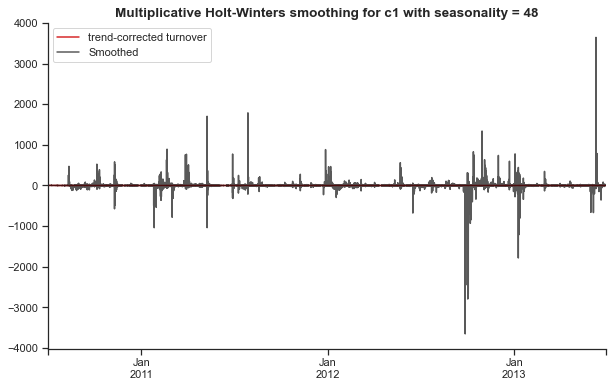

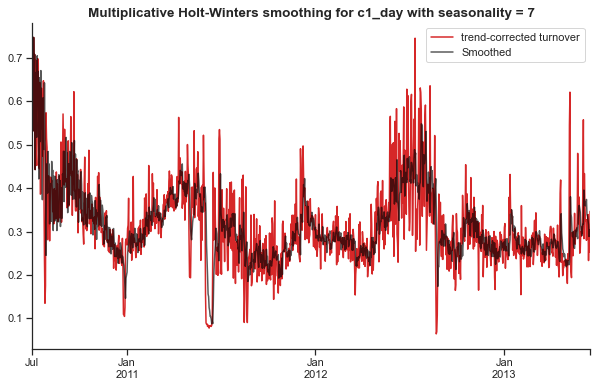

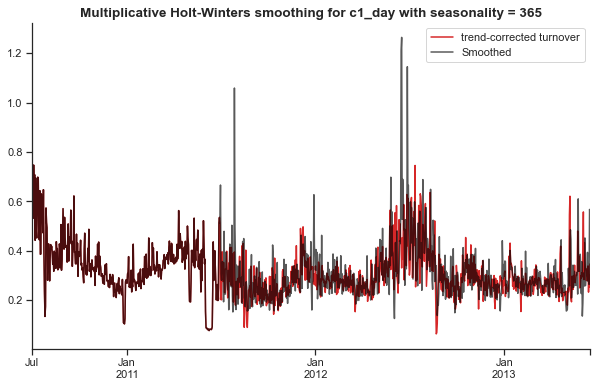

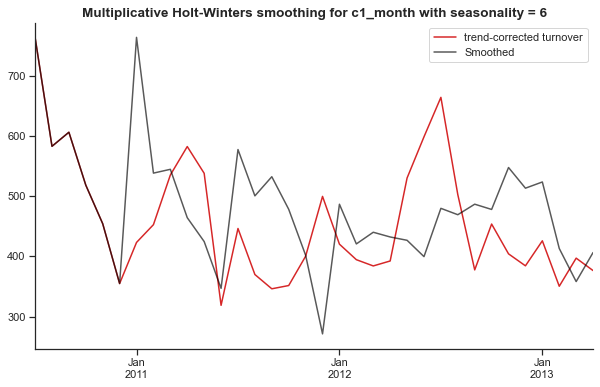

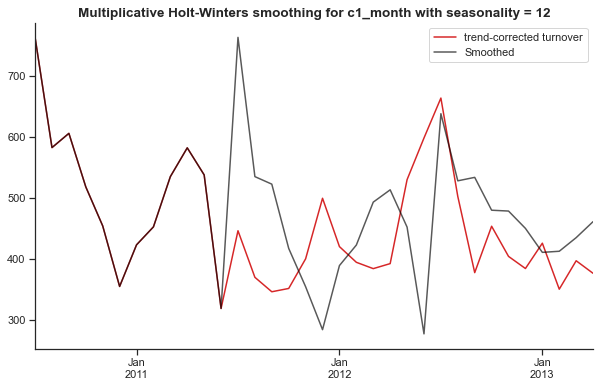

...

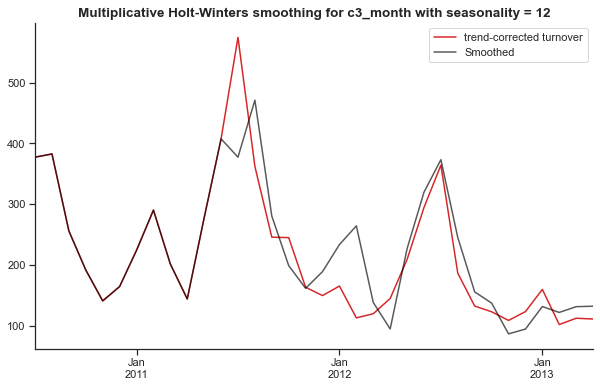

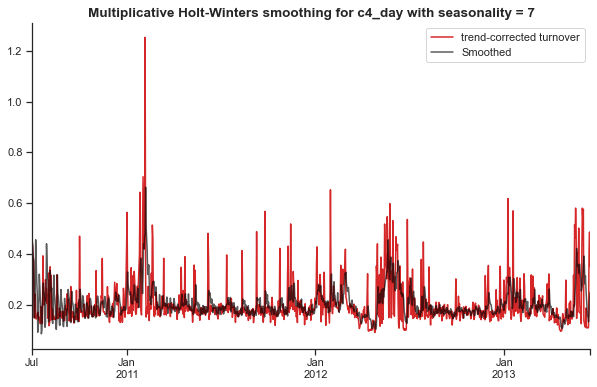

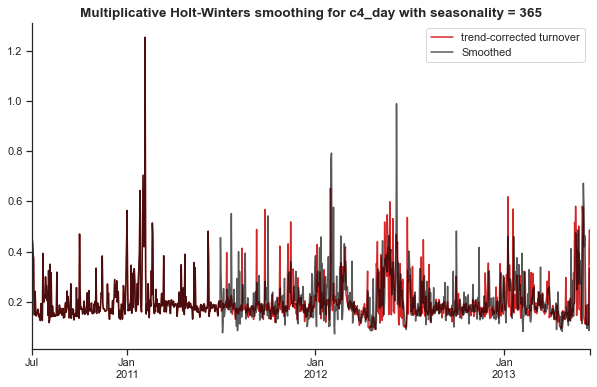

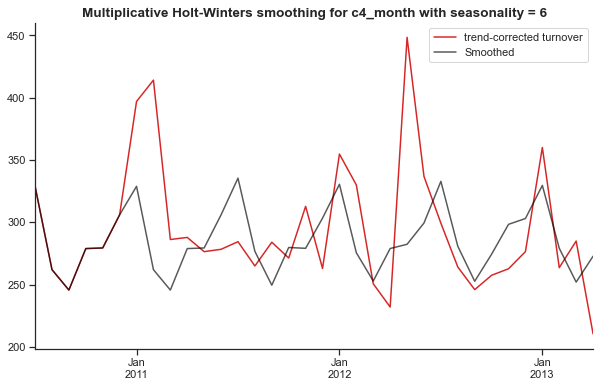

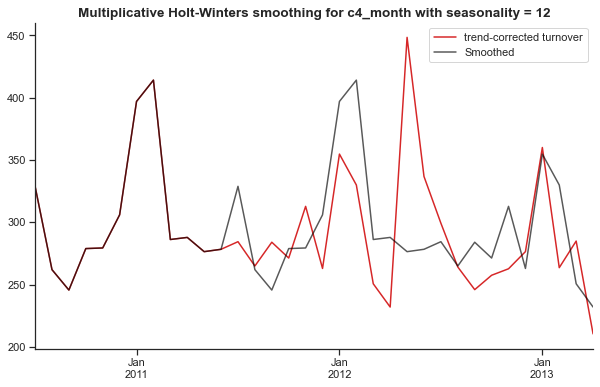

In [51]:
for name, mhw_dict_damped in mhw_damped_sets.items():
    for m, mhw_damped in mhw_dict_damped.items():
        train_set = train_sets[name]
        smoothed = pd.Series(mhw_damped.smooth(), index=train_set.index)
        
        fig, ax = plt.subplots(figsize=(10, 6))
        train_set.plot(color='#D62728', label='trend-corrected turnover')
        smoothed.plot(color='black', label='Smoothed', alpha=0.65)
        plt.legend(loc='best')
        ax.set_xlabel('')
        ax.set_xticks([], minor=True)
        ax.set_title(f'Multiplicative Holt-Winters smoothing for {name} with seasonality = {m}', fontsize=13.5, fontweight='bold')
    
        sns.despine()
        plt.show()

<span style="color: green; font-size: 16px; font-weight: bold;">Point and Probabilistic forecast for Multiplicative Damped Holt-winters.</span>  

Multiplicative Holt-Winters (Damped) forecast for c1 with seasonality = 48:
2013-06-29 00:00    -0.444372
2013-06-29 00:30    -0.259243
2013-06-29 01:00     0.182493
2013-06-29 01:30    -0.054322
2013-06-29 02:00    -0.524996
2013-06-29 02:30    -0.263700
2013-06-29 03:00    -0.437350
2013-06-29 03:30    51.717949
2013-06-29 04:00    -0.259864
2013-06-29 04:30     0.085556
2013-06-29 05:00    -0.317781
2013-06-29 05:30    -3.340121
2013-06-29 06:00     0.691904
2013-06-29 06:30     0.168343
2013-06-29 07:00     0.960006
2013-06-29 07:30    -0.656722
2013-06-29 08:00     0.242752
2013-06-29 08:30     0.134100
2013-06-29 09:00     0.590583
2013-06-29 09:30     0.413894
2013-06-29 10:00     0.105788
2013-06-29 10:30     1.294575
2013-06-29 11:00     2.460622
2013-06-29 11:30     0.833237
2013-06-29 12:00     0.122988
2013-06-29 12:30     3.297124
2013-06-29 13:00    -0.961645
2013-06-29 13:30     0.251885
2013-06-29 14:00     0.319406
2013-06-29 14:30    -0.034996
2013-06-29 15:00    -2.4

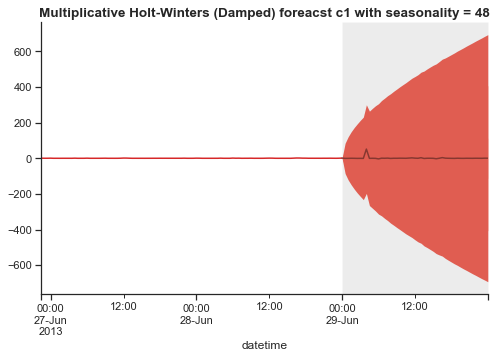

Multiplicative Holt-Winters (Damped) forecast for c1_day with seasonality = 7:
2013-06-17    0.298451
2013-06-18    0.296980
2013-06-19    0.299584
2013-06-20    0.288598
2013-06-21    0.281041
2013-06-22    0.288743
2013-06-23    0.304135
Freq: D, dtype: float64
Probabilistic forecast for c1_day at 95% quantile:
                   0         1
2013-06-17  0.150192  0.446710
2013-06-18  0.087310  0.506651
2013-06-19  0.042792  0.556377
2013-06-20 -0.007920  0.585117
2013-06-21 -0.050477  0.612559
2013-06-22 -0.074417  0.651902
2013-06-23 -0.088122  0.696392


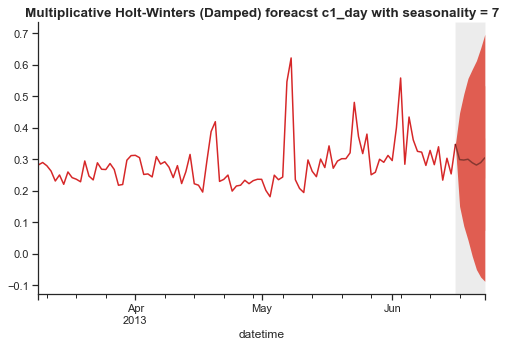

Multiplicative Holt-Winters (Damped) forecast for c1_day with seasonality = 365:
2013-06-17    0.767132
2013-06-18    0.909662
2013-06-19    1.095504
2013-06-20    0.904362
2013-06-21    0.739777
2013-06-22    0.550801
2013-06-23    0.681135
Freq: D, dtype: float64
Probabilistic forecast for c1_day at 95% quantile:
                   0         1
2013-06-17  0.549159  0.985105
2013-06-18  0.601402  1.217922
2013-06-19  0.717964  1.473044
2013-06-20  0.468416  1.340308
2013-06-21  0.252375  1.227179
2013-06-22  0.016879  1.084723
2013-06-23  0.104433  1.257837


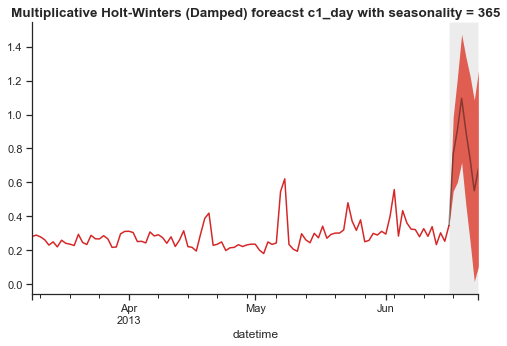

Multiplicative Holt-Winters (Damped) forecast for c1_month with seasonality = 6:
2013-05    480.685468
Freq: M, dtype: float64
Probabilistic forecast for c1_month at 95% quantile:
                  0           1
2013-05  212.573775  748.797161


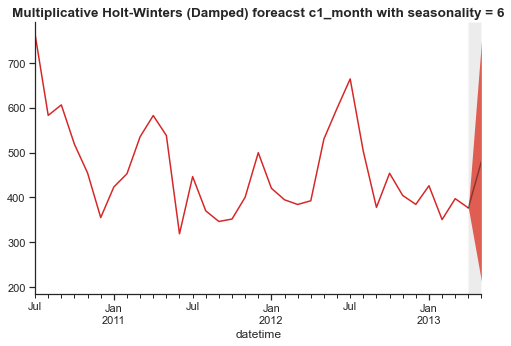

Multiplicative Holt-Winters (Damped) forecast for c1_month with seasonality = 12:
2013-05    483.421229
Freq: M, dtype: float64
Probabilistic forecast for c1_month at 95% quantile:
                  0           1
2013-05  191.486793  775.355665


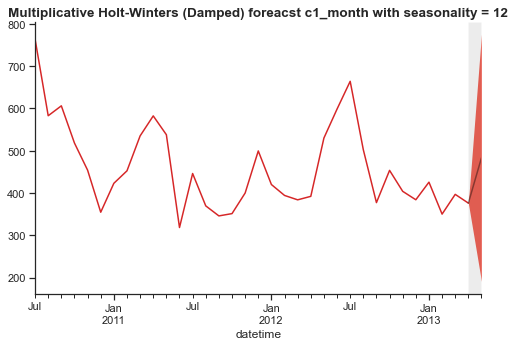

Multiplicative Holt-Winters (Damped) forecast for c2_day with seasonality = 7:
2013-06-17    0.302826
2013-06-18    0.311737
2013-06-19    0.305677
2013-06-20    0.337931
2013-06-21    0.325939
2013-06-22    0.361949
2013-06-23    0.339772
Freq: D, dtype: float64
Probabilistic forecast for c2_day at 95% quantile:
                   0         1
2013-06-17  0.044845  0.560807
2013-06-18 -0.053104  0.676577
2013-06-19 -0.141159  0.752514
2013-06-20 -0.178031  0.853893
2013-06-21 -0.250924  0.902802
2013-06-22 -0.269973  0.993871
2013-06-23 -0.342781  1.022326


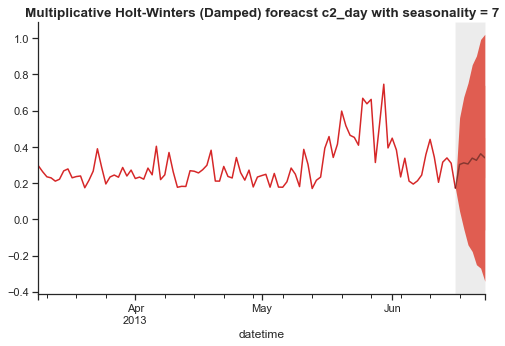

Multiplicative Holt-Winters (Damped) forecast for c2_day with seasonality = 365:
2013-06-17    0.318918
2013-06-18    0.316766
2013-06-19    0.297062
2013-06-20    0.276492
2013-06-21    0.280768
2013-06-22    0.614799
2013-06-23    0.674280
Freq: D, dtype: float64
Probabilistic forecast for c2_day at 95% quantile:
                   0         1
2013-06-17 -0.026571  0.664407
2013-06-18 -0.171829  0.805362
2013-06-19 -0.301343  0.895467
2013-06-20 -0.414487  0.967470
2013-06-21 -0.491769  1.053306
2013-06-22 -0.231473  1.461072
2013-06-23 -0.239799  1.588358


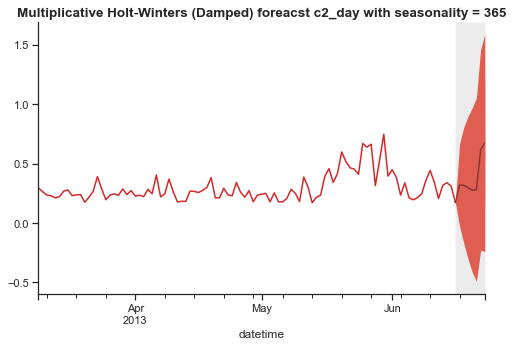

Multiplicative Holt-Winters (Damped) forecast for c2_month with seasonality = 6:
2013-05    239.271144
Freq: M, dtype: float64
Probabilistic forecast for c2_month at 95% quantile:
                 0           1
2013-05 -70.036347  548.578634


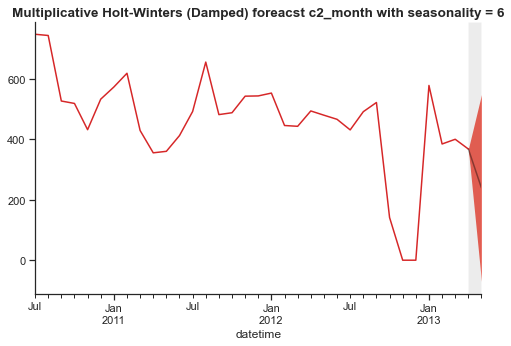

Multiplicative Holt-Winters (Damped) forecast for c2_month with seasonality = 12:
2013-05    278.626492
Freq: M, dtype: float64
Probabilistic forecast for c2_month at 95% quantile:
                  0           1
2013-05 -129.987344  687.240329


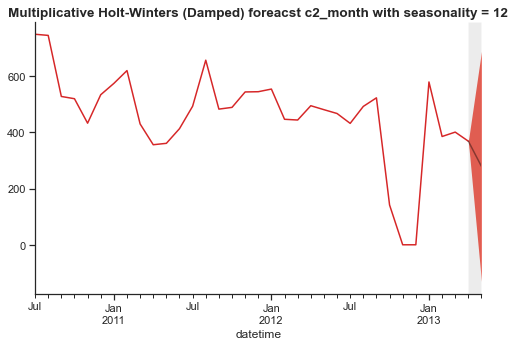

Multiplicative Holt-Winters (Damped) forecast for c3 with seasonality = 48:
2013-06-29 00:00    -0.403232
2013-06-29 00:30    13.046207
2013-06-29 01:00    -0.468069
2013-06-29 01:30    -0.002570
2013-06-29 02:00    -0.366548
2013-06-29 02:30    -0.080098
2013-06-29 03:00    -0.622118
2013-06-29 03:30     0.213742
2013-06-29 04:00    -0.129683
2013-06-29 04:30    -0.174789
2013-06-29 05:00     0.152850
2013-06-29 05:30    -0.089391
2013-06-29 06:00     0.428503
2013-06-29 06:30    -0.202946
2013-06-29 07:00    -0.074749
2013-06-29 07:30    -0.135234
2013-06-29 08:00     0.079856
2013-06-29 08:30     0.226958
2013-06-29 09:00    -1.337361
2013-06-29 09:30    -0.138614
2013-06-29 10:00    -0.388844
2013-06-29 10:30     0.039705
2013-06-29 11:00     0.208710
2013-06-29 11:30     0.413164
2013-06-29 12:00     0.281855
2013-06-29 12:30     0.707203
2013-06-29 13:00     0.739833
2013-06-29 13:30    -1.121295
2013-06-29 14:00     1.931066
2013-06-29 14:30    -0.032759
2013-06-29 15:00    -0.0

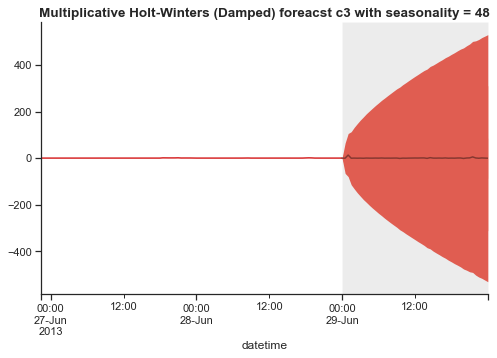

Multiplicative Holt-Winters (Damped) forecast for c3_day with seasonality = 7:
2013-06-17    0.149927
2013-06-18    0.152449
2013-06-19    0.144984
2013-06-20    0.161483
2013-06-21    0.138989
2013-06-22    0.161669
2013-06-23    0.155779
Freq: D, dtype: float64
Probabilistic forecast for c3_day at 95% quantile:
                   0         1
2013-06-17 -0.013071  0.312924
2013-06-18 -0.078065  0.382962
2013-06-19 -0.137337  0.427304
2013-06-20 -0.164512  0.487478
2013-06-21 -0.225484  0.503463
2013-06-22 -0.237592  0.560930
2013-06-23 -0.275472  0.587030


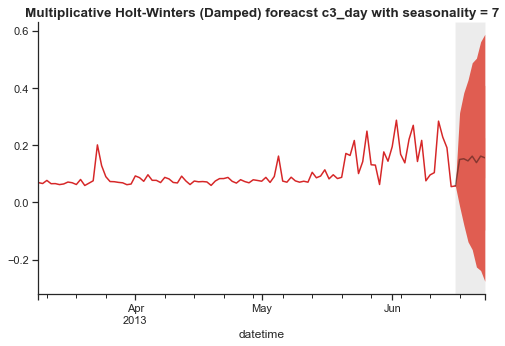

Multiplicative Holt-Winters (Damped) forecast for c3_day with seasonality = 365:
2013-06-17    0.223727
2013-06-18    0.246737
2013-06-19    0.218261
2013-06-20    0.234557
2013-06-21    0.470635
2013-06-22    0.312418
2013-06-23    0.195575
Freq: D, dtype: float64
Probabilistic forecast for c3_day at 95% quantile:
                   0         1
2013-06-17 -0.008791  0.456245
2013-06-18 -0.082094  0.575567
2013-06-19 -0.184473  0.620994
2013-06-20 -0.230479  0.699594
2013-06-21 -0.049292  0.990561
2013-06-22 -0.257133  0.881970
2013-06-23 -0.419610  0.810761


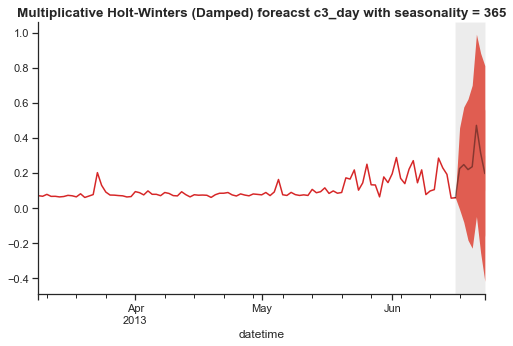

Multiplicative Holt-Winters (Damped) forecast for c3_month with seasonality = 6:
2013-05    121.932276
Freq: M, dtype: float64
Probabilistic forecast for c3_month at 95% quantile:
                 0           1
2013-05 -99.786432  343.650983


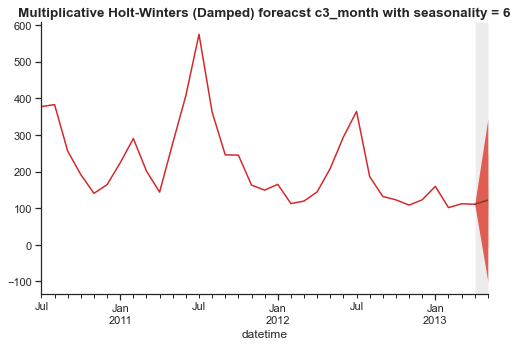

Multiplicative Holt-Winters (Damped) forecast for c3_month with seasonality = 12:
2013-05    202.465799
Freq: M, dtype: float64
Probabilistic forecast for c3_month at 95% quantile:
                 0           1
2013-05  60.167482  344.764116


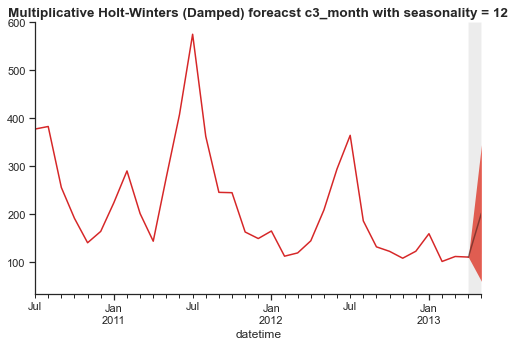

Multiplicative Holt-Winters (Damped) forecast for c4_day with seasonality = 7:
2013-06-17    0.253006
2013-06-18    0.220075
2013-06-19    0.233643
2013-06-20    0.215135
2013-06-21    0.273895
2013-06-22    0.276976
2013-06-23    0.250220
Freq: D, dtype: float64
Probabilistic forecast for c4_day at 95% quantile:
                   0         1
2013-06-17  0.081394  0.424619
2013-06-18 -0.022622  0.462772
2013-06-19 -0.063599  0.530885
2013-06-20 -0.128090  0.558361
2013-06-21 -0.109843  0.657632
2013-06-22 -0.143388  0.697339
2013-06-23 -0.203825  0.704264


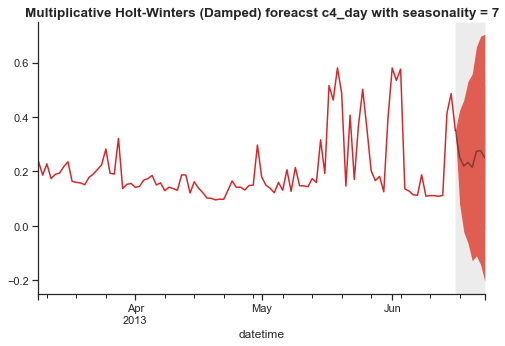

Multiplicative Holt-Winters (Damped) forecast for c4_day with seasonality = 365:
2013-06-17    0.390875
2013-06-18    0.376037
2013-06-19    0.333455
2013-06-20    0.382127
2013-06-21    0.386844
2013-06-22    0.359485
2013-06-23    0.351380
Freq: D, dtype: float64
Probabilistic forecast for c4_day at 95% quantile:
                   0         1
2013-06-17  0.185079  0.596670
2013-06-18  0.084998  0.667076
2013-06-19 -0.022993  0.689903
2013-06-20 -0.029464  0.793718
2013-06-21 -0.073329  0.847016
2013-06-22 -0.144609  0.863579
2013-06-23 -0.193104  0.895864


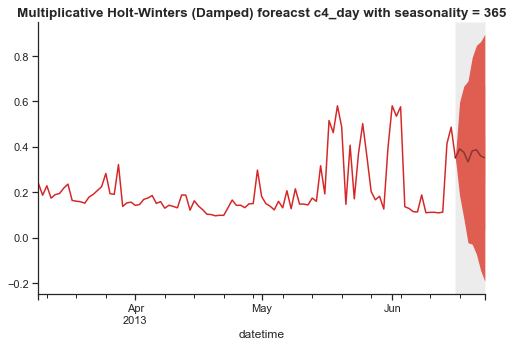

Multiplicative Holt-Winters (Damped) forecast for c4_month with seasonality = 6:
2013-05    298.388726
Freq: M, dtype: float64
Probabilistic forecast for c4_month at 95% quantile:
                  0           1
2013-05  184.055896  412.721556


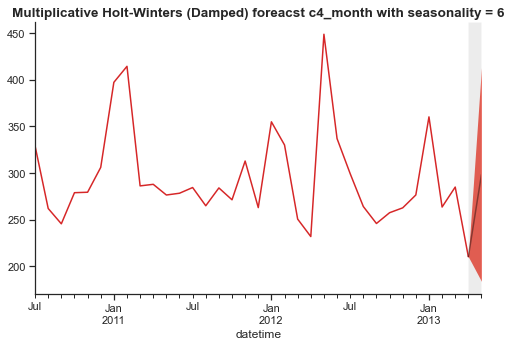

Multiplicative Holt-Winters (Damped) forecast for c4_month with seasonality = 12:
2013-05    276.449
Freq: M, dtype: float64
Probabilistic forecast for c4_month at 95% quantile:
                  0           1
2013-05  160.141207  392.756793


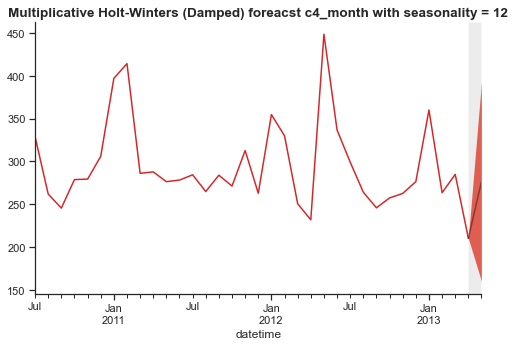

In [52]:
forecast_values_mhw_damped = {}

for name, mhw_dict_damped in mhw_damped_sets.items():
    validation_set = validation_sets[name]  # Get the validation set for the current name
    frequency = train_sets[name].index.freq  # Get the frequency of the time series
    train_set = train_sets[name]
    forecast_values_mhw_damped[name] = {}
    
    for m, mhw_damped in mhw_dict_damped.items():
        if len(validation_set) > m:
            continue  # Skip values of m that are greater than or equal to the length of the validation set
        
        h = len(validation_set)
        test = pd.period_range(start=validation_set.index[0], periods=h, freq=frequency)
        
        mhw_damped_pred = pd.Series(mhw_damped.forecast(h), index=test)
        forecast_values_mhw_damped[name][m] = mhw_damped_pred

        intv_mhw_damped= pd.DataFrame(mhw_damped.intervalforecast(h, level=0.95), index=test)
        intv1 = pd.DataFrame(mhw_damped.intervalforecast(h, level=0.75), index=test)
        intv2 = pd.DataFrame(mhw_damped.intervalforecast(h, level=0.25), index=test)

        fig, ax = forecast.fanchart(train_set[-100:], mhw_damped_pred, intv_mhw_damped, intv1, intv2)

        plt.title(f'Multiplicative Holt-Winters (Damped) foreacst {name} with seasonality = {m}', fontsize=13.5, fontweight='bold')

        print(f'Multiplicative Holt-Winters (Damped) forecast for {name} with seasonality = {m}:')
        print(mhw_damped_pred)
        print(f'Probabilistic forecast for {name} at 95% quantile:')
        print(intv_mhw_damped)


        sns.despine()
        plt.show()


<span style="color: green; font-size: 16px; font-weight: bold;">MAE calculation.</span>  

In [53]:
mae_mhw_damped = {}

for keyword, m_dict in forecast_values_mhw_damped.items():
    mae_dict = {}
    validation_set = validation_sets[keyword]
    
    for m, mhw_damped_pred in m_dict.items():
        mae = np.abs(validation_set - mhw_damped_pred).mean()
        mae_dict[m] = {'MAE': mae}  # Update the structure of mae_dict
    
    if mae_dict:
        best_m = min(mae_dict, key=lambda x: mae_dict[x]['MAE'])
        best_mae = round(mae_dict[best_m]['MAE'], 3) 
        mae_mhw_damped[keyword] = {'best_m': best_m, 'MAE': best_mae}

for keyword, values in mae_mhw_damped.items():
    best_m = values['best_m']
    best_mae = values['MAE']
    print(f"{keyword}: m = {best_m}, MAE = {best_mae}")

c1: m = 48, MAE = 1.762
c1_day: m = 7, MAE = 0.071
c1_month: m = 6, MAE = 33.833
c2_day: m = 7, MAE = 0.058
c2_month: m = 12, MAE = 273.524
c3: m = 48, MAE = 0.852
c3_day: m = 365, MAE = 0.122
c3_month: m = 12, MAE = 37.248
c4_day: m = 365, MAE = 0.083
c4_month: m = 6, MAE = 75.134


## ARIMA MODELS

- Due to limited disk memmory and computing time restriction, I will trade-off by only using the last 96 observations of the train dataset to forecast . This also means sacrificing the 'completeness' of the model.


- Additionlly, the choice of m values might result in some errors due to lack of observations. Therefore, I will choose to skip fitting for those time series. 

In [54]:
import pmdarima as pm

def fit_arima_models(train_sets, m_values):
    models = {}
    for name, train_set in train_sets.items():
        if train_set.index.freq == '30T' or train_set.index.freq == 'D': #only takes a few last observations due to limited disk memory
            train_set = train_set[-96:]
        for m in m_values.get(name, _):
            try:
                model = pm.auto_arima(train_set, seasonal=True, m=m)
                models[(name, m)] = model
                print(f"Order for ARIMA model of {name} with m={m}:")
                print(model)
                print("\n")
            except ValueError:
                print(f"Not enough observations for {name} with m={m}.\n")

    return models

fitted_models = fit_arima_models(train_sets, m_values)
fitted_models

Not enough observations for c1 with m=48.

Not enough observations for c1 with m=17520.

Order for ARIMA model of c1_day with m=7:
 ARIMA(4,1,1)(0,0,0)[7] intercept


Not enough observations for c1_day with m=365.

Order for ARIMA model of c1_month with m=6:
 ARIMA(1,0,0)(0,0,0)[6] intercept


Order for ARIMA model of c1_month with m=12:
 ARIMA(1,0,0)(0,0,0)[12] intercept


Order for ARIMA model of c2 with m=48:
 ARIMA(3,1,3)(0,0,0)[48] intercept


Not enough observations for c2 with m=17520.

Order for ARIMA model of c2_day with m=7:
 ARIMA(0,1,3)(1,0,0)[7]          


Not enough observations for c2_day with m=365.

Order for ARIMA model of c2_month with m=6:
 ARIMA(0,1,0)(0,0,0)[6]          


Order for ARIMA model of c2_month with m=12:
 ARIMA(1,0,0)(0,1,0)[12] intercept


Order for ARIMA model of c3 with m=48:
 ARIMA(2,0,1)(0,0,1)[48] intercept


Not enough observations for c3 with m=17520.

Order for ARIMA model of c3_day with m=7:
 ARIMA(1,1,1)(0,0,2)[7]          


Not enough ob

{('c1_day',
  7): ARIMA(order=(4, 1, 1), scoring_args={}, seasonal_order=(0, 0, 0, 7),
       suppress_warnings=True),
 ('c1_month',
  6): ARIMA(order=(1, 0, 0), scoring_args={}, seasonal_order=(0, 0, 0, 6),
       suppress_warnings=True),
 ('c1_month',
  12): ARIMA(order=(1, 0, 0), scoring_args={}, seasonal_order=(0, 0, 0, 12),
       suppress_warnings=True),
 ('c2',
  48): ARIMA(order=(3, 1, 3), scoring_args={}, seasonal_order=(0, 0, 0, 48),
       suppress_warnings=True),
 ('c2_day',
  7): ARIMA(order=(0, 1, 3), scoring_args={}, seasonal_order=(1, 0, 0, 7),
       suppress_warnings=True, with_intercept=False),
 ('c2_month',
  6): ARIMA(order=(0, 1, 0), scoring_args={}, seasonal_order=(0, 0, 0, 6),
       suppress_warnings=True, with_intercept=False),
 ('c2_month',
  12): ARIMA(order=(1, 0, 0), scoring_args={}, seasonal_order=(0, 1, 0, 12),
       suppress_warnings=True),
 ('c3',
  48): ARIMA(order=(2, 0, 1), scoring_args={}, seasonal_order=(0, 0, 1, 48),
       suppress_warnings=Tru

<span style="color: green; font-size: 16px; font-weight: bold;">Point and Probabilistic forecast for ARIMA models.</span> 

In [55]:
def fanchart(y, y_val, forecast, intv):  # develop my own fanchart function from the original function
    last=y.iloc[-1:]                     # in the forecast.py file
    future=last.append(forecast)
    
    with sns.axes_style('ticks'):
        fig, ax= plt.subplots(figsize=(8,5))
        y.plot(color='blue')
        y_val.plot(color='red')
        future.plot(color='black', alpha=0.4, label='Point forecast')
        ax.fill_between(future.index, last.append(intv.iloc[:,0]), last.append(intv.iloc[:,1]), facecolor='#F15749', lw=0)
        hold = ax.get_ylim()
        ax.fill_betweenx(ax.get_ylim(), future.index[0], future.index[-1], facecolor='grey', alpha=0.15)
        ax.set_ylim(hold)
    return fig, ax

In [56]:
def forecast_intervals(fitted_models, validation_sets, train_sets):
    forecast_arima = {}

    for (name, m), model in fitted_models.items():
        validation_set = validation_sets.get(name)
        train_set = train_sets.get(name)
        forecast_arima[name] = {}
        
        h = len(validation_set)
        
        if train_set.index.freq == '30T' or train_set.index.freq == 'D': #only takes a few last observations due to limited disk memory
            train_set = train_set[-96:]
        try:
            forecast = model.predict(h)
            forecast_arima[name][m] = forecast

            resid = validation_set - forecast
            sigma = resid.std()
            crit = stats.norm.ppf(1 - (1 - 0.95) / 2)


            
            intv_arima = pd.concat([forecast - crit * sigma*np.sqrt(np.arange(1, h+1)),
                          forecast + crit * sigma*np.sqrt(np.arange(1, h+1))], axis=1)
            intv_arima.columns = ['Lower Interval', 'Upper Interval']
                       
            fanchart(train_set, validation_set, forecast, intv_arima)

            plt.title(f'ARIMA forecast for {name} with m={m}', fontsize=13.5, fontweight='bold')
            sns.despine()
            plt.show()

        except (ValueError, AttributeError):
            print(f"Error forecast for {name} with m={m}.\n")

    return forecast_arima


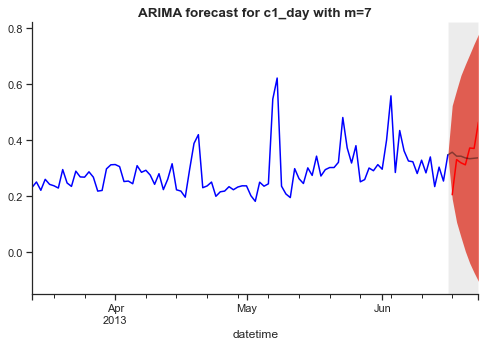

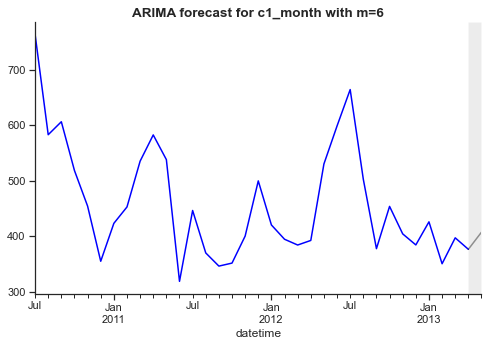

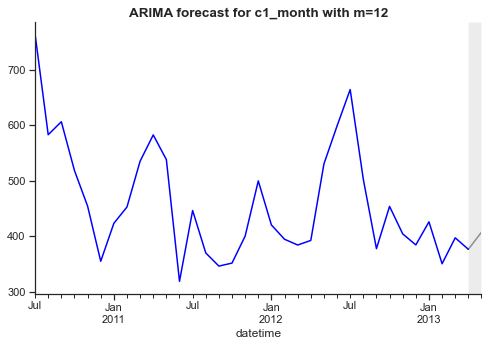

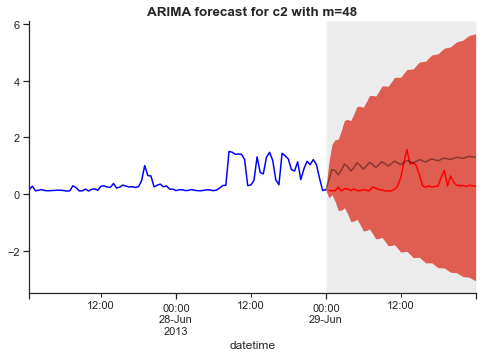

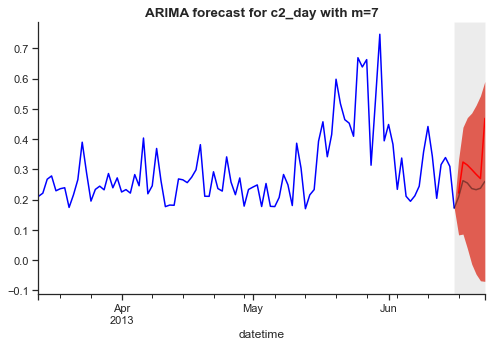

...

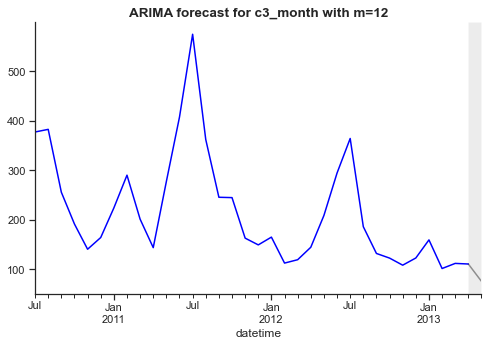

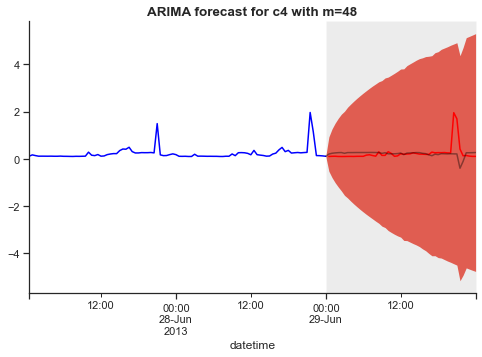

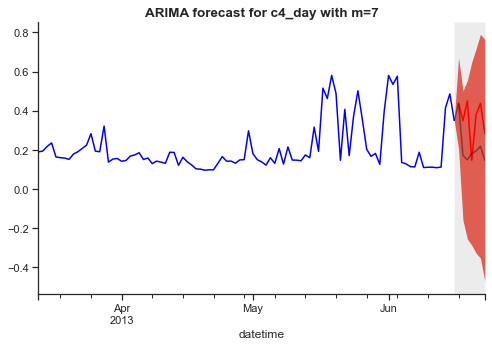

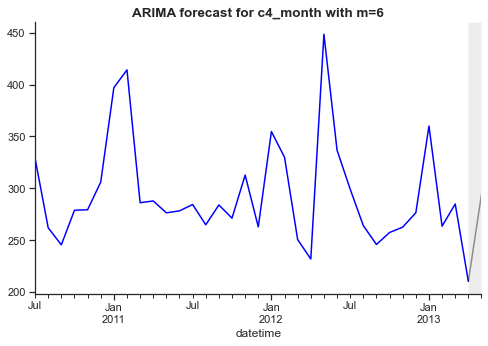

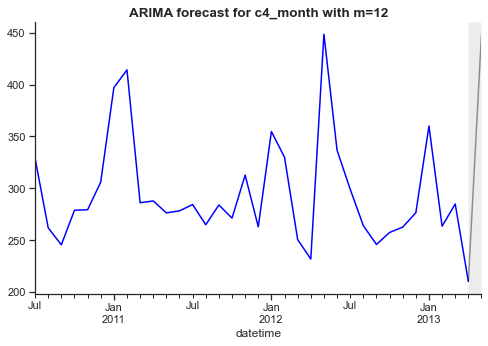

In [57]:
forecast_arima=forecast_intervals(fitted_models, validation_sets, train_sets)

In [58]:
print(forecast_arima)

{'c1_day': {7: 2013-06-17    0.356008
2013-06-18    0.341994
2013-06-19    0.341853
2013-06-20    0.335665
2013-06-21    0.332832
2013-06-22    0.334451
2013-06-23    0.336089
Freq: D, dtype: float64}, 'c1_month': {12: 2013-05    407.225233
Freq: M, dtype: float64}, 'c2': {48: 2013-06-29 00:00    0.496404
2013-06-29 00:30    0.868520
2013-06-29 01:00    0.830822
2013-06-29 01:30    0.677788
2013-06-29 02:00    0.839015
2013-06-29 02:30    1.060493
2013-06-29 03:00    0.969007
2013-06-29 03:30    0.812644
2013-06-29 04:00    0.933471
2013-06-29 04:30    1.102178
2013-06-29 05:00    1.012870
2013-06-29 05:30    0.882127
2013-06-29 06:00    0.986261
2013-06-29 06:30    1.122892
2013-06-29 07:00    1.043756
2013-06-29 07:30    0.938543
2013-06-29 08:00    1.030651
2013-06-29 08:30    1.142760
2013-06-29 09:00    1.074162
2013-06-29 09:30    0.990584
2013-06-29 10:00    1.072307
2013-06-29 10:30    1.164620
2013-06-29 11:00    1.105732
2013-06-29 11:30    1.039967
2013-06-29 12:00    1.1124

In [59]:
from sklearn.metrics import mean_absolute_error

def calculate_mae(forecast_arima, validation_sets):
    mae_arima = {}

    for name, forecasts in forecast_arima.items():
        validation_set = validation_sets.get(name)
        mae_dict = {}

        for m, forecast in forecasts.items():
            #mae = mean_absolute_error(validation_set, forecast)
            mae =np.mean(np.abs( np.exp(forecast) - validation_set) )
            mae_dict[m] = mae

        best_m = min(mae_dict, key=mae_dict.get)
        mae_arima[name] = {'best_m': best_m, 'MAE': mae_dict[best_m]}

    return mae_arima

In [60]:
mae_arima = calculate_mae(forecast_arima, validation_sets)
mae_arima

{'c1_day': {'best_m': 7, 'MAE': 1.0665459367911223},
 'c1_month': {'best_m': 12, 'MAE': 7.172513627468809e+176},
 'c2': {'best_m': 48, 'MAE': 2.672724294480371},
 'c2_day': {'best_m': 7, 'MAE': 0.9622247804658465},
 'c2_month': {'best_m': 12, 'MAE': 8.138943052691395e+159},
 'c3': {'best_m': 48, 'MAE': 1.0083039718841014},
 'c3_day': {'best_m': 7, 'MAE': 0.9087549005026195},
 'c3_month': {'best_m': 12, 'MAE': 7.367604486188464e+32},
 'c4': {'best_m': 48, 'MAE': 1.0520901022347158},
 'c4_day': {'best_m': 7, 'MAE': 0.8891798998580548},
 'c4_month': {'best_m': 12, 'MAE': 5.885501531905634e+194}}

In [61]:
time_ser = ['c1','c1_day','c1_month','c2','c2_day','c2_month','c3','c3_day','c3_month','c4','c4_day','c4_month']

In [62]:

mae_values = {
    'Naive Method': mae_naive,
    'Simple Exponential Smoothing': mae_ses,
    'Holt-Winters Trend Corrected': mae_hwtc,
    'Additive Holt-Winters': mae_ahw,
    'Additive-Damped Holt-Winters': mae_ahw_damped,
    'Multiplicative Holt-Winters': mae_mhw,
    'Multiplicative-Damped Holt-Winters': mae_mhw_damped,
    'ARIMA Model': mae_arima
}

best_model_table = pd.DataFrame(columns=['Time Series', 'Best Model', 'MAE'])

for name in time_ser:
    min_mae = float('inf') #set the variable min_mae equal to infinity
    best_model = ''

    for model, mae_dict in mae_values.items(): 
        if name in mae_dict: #check if name of time serie exists
            mae = mae_dict[name]['MAE']
            if mae < min_mae:
                min_mae = mae
                best_model = model

    best_model_table = best_model_table.append({'Time Series': name, 'Best Model': best_model, 'MAE': min_mae},
                                         ignore_index=True)

print("Best Models Table:")
print(best_model_table.to_string(index=False))

Best Models Table:
Time Series                         Best Model         MAE
         c1       Simple Exponential Smoothing    0.203264
     c1_day                       Naive Method       0.056
   c1_month Multiplicative-Damped Holt-Winters      33.833
         c2       Holt-Winters Trend Corrected    0.216227
     c2_day       Simple Exponential Smoothing    0.054872
   c2_month       Simple Exponential Smoothing  152.483838
         c3       Simple Exponential Smoothing      0.0868
     c3_day              Additive Holt-Winters       0.106
   c3_month        Multiplicative Holt-Winters      27.176
         c4              Additive Holt-Winters       0.121
     c4_day                       Naive Method       0.082
   c4_month       Additive-Damped Holt-Winters      75.132


# Forecasting

### Forecast for c1

In [63]:
import forecast # you need to download the forecast.py file from the Canvas

ses_c1=forecast.ses(combined_train_sets['c1'])
ses_c1.fit()
ses_c1.summary()

 Simple exponential smoothing

 Smoothing parameter:
 alpha  0.373 (0.006) 

 In-sample fit:
 MSE               0.080
 Log-likelihood   -8173.183
 AIC               16352.367
 BIC               16378.976


Interval probabilistic forecast at 95% quantile:
                         0         1
2013-06-30 00:00 -0.374245  0.808550
2013-06-30 00:30 -0.409375  0.843680
2013-06-30 01:00 -0.442638  0.876942
2013-06-30 01:30 -0.474302  0.908606
2013-06-30 02:00 -0.504578  0.938882
2013-06-30 02:30 -0.533634  0.967938
2013-06-30 03:00 -0.561607  0.995911
2013-06-30 03:30 -0.588609  1.022913
2013-06-30 04:00 -0.614735  1.049040
2013-06-30 04:30 -0.640066  1.074370
2013-06-30 05:00 -0.664669  1.098973
2013-06-30 05:30 -0.688604  1.122908
2013-06-30 06:00 -0.711923  1.146227
2013-06-30 06:30 -0.734670  1.168974
2013-06-30 07:00 -0.756887  1.191191
2013-06-30 07:30 -0.778607  1.212912
2013-06-30 08:00 -0.799865  1.234169
2013-06-30 08:30 -0.820686  1.254991
2013-06-30 09:00 -0.841098  1.275403
2013-06-30 09:30 -0.861124  1.295429
2013-06-30 10:00 -0.880785  1.315089
2013-06-30 10:30 -0.900100  1.334404
2013-06-30 11:00 -0.919086  1.353390
2013-06-30 11:30 -0.937760  1.372065
2013-06-30 12:00 -0.956138

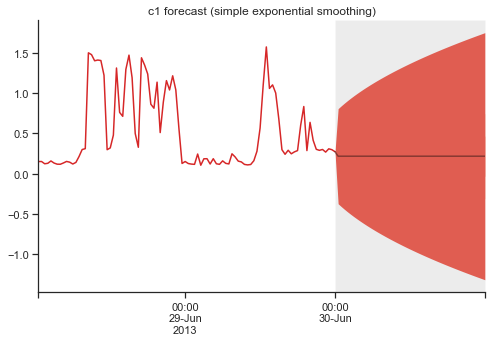

In [64]:
h= len(test_sets['c1'])

model = ses_c1
freq_c1 = combined_train_sets['c1'].index.freq

test=pd.period_range(start=test_sets['c1'].index[0], periods=h, freq=freq_c1)

pred_c1=pd.Series(model.forecast(h), index=test)

intv1=pd.DataFrame(model.intervalforecast(h, level=.95), index=test)
intv2=pd.DataFrame(model.intervalforecast(h, level=.25), index=test)
intv3=pd.DataFrame(model.intervalforecast(h, level=.50), index=test)
#fanchart(combined_train_sets['c1'][-96:], test_sets['c1'], pred, intv1)
fig, ax = forecast.fanchart(combined_train_sets['c2'][-96:], pred_c1, intv1,intv2,intv3)
ax.set_xlabel('')
ax.set_xticks([], minor=True)
plt.title('c1 forecast (simple exponential smoothing)')
print(f'Interval probabilistic forecast at 95% quantile:')
print(intv1)

sns.despine()
plt.show()

In [65]:
# Calculate MAE
mae_c1 = mean_absolute_error(test_sets['c1'], pred_c1)

# Print MAE
print(f"Mean Absolute Error for c1: {mae_c1}")

Mean Absolute Error for c1: 0.3078061604478097


### Forecast for c1_day

Interval probabilistic forecast at 95% quantile:
                   0         1
2013-06-24  0.296437  0.631854
2013-06-25  0.226970  0.701321
2013-06-26  0.173666  0.754625
2013-06-27  0.128729  0.799563
2013-06-28  0.089138  0.839153
2013-06-29  0.053346  0.874946
2013-06-30  0.020431  0.907861


(<Figure size 576x360 with 1 Axes>, <AxesSubplot:xlabel='datetime'>)

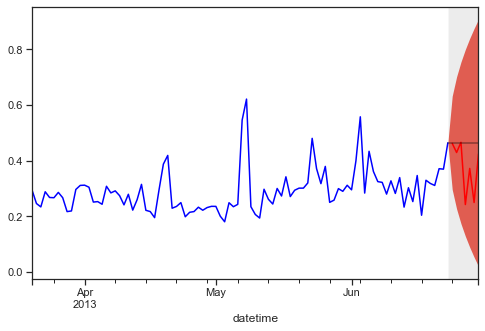

In [66]:
h = len(test_sets['c1_day'])
freq_c1_day = combined_train_sets['c1_day'].index.freq
test=pd.period_range(start=test_sets['c1_day'].index[0], periods=h, freq=freq_c1_day)
pred_c1_day=pd.Series(np.repeat(combined_train_sets['c1_day'].iloc[-1], h), index=test) # the forecast repeats the last observed values h times
resid=combined_train_sets['c1_day']-combined_train_sets['c1_day'].shift(1) # the shift lags the series by one period
sigma = resid.std()
intv_c1_day = pd.concat([pred_c1_day-stats.norm.ppf(1-(1-0.95)/2)*sigma*np.sqrt(np.arange(1,h+1)),
                   pred_c1_day+stats.norm.ppf(1-(1-0.95)/2)*sigma*np.sqrt(np.arange(1,h+1))], axis=1)

print(f'Interval probabilistic forecast at 95% quantile:')
print(intv_c1_day)
fanchart(combined_train_sets['c1_day'][-96:], test_sets['c1_day'], pred_c1_day, intv_c1_day)


In [67]:
# Calculate MAE
mae_c1_day = mean_absolute_error(test_sets['c1_day'], pred_c1_day)

# Print MAE
print(f"Mean Absolute Error for c1_day: {mae_c1_day}")

Mean Absolute Error for c1_day: 0.08668452380952378


### Forecast for c1_month

In [68]:
import forecast

In [69]:
c1_month_md=forecast.holtwinters(combined_train_sets['c1_month'], additive=False, damped=True, m=6) 
c1_month_md.fit()
print(f'Multiplicative Damped fitting for c1_month with half-yearly seasonality')
c1_month_md.summary()

Multiplicative Damped fitting for c1_month with half-yearly seasonality
 Multiplicative Holt-winters exponential smoothing (damped trend)

 Smoothing parameters:
 alpha (level)    0.169 (0.149)
 beta  (trend)    0.000 (0.161)
 delta (seasonal) 0.535 (0.194)
 phi (damping)    1.000 (0.168)
 
 In-sample fit:
 MSE               18000.653
 RMSE              134.167
 Log-likelihood   -221.131
 AIC               452.261
 BIC               460.038


Multiplicative Holt-Winters (Damped) forecast for c1_monh with seasonality = 12:
2013-05    276.449
Freq: M, dtype: float64
Interval probabilistic forecast at 95% quantile:
                  0           1
2013-05  160.141207  392.756793


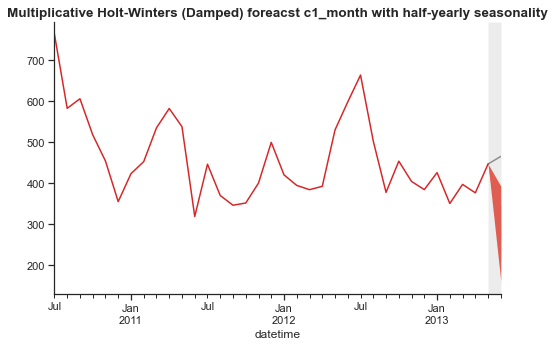

In [70]:
h = len(test_sets['c1_month'])
freq_c1_month = combined_train_sets['c1_month'].index.freq

test = pd.period_range(start=test_sets['c1_month'].index[0], periods=h, freq=freq_c1_month)

pred_c1_month = pd.Series(c1_month_md.forecast(h), index=test)

intv_c1_month= pd.DataFrame(mhw_damped.intervalforecast(h, level=0.95), index=test)
intv1 = pd.DataFrame(mhw_damped.intervalforecast(h, level=0.75), index=test)
intv2 = pd.DataFrame(mhw_damped.intervalforecast(h, level=0.25), index=test)

fig, ax = forecast.fanchart(combined_train_sets['c1_month'][-96:], pred_c1_month, intv_c1_month, intv1, intv2)

plt.title(f'Multiplicative Holt-Winters (Damped) foreacst c1_month with half-yearly seasonality', fontsize=13.5, fontweight='bold')

print(f'Multiplicative Holt-Winters (Damped) forecast for c1_monh with seasonality = 12:')
print(mhw_damped_pred)
print(f'Interval probabilistic forecast at 95% quantile:')
print(intv_mhw_damped)


sns.despine()
plt.show()


In [71]:
# Calculate MAE
mae_c1_month = mean_absolute_error(test_sets['c1_month'], pred_c1_month)

# Print MAE
print(f"Mean Absolute Error for c1_month: {mae_c1_month}")

Mean Absolute Error for c1_month: 31.608904575931774


### Forecast for c2

In [72]:
import forecast # you need to download the forecast.py file from the Canvas

holt_c2=forecast.holt(combined_train_sets['c2'])
holt_c2.fit()
holt_c2.summary()

 Holt (trend corrected) exponential smoothing

 Smoothing parameters: 
 alpha (level) 0.916 (0.005)
 beta (trend)  0.000 (0.004)
 
 In-sample fit:
 MSE               0.057
 Log-likelihood    776.925
 AIC               -1547.849
 BIC               -1521.471


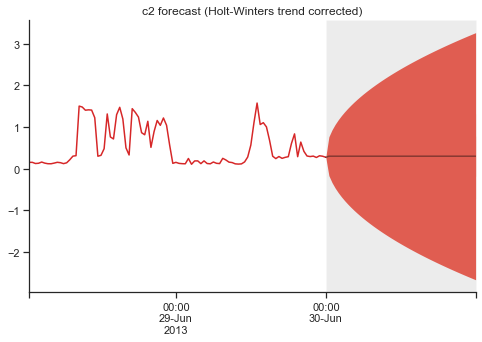

In [73]:
h= len(test_sets['c2'])

model = holt_c2
freq_c2 = combined_train_sets['c2'].index.freq

test=pd.period_range(start=test_sets['c2'].index[0], periods=h, freq=freq_c2)

pred_c2=pd.Series(model.forecast(h), index=test)

intv1=pd.DataFrame(model.intervalforecast(h, level=.95), index=test)
intv2=pd.DataFrame(model.intervalforecast(h, level=.25), index=test)
intv3=pd.DataFrame(model.intervalforecast(h, level=.50), index=test)
#fanchart(combined_train_sets['c2'][-96:], test_sets['c2'], pred, intv1)
fig, ax = forecast.fanchart(combined_train_sets['c2'][-96:], pred_c2, intv1,intv2,intv3)
ax.set_xlabel('')
ax.set_xticks([], minor=True)
plt.title('c2 forecast (Holt-Winters trend corrected)')

sns.despine()
plt.show()

In [74]:
# Calculate MAE
mae_c2 = mean_absolute_error(test_sets['c2'], pred_c2)

# Print MAE
print(f"Mean Absolute Error for c2: {mae_c2}")

Mean Absolute Error for c2: 0.12064265221562542


### Forecast for c2_day

In [75]:
import forecast # you need to download the forecast.py file from the Canvas

ses_c2_day=forecast.ses(combined_train_sets['c2_day'])
ses_c2_day.fit()
ses_c2_day.summary()

 Simple exponential smoothing

 Smoothing parameter:
 alpha  0.141 (0.019) 

 In-sample fit:
 MSE               0.016
 Log-likelihood    708.299
 AIC               -1410.598
 BIC               -1395.619


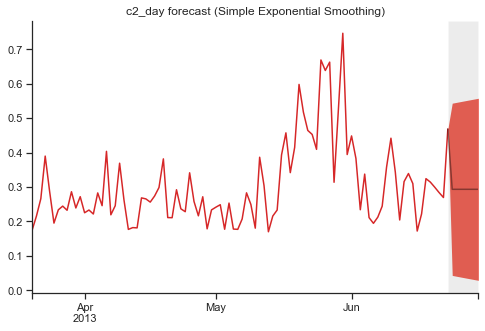

In [76]:
h= len(test_sets['c2_day'])

model = ses_c2_day
freq_c2_day = combined_train_sets['c2_day'].index.freq

test=pd.period_range(start=test_sets['c2_day'].index[0], periods=h, freq=freq_c2_day)

pred_c2_day=pd.Series(model.forecast(h), index=test)

intv1=pd.DataFrame(model.intervalforecast(h, level=.95), index=test)
intv2=pd.DataFrame(model.intervalforecast(h, level=.25), index=test)
intv3=pd.DataFrame(model.intervalforecast(h, level=.50), index=test)
#fanchart(combined_train_sets['c2_day'][-96:], test_sets['c2_day'], pred, intv1)
fig, ax = forecast.fanchart(combined_train_sets['c2_day'][-96:], pred_c2_day, intv1,intv2,intv3)
ax.set_xlabel('')
ax.set_xticks([], minor=True)
plt.title('c2_day forecast (Simple Exponential Smoothing)')

sns.despine()
plt.show()

In [77]:
# Calculate MAE
mae_c2_day = mean_absolute_error(test_sets['c2_day'], pred_c2_day)

# Print MAE
print(f"Mean Absolute Error for c2: {mae_c2_day}")

Mean Absolute Error for c2: 0.11006483308061644


### Forecast for c2_month

In [78]:
import forecast # you need to download the forecast.py file from the Canvas

ses_c2_month=forecast.ses(combined_train_sets['c2_month'])
ses_c2_month.fit()
ses_c2_month.summary()

 Simple exponential smoothing

 Smoothing parameter:
 alpha  0.716 (0.333) 

 In-sample fit:
 MSE               21493.925
 Log-likelihood   -224.235
 AIC               454.469
 BIC               459.135


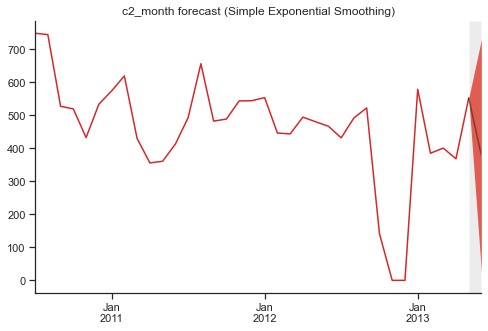

In [79]:
h= len(test_sets['c2_month'])

model = ses_c2_month
freq_c2_month = combined_train_sets['c2_month'].index.freq

test=pd.period_range(start=test_sets['c2_month'].index[0], periods=h, freq=freq_c2_month)

pred_c2_month=pd.Series(model.forecast(h), index=test)

intv1=pd.DataFrame(model.intervalforecast(h, level=.95), index=test)
intv2=pd.DataFrame(model.intervalforecast(h, level=.25), index=test)
intv3=pd.DataFrame(model.intervalforecast(h, level=.50), index=test)
#fanchart(combined_train_sets['c2_month'][-96:], test_sets['c2_month'], pred, intv1)
fig, ax = forecast.fanchart(combined_train_sets['c2_month'][-96:], pred_c2_month, intv1,intv2,intv3)
ax.set_xlabel('')
ax.set_xticks([], minor=True)
plt.title('c2_month forecast (Simple Exponential Smoothing)')

sns.despine()
plt.show()

In [80]:
# Calculate MAE
mae_c2_month = mean_absolute_error(test_sets['c2_month'], pred_c2_month)

# Print MAE
print(f"Mean Absolute Error for c2_month: {mae_c2_month}")

Mean Absolute Error for c2_month: 74.64571006679245


### Forecast for c3

In [81]:
import forecast # you need to download the forecast.py file from the Canvas

ses_c3=forecast.ses(combined_train_sets['c3'])
ses_c3.fit()
ses_c3.summary()

 Simple exponential smoothing

 Smoothing parameter:
 alpha  0.734 (0.005) 

 In-sample fit:
 MSE               0.017
 Log-likelihood    32343.020
 AIC               -64680.039
 BIC               -64653.430


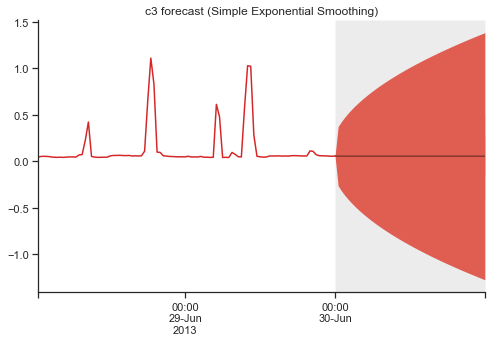

In [82]:
h= len(test_sets['c3'])

model = ses_c3
freq_c3 = combined_train_sets['c3'].index.freq

test=pd.period_range(start=test_sets['c3'].index[0], periods=h, freq=freq_c3)

pred_c3=pd.Series(model.forecast(h), index=test)

intv1=pd.DataFrame(model.intervalforecast(h, level=.95), index=test)
intv2=pd.DataFrame(model.intervalforecast(h, level=.25), index=test)
intv3=pd.DataFrame(model.intervalforecast(h, level=.50), index=test)
#fanchart(combined_train_sets['c3'][-96:], test_sets['c3'], pred, intv1)
fig, ax = forecast.fanchart(combined_train_sets['c3'][-96:], pred_c3, intv1,intv2,intv3)
ax.set_xlabel('')
ax.set_xticks([], minor=True)
plt.title('c3 forecast (Simple Exponential Smoothing)')

sns.despine()
plt.show()

In [83]:
# Calculate MAE
mae_c3 = mean_absolute_error(test_sets['c3'], pred_c3)

# Print MAE
print(f"Mean Absolute Error for c3: {mae_c3}")

Mean Absolute Error for c3: 0.007622504737734862


### Forecast for c3_day

In [104]:
c3_day_ahw=forecast.holtwinters(combined_train_sets['c3_day'], additive=True, damped=False, m=7) 
c3_day_ahw.fit()
c3_day_ahw.summary()

 Additive Holt-winters exponential smoothing

 Smoothing parameters:
 alpha (level)    0.236 (0.033)
 beta  (trend)    0.000 (0.030)
 delta (seasonal) 0.191 (0.021)
 
 In-sample fit:
 MSE               0.007
 RMSE              0.084
 Log-likelihood    1158.601
 AIC               -2309.202
 BIC               -2289.230


Multiplicative Holt-Winters (Damped) forecast for c1_monh with seasonality = 12:
2013-06-24    0.237996
2013-06-25    0.243811
2013-06-26    0.273410
2013-06-27    0.282956
2013-06-28    0.239138
2013-06-29    0.243313
2013-06-30    0.248881
Freq: D, dtype: float64
Interval probabilistic forecast at 95% quantile:
                   0         1
2013-06-24  0.074329  0.401662
2013-06-25  0.012352  0.475270
2013-06-26 -0.010069  0.556888
2013-06-27 -0.044377  0.610289
2013-06-28 -0.126831  0.605107
2013-06-29 -0.157586  0.644213
2013-06-30 -0.184140  0.681902


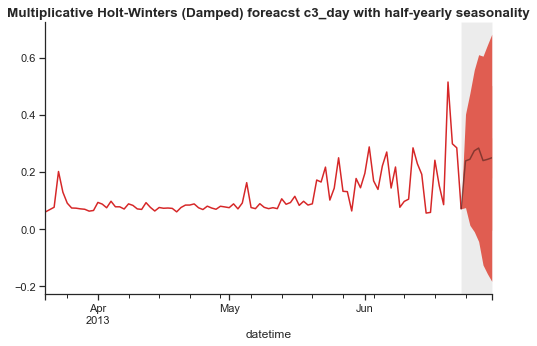

In [105]:
h = len(test_sets['c3_day'])
freq_c3_day = combined_train_sets['c3_day'].index.freq

test = pd.period_range(start=test_sets['c3_day'].index[0], periods=h, freq=freq_c3_day)

pred_c3_day = pd.Series(c3_day_ahw.forecast(h), index=test)

intv_c3_day= pd.DataFrame(c3_day_ahw.intervalforecast(h, level=0.95), index=test)
intv1 = pd.DataFrame(c3_day_ahw.intervalforecast(h, level=0.75), index=test)
intv2 = pd.DataFrame(c3_day_ahw.intervalforecast(h, level=0.25), index=test)

fig, ax = forecast.fanchart(combined_train_sets['c3_day'][-96:], pred_c3_day, intv_c3_day, intv1, intv2)

plt.title(f'Multiplicative Holt-Winters (Damped) foreacst c3_day with half-yearly seasonality', fontsize=13.5, fontweight='bold')

print(f'Multiplicative Holt-Winters (Damped) forecast for c1_monh with seasonality = 12:')
print(pred_c3_day)
print(f'Interval probabilistic forecast at 95% quantile:')
print(intv_c3_day)


sns.despine()
plt.show()

In [86]:
# Calculate MAE
mae_c3_day = mean_absolute_error(test_sets['c3_day'], pred_c3_day)

# Print MAE
print(f"Mean Absolute Error for c3_day: {mae_c3_day}")

Mean Absolute Error for c3_day: 0.11281665759095524


### Forecast for c3_month

In [87]:
c3_month_mhw=forecast.holtwinters(combined_train_sets['c3_month'], additive=False, damped=False, m=12) 
c3_month_mhw.fit()
c3_month_mhw.summary()

 Multiplicative Holt-winters exponential smoothing

 Smoothing parameters:
 alpha (level)    0.387 (0.144)
 beta  (trend)    0.018 (0.105)
 delta (seasonal) 1.000 (0.367)
 
 In-sample fit:
 MSE               4771.349
 RMSE              69.075
 Log-likelihood   -197.895
 AIC               403.789
 BIC               410.011


Additive Holt-Winters forecast for c1_monh with seasonality = 17520:
2013-06    266.162473
Freq: M, dtype: float64
Interval probabilistic forecast at 95% quantile:
                 0           1
2013-06  130.77805  401.546895


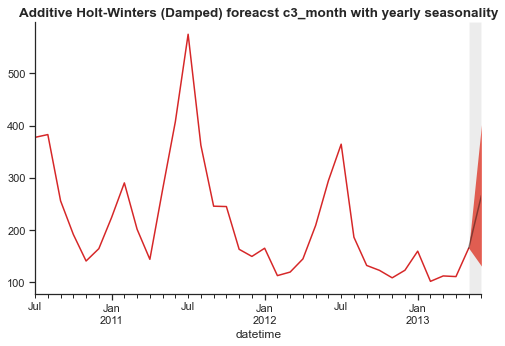

In [88]:
h = len(test_sets['c3_month'])
freq_c3_month = combined_train_sets['c3_month'].index.freq

test = pd.period_range(start=test_sets['c3_month'].index[0], periods=h, freq=freq_c3_month)

pred_c3_month = pd.Series(c3_month_mhw.forecast(h), index=test)

intv_c3_month= pd.DataFrame(c3_month_mhw.intervalforecast(h, level=0.95), index=test)
intv1 = pd.DataFrame(c3_month_mhw.intervalforecast(h, level=0.75), index=test)
intv2 = pd.DataFrame(c3_month_mhw.intervalforecast(h, level=0.25), index=test)

fig, ax = forecast.fanchart(combined_train_sets['c3_month'][-96:], pred_c3_month, intv_c3_month, intv1, intv2)

plt.title(f'Additive Holt-Winters (Damped) foreacst c3_month with yearly seasonality', fontsize=13.5, fontweight='bold')

print(f'Additive Holt-Winters forecast for c1_monh with seasonality = 17520:')
print(pred_c3_month)
print(f'Interval probabilistic forecast at 95% quantile:')
print(intv_c3_month)


sns.despine()
plt.show()

In [89]:
# Calculate MAE
mae_c3_month = mean_absolute_error(test_sets['c3_month'], pred_c3_month)

# Print MAE
print(f"Mean Absolute Error for c3_month: {mae_c3_month}")

Mean Absolute Error for c3_month: 2.9544725073672566


### Forecast for c4

In [90]:
c4_ahw=forecast.holtwinters(combined_train_sets['c4'], additive=True, damped=False, m=48*365) 
c4_ahw.fit()
c4_ahw.summary()

 Additive Holt-winters exponential smoothing

 Smoothing parameters:
 alpha (level)    0.875 (0.004)
 beta  (trend)    0.000 (0.004)
 delta (seasonal) 1.000 (0.028)
 
 In-sample fit:
 MSE               0.037
 RMSE              0.192
 Log-likelihood    12134.729
 AIC               -24261.457
 BIC               -24225.978


Additive Holt-Winters forecast for c1_monh with seasonality = 17520:
2013-06-30 00:00    0.082040
2013-06-30 00:30    0.076341
2013-06-30 01:00    0.085757
2013-06-30 01:30    0.085308
2013-06-30 02:00    0.085250
2013-06-30 02:30    0.084993
2013-06-30 03:00    0.077209
2013-06-30 03:30    0.067360
2013-06-30 04:00    0.080010
2013-06-30 04:30    0.162109
2013-06-30 05:00    0.128218
2013-06-30 05:30    0.098109
2013-06-30 06:00    0.241636
2013-06-30 06:30    0.091630
2013-06-30 07:00    0.083659
2013-06-30 07:30    0.080904
2013-06-30 08:00    0.077333
2013-06-30 08:30    0.071638
2013-06-30 09:00    0.087748
2013-06-30 09:30    0.057461
2013-06-30 10:00    0.080775
2013-06-30 10:30    0.088551
2013-06-30 11:00    0.073765
2013-06-30 11:30    0.067440
2013-06-30 12:00    0.079776
2013-06-30 12:30    0.073689
2013-06-30 13:00    0.076802
2013-06-30 13:30    0.101445
2013-06-30 14:00    0.216919
2013-06-30 14:30    0.192697
2013-06-30 15:00    0.544739
2013-06-30 15:30    0.413255
201

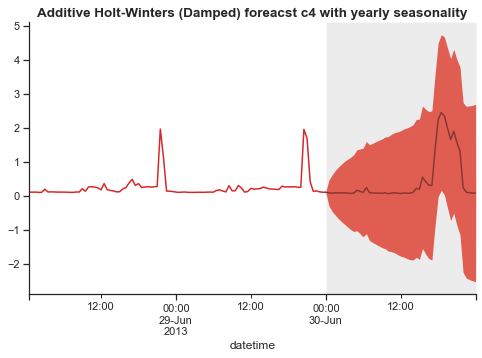

In [91]:
h = len(test_sets['c4'])
freq_c4 = combined_train_sets['c4'].index.freq

test = pd.period_range(start=test_sets['c4'].index[0], periods=h, freq=freq_c4)

pred_c4 = pd.Series(c4_ahw.forecast(h), index=test)

intv_c4= pd.DataFrame(c4_ahw.intervalforecast(h, level=0.95), index=test)
intv1 = pd.DataFrame(c4_ahw.intervalforecast(h, level=0.75), index=test)
intv2 = pd.DataFrame(c4_ahw.intervalforecast(h, level=0.25), index=test)

fig, ax = forecast.fanchart(combined_train_sets['c4'][-96:], pred_c4, intv_c4, intv1, intv2)

plt.title(f'Additive Holt-Winters (Damped) foreacst c4 with yearly seasonality', fontsize=13.5, fontweight='bold')

print(f'Additive Holt-Winters forecast for c1_monh with seasonality = 17520:')
print(pred_c4)
print(f'Interval probabilistic forecast at 95% quantile:')
print(intv_c4)


sns.despine()
plt.show()

In [92]:
# Calculate MAE
mae_c4 = mean_absolute_error(test_sets['c4'], pred_c4)

# Print MAE
print(f"Mean Absolute Error for c4: {mae_c4}")

Mean Absolute Error for c4: 0.3618011533023817


### Forecast for c4_day

(<Figure size 576x360 with 1 Axes>, <AxesSubplot:xlabel='datetime'>)

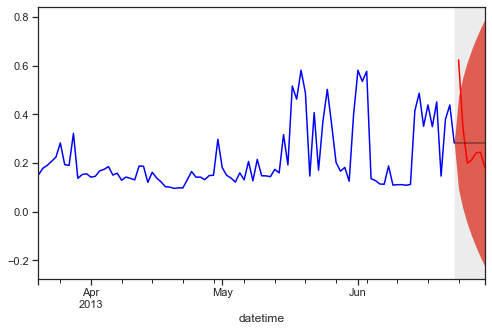

In [93]:
h = len(test_sets['c4_day'])
freq_c4_day = combined_train_sets['c4_day'].index.freq
test=pd.period_range(start=test_sets['c4_day'].index[0], periods=h, freq=freq_c4_day)
pred_c4_day=pd.Series(np.repeat(combined_train_sets['c4_day'].iloc[-1], h), index=test) # the forecast repeats the last observed values h times
resid=combined_train_sets['c4_day']-combined_train_sets['c4_day'].shift(1) # the shift lags the series by one period
sigma = resid.std()
intv_c4_day = pd.concat([pred_c4_day-stats.norm.ppf(1-(1-0.95)/2)*sigma*np.sqrt(np.arange(1,h+1)),
                   pred_c4_day+stats.norm.ppf(1-(1-0.95)/2)*sigma*np.sqrt(np.arange(1,h+1))], axis=1)
intv_c4_day.round(3)
fanchart(combined_train_sets['c4_day'][-96:], test_sets['c4_day'], pred_c4_day, intv_c4_day)

In [94]:
# Calculate MAE
mae_c4_day = mean_absolute_error(test_sets['c4_day'], pred_c4_day)

# Print MAE
print(f"Mean Absolute Error for c4_day: {mae_c4_day}")

Mean Absolute Error for c4_day: 0.10505059523809523


### Forecast for c4_month

In [95]:
c4_month_ahw=forecast.holtwinters(combined_train_sets['c4_month'], additive=True, damped=True, m=6) 
c4_month_ahw.fit()
c4_month_ahw.summary()

 Additive Holt-winters exponential smoothing (damped trend)

 Smoothing parameters:
 alpha (level)    0.000 (0.128)
 beta  (trend)    0.000 (0.167)
 delta (seasonal) 0.153 (0.212)
 phi (damping)    0.909 (0.177)
 
 In-sample fit:
 MSE               3489.894
 RMSE              59.075
 Log-likelihood   -192.421
 AIC               394.843
 BIC               402.619


Additive Holt-Winters (Damped) forecast for c4_month_monh with seasonality = 6:
2013-06    302.103124
Freq: M, dtype: float64
Interval probabilistic forecast at 95% quantile:
                  0           1
2013-06  186.317615  417.888634


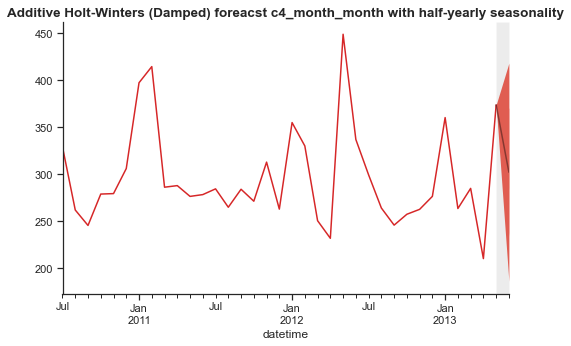

In [96]:
h = len(test_sets['c4_month'])
freq_c4_month = combined_train_sets['c4_month'].index.freq

test = pd.period_range(start=test_sets['c4_month'].index[0], periods=h, freq=freq_c4_month)

pred_c4_month = pd.Series(c4_month_ahw.forecast(h), index=test)

intv_c4_month= pd.DataFrame(c4_month_ahw.intervalforecast(h, level=0.95), index=test)
intv1 = pd.DataFrame(c4_month_ahw.intervalforecast(h, level=0.75), index=test)
intv2 = pd.DataFrame(c4_month_ahw.intervalforecast(h, level=0.25), index=test)

fig, ax = forecast.fanchart(combined_train_sets['c4_month'][-96:], pred_c4_month, intv_c4_month, intv1, intv2)

plt.title(f'Additive Holt-Winters (Damped) foreacst c4_month_month with half-yearly seasonality', fontsize=13.5, fontweight='bold')

print(f'Additive Holt-Winters (Damped) forecast for c4_month_monh with seasonality = 6:')
print(pred_c4_month)
print(f'Interval probabilistic forecast at 95% quantile:')
print(intv_c4_month)


sns.despine()
plt.show()

In [97]:
# Calculate MAE
mae_c4_month = mean_absolute_error(test_sets['c4_month'], pred_c4_month)

# Print MAE
print(f"Mean Absolute Error for c4_month: {mae_c4_month}")

Mean Absolute Error for c4_month: 115.61287582848468


# Comparison Problem

<span style="color: red; font-size: 18px; font-weight: bold;">c1 (half-hourly) level</span>

best model for c1 is Simple Exponential Smoothing, we will fit this model for c1 and forecast the next day (next 48 half-hours)

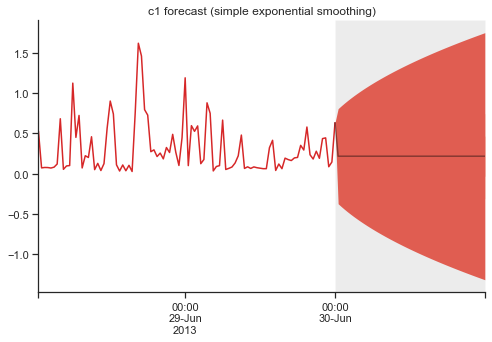

In [98]:
h= 48

model = ses_c1
freq_c1 = combined_train_sets['c1'].index.freq

test=pd.period_range(start=test_sets['c1'].index[0], periods=h, freq=freq_c1)

pred_c1=pd.Series(model.forecast(h), index=test)

intv1=pd.DataFrame(model.intervalforecast(h, level=.95), index=test)
intv2=pd.DataFrame(model.intervalforecast(h, level=.25), index=test)
intv3=pd.DataFrame(model.intervalforecast(h, level=.50), index=test)
#fanchart(combined_train_sets['c1'][-96:], test_sets['c1'], pred, intv1)
fig, ax = forecast.fanchart(combined_train_sets['c1'][-96:], pred_c1, intv1,intv2,intv3)
ax.set_xlabel('')
ax.set_xticks([], minor=True)
plt.title('c1 forecast (simple exponential smoothing)')

sns.despine()
plt.show()

In [99]:
# Print MAE
print(f"Mean Absolute Error for c1: {mae_c1}")

Mean Absolute Error for c1: 0.3078061604478097


<span style="color: red; font-size: 18px; font-weight: bold;">c1_day (daily) level</span>

In [100]:
ses_c1_day=forecast.ses(combined_train_sets['c1_day'])
ses_c1_day.fit()
ses_c1_day.summary()

 Simple exponential smoothing

 Smoothing parameter:
 alpha  0.232 (0.027) 

 In-sample fit:
 MSE               0.005
 Log-likelihood    1300.726
 AIC               -2595.452
 BIC               -2580.473


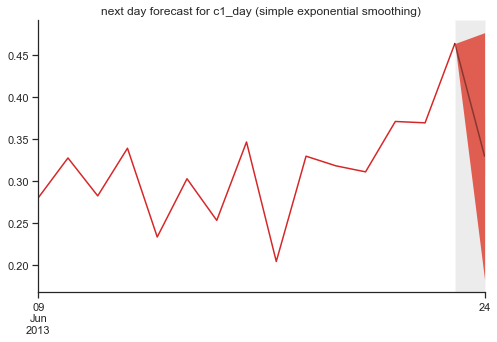

In [101]:
h= 1

model = ses_c1_day
freq_c1_day = combined_train_sets['c1_day'].index.freq

test=pd.period_range(start=combined_train_sets['c1_day'].index[-1]+1, periods=h, freq=freq_c1_day)

pred_c1_day=pd.Series(model.forecast(h), index=test)

intv1=pd.DataFrame(model.intervalforecast(h, level=.95), index=test)
intv2=pd.DataFrame(model.intervalforecast(h, level=.25), index=test)
intv3=pd.DataFrame(model.intervalforecast(h, level=.50), index=test)
#fanchart(combined_train_sets['c1_day'][-96:], test_sets['c1_day'], pred, intv1)
fig, ax = forecast.fanchart(combined_train_sets['c1_day'][-15:], pred_c1_day, intv1,intv2,intv3)
ax.set_xlabel('')
ax.set_xticks([], minor=True)
plt.title('next day forecast for c1_day (simple exponential smoothing)')

sns.despine()
plt.show()

In [102]:
# Calculate MAE
mae_c1_day = mean_absolute_error(test_sets['c1_day'][:1], pred_c1_day)

# Print MAE
print(f"Mean Absolute Error for c1_day: {mae_c1_day}")

Mean Absolute Error for c1_day: 0.13261880701012724


- Base on the Mean Absolute Error of c1 and c1_day when predicting the next day. It can be seen that c1_day performs better with a MAE of ~ 0.13 while c1 has a MAE of ~0.31.

### Improve forecasting performance

#### To use the daily dataset to improve the half-hourly dataset, we could consider the following

- Anomaly Detection: When the daily forecast shows a specific pattern, monitor the half-hourly data for anomalies or deviations from this pattern. For instance, if the daily forecast predicts consistently throughout the day but the half-hourly data shows unusual spikes, investigate the reasons for these spikes.

- Rolling Daily Forecasts: Update the daily forecast on a rolling basis based on observed half-hourly data. This allows the daily forecast to adapt to changing consumption patterns and trends